In [65]:
import mdtraj as md
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import matplotlib.colors as colors

import pyemma as pe
import pyemma.coordinates as coor

from enspara import geometry
from collections import Counter
import os
import pickle
from scipy.stats import linregress
from tqdm import tqdm
from multiprocessing import Pool
from enspara import ra
from enspara.msm import MSM, builders, implied_timescales
from functools import partial
from glob import glob
import sys
from scipy import stats
from collections import defaultdict
from scipy.spatial.distance import cdist
import matplotlib.patheffects as PathEffects

import json

from scipy.stats import gaussian_kde

plt.style.use("manuscript")
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:85% !important; }</style>"))

In [2]:
bowmore_path = '/mnt/bowmore'
output_figure_directory = f'{bowmore_path}/bowmore/ameller/projects/figures/specificity'

# Functions

In [3]:
def residue_to_resid(traj, resSeq, chainid):
    return traj.top.atom(traj.top.select(f'resSeq {resSeq} and chainid {chainid}')[0]).residue.index

In [328]:
def trim_and_weight_observable(ra_data, ra_assignments, msm_obj, stride=1):
    '''
        stride : how much observable has been strided relative to the assignments file
        
        returns:
        trimmed_observable : array with original data
        frame_weights : probability assigned to each frame (that MSM state's probability / N) where N is the number of frames in that state
    '''
    # filter observable to those values that are relevant after trimming
    active_states = np.array(list(msm_obj.mapping_.to_original.values()))
    print(active_states)
    print(np.unique(ra_assignments._data))
    state_counts = np.bincount([s for traj in ra_assignments for s in traj[::stride]])[active_states]
    
    trimmed_observable = np.array(
        [
            o
            for i, traj_observable in enumerate(ra_data)
            for j, o in enumerate(traj_observable)
            if ra_assignments[i][j * stride] in active_states
        ]
    )
    
    frame_weights = np.array(
        [
            (msm_obj.eq_probs_[msm_obj.mapping_.to_mapped[s]] / 
             state_counts[msm_obj.mapping_.to_mapped[s]])
            for traj in ra_assignments for s in traj[::stride]
            if s in active_states
        ]
    )
    
    print(np.sum(frame_weights))
    assert np.abs(np.sum(frame_weights) - 1) <= 0.01
    
    return trimmed_observable, frame_weights

In [81]:
def calc_p_over_threshold(observable, probs, cutoff=None):
    return np.sum(probs[observable >= cutoff])

def run_bootstrap_trial_rn(assigns, observable, lag_time_frames, aggregation_method, stride=1, **kwargs):
    '''
        assigns: RaggedArray
        observable: RaggedArray
    '''
    # sample trajectories with replacement
    # default is replace=True but leaving here for emphasis
    trjs_to_sample = np.random.choice(len(assigns), size=len(assigns), replace=True)
    
    # subsample assignments and observable
    sampled_assigns = ra.RaggedArray([
        trj for trj in assigns[trjs_to_sample]
    ])
    sampled_observable = observable[trjs_to_sample]
    
    # fit MSM to sampled assignment file
    n_states = np.unique(sampled_assigns._data).shape[0]
    b = partial(builders.normalize, prior_counts=1/n_states)
    msm_obj = MSM(lag_time=lag_time_frames, method=b, trim=True)
    msm_obj.fit(sampled_assigns)
    
    trimmed_observable, frame_weights = trim_and_weight_observable(sampled_observable, sampled_assigns, msm_obj, stride)
    return aggregation_method(trimmed_observable, frame_weights, **kwargs)

def run_bootstrap_trial_mle(assigns, observable, lag_time_frames, aggregation_method, stride=1, **kwargs):
    '''
        assigns: RaggedArray
        observable: RaggedArray
    '''
    # sample trajectories with replacement
    # default is replace=True but leaving here for emphasis
    trjs_to_sample = np.random.choice(len(assigns), size=len(assigns), replace=True)
    
    # subsample assignments and observable
    sampled_assigns = assigns[trjs_to_sample]
    sampled_observable = observable[trjs_to_sample]
    
    # fit MSM to sampled assignment file
    msm = pe.msm.estimate_markov_model(list(sampled_assigns), lag=lag_time_frames, reversible=True)
    
    return aggregation_method(sampled_observable._data, np.concatenate(msm.trajectory_weights()), **kwargs)

In [164]:
def run_bootstrap_trial_mle_frame_picker(assigns, observable, lag_time_frames, mapping_from_original, aggregation_method, **kwargs):
    '''
        Input:
        assigns: RaggedArray
        observable: length N RaggedArray where N is the number of states in a MSM.
                    Each of the N-trajectories corresponds to the observable values for a set of selected frames
        mapping_from_original: dictionary from state definitions in assignments to those in the MSM for which the observable list is constructed
        
        Run bootstrap trial where we draw trajectories with replacement and construct an MSM with these trajectories.
        The observable is subsampled based on which states remain in the MSM. In this method, we do not make random draws
        from each MSM state.
    '''
    from math import isclose
    
    # sample trajectories with replacement
    # default is replace=True but leaving here for emphasis
    trjs_to_sample = np.random.choice(len(assigns), size=len(assigns), replace=True)
    
    # subsample assignments and observable
    sampled_assigns = assigns[trjs_to_sample]
    
    # fit MSM to sampled assignment file
    msm = pe.msm.estimate_markov_model(list(sampled_assigns), lag=lag_time_frames, reversible=True)
    print(msm.pi.max())
    
#     print(len(observable))
#     print(len(msm.active_set))
    
    original_states_in_msm = np.array([mapping_from_original[s] for s in msm.active_set])
    sampled_observable = observable[original_states_in_msm]
#     print(len(sampled_observable))
    
    # determine frame weights
    frame_weights = [[msm.pi[i] / len(frames) for _ in range(len(frames))]
                     for i, frames in enumerate(sampled_observable)]
    
    sum_fw = sum([sum(fw) for fw in frame_weights])
    assert isclose(sum_fw, 1.0)
    
    return aggregation_method(sampled_observable._data, np.concatenate(frame_weights), **kwargs)

In [222]:
def run_bootstrap_trial_mle_frame_picker_random_frame_selection(assigns, observable,
                                                                lag_time_frames, mapping_from_original,
                                                                aggregation_method, n_trials, **kwargs):
    '''
        Input:
        assigns: RaggedArray
        observable: length N RaggedArray where N is the number of states in a MSM.
                    Each of the N-trajectories corresponds to the observable values for a set of selected frames
        mapping_from_original: dictionary from state definitions in assignments to those in the MSM for which the observable list is constructed
        n_trials: the number of estimates to generate for each MSM
        
        Run bootstrap trial where we draw trajectories with replacement and construct an MSM with these trajectories.
        The observable is subsampled based on which states remain in the MSM. In this method, we do not make random draws
        from each MSM state.
    '''
    from math import isclose
    
    # sample trajectories with replacement
    # default is replace=True but leaving here for emphasis
    trjs_to_sample = np.random.choice(len(assigns), size=len(assigns), replace=True)
    
    # subsample assignments and observable
    sampled_assigns = assigns[trjs_to_sample]
    
    # fit MSM to sampled assignment file
    msm = pe.msm.estimate_markov_model(list(sampled_assigns), lag=lag_time_frames, reversible=True)
    print(msm.pi.max())
    
#     print(len(observable))
#     print(len(msm.active_set))
    
    original_states_in_msm = np.array([mapping_from_original[s] for s in msm.active_set])
    sampled_observables = [
        [np.random.choice(observable_vals, size=len(observable_vals), replace=True)
         for observable_vals in observable[original_states_in_msm]]
        for _ in range(n_trials)
    ]
#     print(len(sampled_observable))
    
    # determine frame weights
    frame_weights = [[msm.pi[i] / len(frames) for _ in range(len(frames))]
                     for i, frames in enumerate(sampled_observables[0])]
    
    sum_fw = sum([sum(fw) for fw in frame_weights])
    assert isclose(sum_fw, 1.0)
    
    bootstrapped_observables = [
        aggregation_method(np.concatenate(sampled_observable), np.concatenate(frame_weights), **kwargs)
        for sampled_observable in sampled_observables
    ]
    
    return bootstrapped_observables

In [132]:
def IC50_to_deltaG(ic50, T=298):
    '''
        ic50: float in micromolar units
        T: in kelvin
        
        returns deltaG in kcal / mol
    '''
    # for uncompetitive inhibitor with substrate satruation ([S] >> Km)
    Ki = ic50 * 1e-6
    
    R = 1.987204 # 	cal⋅K−1⋅mol−1
    # because Ki is a dissociation constant ([p][l]/[pl]), we use the association constant to follow convention
    # where negative delta Gs indicate more favorable binding
    deltaG = -(R * T) * np.log(1 / Ki)
    
    # convert to kcal
    deltaG = deltaG / 1000
    
    return deltaG

In [84]:
def msm_docking_aggregation(deltaGs, probabilities, T=300):
    '''
        deltaGs: in units of kcal / mol
        probabilities: probability of each state in deltaGs
        T: temperature in kelvin
    '''
    R = 1.987204 / 1000 # kcal⋅K−1⋅mol−1
    RT = R * T
    microscopic_Kis = np.exp(-deltaGs / RT)
    
    overall_deltaG = -RT * np.log(np.sum(probabilities * microscopic_Kis))
    return overall_deltaG



# Experimental Data - Actin-activated ATPase IC50s/Kis

In [252]:
experimental_data = pd.read_csv(f'{bowmore_path}/bowmore/ameller/projects/experimental-data/compiled_blebbistatin_ic50s.csv')

In [253]:
experimental_data

,Isoform,Gene,Species,IC50/Ki,Citation
0,Skeletal Muscle Myosin II,MYH2,Rabbit,0.11,Varkuti et. al.
1,Fast skeletal,MYH2,Rabbit,0.50,Limouze et. al.
2,Skeletal Muscle Myosin II,MYH2,Rabbit,0.28,Radnai et. al.
3,Beta-cardiac,MYH7,Porcine,1.20,Limouze et. al.
4,Beta-cardiac,MYH7,Porcine,1.90,Radnai et. al.
5,Nonmuscle Myosin IIA,MYH9,Human,5.10,Limouze et. al.
6,Nonmuscle Myosin IIA,MYH9,Human,3.58,Zhang et. al.
7,Nonmuscle Myosin IIA,MYH9,Human,2.90,Radnai et. al.
8,Nonmuscle Myosin IIB,MYH10,Chicken,1.80,Limouze et. al.
9,Nonmuscle Myosin IIB,MYH10,Human,2.30,Zhang et. al.


Exclude Eddinger work since the publication lacks experimental details and figures for their ATPase reaction

In [254]:
experimental_data = experimental_data.drop([14])
experimental_data

,Isoform,Gene,Species,IC50/Ki,Citation
0,Skeletal Muscle Myosin II,MYH2,Rabbit,0.11,Varkuti et. al.
1,Fast skeletal,MYH2,Rabbit,0.50,Limouze et. al.
2,Skeletal Muscle Myosin II,MYH2,Rabbit,0.28,Radnai et. al.
3,Beta-cardiac,MYH7,Porcine,1.20,Limouze et. al.
4,Beta-cardiac,MYH7,Porcine,1.90,Radnai et. al.
5,Nonmuscle Myosin IIA,MYH9,Human,5.10,Limouze et. al.
6,Nonmuscle Myosin IIA,MYH9,Human,3.58,Zhang et. al.
7,Nonmuscle Myosin IIA,MYH9,Human,2.90,Radnai et. al.
8,Nonmuscle Myosin IIB,MYH10,Chicken,1.80,Limouze et. al.
9,Nonmuscle Myosin IIB,MYH10,Human,2.30,Zhang et. al.


Exclude experiments conducted with unphosphorylated myosins because actin activation is phosphorylation-dependent (https://pubs.acs.org/doi/10.1021/bi036007l)

In [255]:
experimental_data = experimental_data.drop([10, 11])
experimental_data

,Isoform,Gene,Species,IC50/Ki,Citation
0,Skeletal Muscle Myosin II,MYH2,Rabbit,0.11,Varkuti et. al.
1,Fast skeletal,MYH2,Rabbit,0.50,Limouze et. al.
2,Skeletal Muscle Myosin II,MYH2,Rabbit,0.28,Radnai et. al.
3,Beta-cardiac,MYH7,Porcine,1.20,Limouze et. al.
4,Beta-cardiac,MYH7,Porcine,1.90,Radnai et. al.
5,Nonmuscle Myosin IIA,MYH9,Human,5.10,Limouze et. al.
6,Nonmuscle Myosin IIA,MYH9,Human,3.58,Zhang et. al.
7,Nonmuscle Myosin IIA,MYH9,Human,2.90,Radnai et. al.
8,Nonmuscle Myosin IIB,MYH10,Chicken,1.80,Limouze et. al.
9,Nonmuscle Myosin IIB,MYH10,Human,2.30,Zhang et. al.


In [256]:
experimental_Kis = experimental_data.loc[experimental_data['Citation'] == 'Radnai et. al.', :]

In [257]:
experimental_Kis

,Isoform,Gene,Species,IC50/Ki,Citation
2,Skeletal Muscle Myosin II,MYH2,Rabbit,0.28,Radnai et. al.
4,Beta-cardiac,MYH7,Porcine,1.90,Radnai et. al.
7,Nonmuscle Myosin IIA,MYH9,Human,2.90,Radnai et. al.
16,Smooth Muscle Myosin II,MYH11,Chicken,3.20,Radnai et. al.


In [258]:
experimental_IC50s = experimental_data.loc[experimental_data['Citation'] != 'Radnai et. al.', :]

In [259]:
experimental_IC50s

,Isoform,Gene,Species,IC50/Ki,Citation
0,Skeletal Muscle Myosin II,MYH2,Rabbit,0.11,Varkuti et. al.
1,Fast skeletal,MYH2,Rabbit,0.50,Limouze et. al.
3,Beta-cardiac,MYH7,Porcine,1.20,Limouze et. al.
5,Nonmuscle Myosin IIA,MYH9,Human,5.10,Limouze et. al.
6,Nonmuscle Myosin IIA,MYH9,Human,3.58,Zhang et. al.
8,Nonmuscle Myosin IIB,MYH10,Chicken,1.80,Limouze et. al.
9,Nonmuscle Myosin IIB,MYH10,Human,2.30,Zhang et. al.
12,Phosphorylated Smooth Muscle Myosin II,MYH11,Chicken,23.50,Wang et. al.
13,Smooth Muscle Myosin,MYH11,Chicken,6.47,Zhang et. al.
15,Smooth Muscle Myosin,MYH11,Turkey,79.60,Limouze et. al.


In [760]:
# mean IC50s/Kis across numerous ATPase assays
IC50s = {
    g: np.mean(experimental_data.loc[experimental_data['Gene'] == g.upper(), 'IC50/Ki'])
    for g in ['myh11', 'myh9', 'myh7', 'myh2', 'myh10', 'myh7b']
    
}

# add non-class II myosins
IC50s['myo10'] = 150
IC50s['myo5a'] = 150
IC50s['myo1b'] = 150

# add 'myo2b' -- eLife datasets used this fake gene name for myosin 2b
IC50s['myo2b'] = IC50s['myh10']

IC50s

{'myh11': 28.1925,
 'myh9': 3.86,
 'myh7': 1.373333333333333,
 'myh2': 0.2966666666666667,
 'myh10': 2.05,
 'myh7b': 0.36,
 'myo10': 150,
 'myo5a': 150,
 'myo1b': 150,
 'myo2b': 2.05}

# MSM Fitting

In [456]:
topology_paths = {
    'myh11-1br2': '/project/bowmanlab/j.lotthammer/Simulations/myosin/specificity/pps-bleb-isoforms/myh11/eq/myh11-1br2-holo-prot-masses.pdb',
    'myh2-5n6a': '/project/bowmanlab/j.lotthammer/Simulations/myosin/specificity/pps-bleb-isoforms/myh2/eq/myh2-5n6a-holo-prot-masses.pdb',
    'myh7-5n6a': '/project/bowmanlab/j.lotthammer/Simulations/myosin/specificity/pps-bleb-isoforms/myh7/eq/myh7-5n6a-holo-prot-masses.pdb',
    'myh9-5i4e': '/project/bowmanlab/j.lotthammer/Simulations/myosin/specificity/pps-bleb-isoforms/myh9/eq/myh9-5I4E-holo-prot-masses.pdb',
    'myh2-6fsa': '/project/bowmanlab/j.lotthammer/Simulations/myosin/specificity/ck-pocket/myh2/input_files/myh2-6fsa-holo-prot-masses.pdb',
    'myh7b-hs-5n6a': '/project/bowmanlab/j.lotthammer/Simulations/myosin/myosin-7b/act_site_redo/eq/myh7b-5n6a-holo-prot-masses.pdb'
}

topologies = {}

for p, path in topology_paths.items():
    topologies[p] = md.load(path.replace('project', bowmore_path))

In [563]:
labels = {
    'myh2-6fsa': 'Skeletal Muscle Myosin IIA (ATP-bound, Post-rigor)',
    'myh11-1br2': 'Smooth Muscle Myosin',
    'myh9-5i4e': 'Nonmuscle Myosin IIA',
    'myh2-5n6a': 'Skeletal Muscle Myosin IIA',
    'myh7-5n6a': r'$\beta$-Cardiac Myosin',
    'myh7b-hs-5n6a': 'MYH7b'
}

In [491]:
# input_features = 'backbone-chi1-dihedrals-bleb-pocket'
# input_features = 'backbone-all-chis-dihedrals-bleb-pocket'

input_features = 'backbone-chi1-chis-dihedrals-bleb-pocket'

### VAMP Scan Results

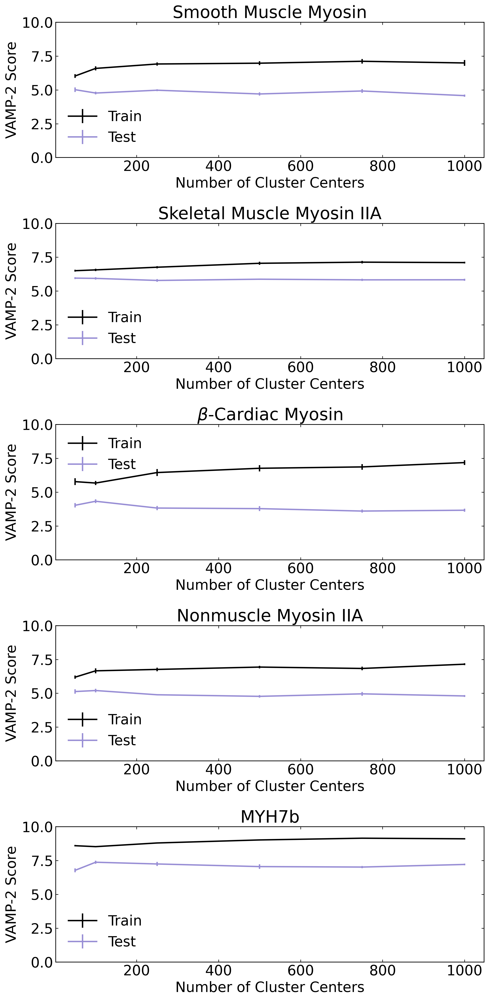

In [492]:
fig, axes = plt.subplots(5, 1, figsize=(10, 20))

i = 0
for p in topologies.keys():
    if p == 'myh7b-hs-5n6a':
        vamp_path = (f'/{bowmore_path}/bowmore/j.lotthammer/tica-clustering/myh7b-hs/vamp-scan/'
                     f'myh7b-hs-{input_features}-charmm36-sims-lag-500'
                     '-tica-reduced-vamp-scan-lagtime-500-k-50-100-250-500-750-1000')
    elif p == 'myh2-6fsa':
        continue
    else:
        vamp_path = (f'/{bowmore_path}/bowmore/j.lotthammer/tica-clustering/{p}/vamp-scan/'
                     f'{p}-{input_features}-charmm36-sims-lag-500'
                     '-tica-reduced-vamp-scan-lagtime-500-k-50-100-250-500-750-1000')
    
    vamp_train_scores = np.load(f'{vamp_path}-train.npy')
    
    vamp_test_scores = np.load(f'{vamp_path}-test.npy')
    k = [50, 100, 250, 500, 750, 1000]

    axes[i].errorbar(k, vamp_train_scores.mean(axis=1),
                     yerr=vamp_train_scores.std(axis=1) / np.sqrt(vamp_train_scores.shape[1]), label='Train')
    axes[i].errorbar(k, vamp_test_scores.mean(axis=1),
                     yerr=vamp_test_scores.std(axis=1) / np.sqrt(vamp_test_scores.shape[1]), label='Test')
    
#     if p == 'myh7b-5n6a':
#         print(vamp_test_scores)
    axes[i].legend()
    axes[i].set_ylabel('VAMP-2 Score')
    axes[i].set_xlabel('Number of Cluster Centers')
    axes[i].set_title(labels[p])
    axes[i].set_ylim((0, 10))
    i += 1

plt.tight_layout()

plt.savefig(f'{output_figure_directory}/supplement/lag-500-train-test-split-vamp2-scan.pdf', dpi=300)

plt.show()

In [461]:
n_clusters = {
    'myh11-1br2': 50,
    'myh9-5i4e': 100,
    'myh7-5n6a': 100,
    'myh2-5n6a': 50,
    'myh2-6fsa': 100,
    'myh7b-hs-5n6a': 100,
}

We selected the k with the largest average test set VAMP-2 scan value

### Load assignments, generate lag times, fit MSMs

In [462]:
from pyemma import config
config.show_progress_bars = False

In [479]:
tica_lag = 500

ra_assignments_dict = {}

for p, k in n_clusters.items():
    # Load assignments
    if p == 'myh7b-hs-5n6a':
#         assignments = coor.load(f'/mnt/bowmore/bowmanlab/j.lotthammer/tica-clustering/myh7b-hs/'
#                                 f'myh7b-hs-{input_features}-charmm36-sims-'
#                                 f'lag-{tica_lag}-tica-reduced-k-{k}-cluster-dtrajs.h5')
#         assignments = coor.load(f'/mnt/bowmore/bowmore/j.lotthammer/tica-feat/myh7b-hs/'
#                                 f'myh7b-hs-backbone-all-chis-dihedrals-bleb-pocket-charmm36-sims-'
#                                 f'lag-500-tica-reduced-k-{k}-cluster-dtrajs.h5')
        assignments = coor.load(f'/mnt/bowmore/bowmore/j.lotthammer/tica-clustering/myh7b-hs/'
                                f'myh7b-hs-{input_features}-charmm36-sims-'
                                f'lag-500-tica-reduced-k-{k}-cluster-dtrajs.h5')
    elif p == 'myh2-6fsa':
        assignments = coor.load(f'/mnt/bowmore/bowmanlab/ameller/tica-clustering/{p}/'
                                f'{p}-stride-1-{input_features}-'
                                f'lag-{tica_lag}-tica-reduced-k-{k}-cluster-dtrajs.h5')
#         assignments = coor.load(f'/mnt/bowmore/bowmanlab/ameller/tica-clustering/{p}/'
#                                 f'{p}-stride-1-backbone-all-chis-dihedrals-bleb-pocket-'
#                                 f'lag-{tica_lag}-tica-reduced-k-{k}-cluster-dtrajs.h5')
        
    else:
        assignments = coor.load(f'/mnt/bowmore/bowmore/j.lotthammer/tica-clustering/{p}/'
                                f'{p}-{input_features}-charmm36-sims-'
                                f'lag-{tica_lag}-tica-reduced-k-{k}-cluster-dtrajs.h5')
    
    # Change dtype of saved assignments object 
    for i, trj in enumerate(assignments):
        assignments[i] = trj.astype(int).flatten()

    # create ragged array from assignments
    ra_assignments_dict[p] = ra.RaggedArray(assignments)

/home/artur/anaconda3/envs/enspara/lib/python3.6/site-packages/enspara-0.1.0-py3.6-linux-x86_64.egg/enspara/ra/ra.py:502: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  array = np.array(list(array))


In [480]:
frames_per_ns = 50
total_sim_time = 0

for p in n_clusters:
    ra_assigns = ra_assignments_dict[p]
    print(p)
    print(f"aggregate sim time: ", ra_assigns.lengths.sum()/frames_per_ns)
    total_sim_time += ra_assigns.lengths.sum()/frames_per_ns
    print(f"min sim time: ", ra_assigns.lengths.min()/frames_per_ns)
    print(f"med sim time: ", np.median(ra_assigns.lengths)/frames_per_ns)
    print(f"max sim time: ", ra_assigns.lengths.max()/frames_per_ns)
    print('------------------')
    
print('total sim time: ', total_sim_time)

myh11-1br2
aggregate sim time:  87002.84
min sim time:  11.02
med sim time:  20.36
max sim time:  1500.02
------------------
myh9-5i4e
aggregate sim time:  86649.02
min sim time:  10.6
med sim time:  20.08
max sim time:  1750.02
------------------
myh7-5n6a
aggregate sim time:  90076.88
min sim time:  13.52
med sim time:  21.04
max sim time:  1750.02
------------------
myh2-5n6a
aggregate sim time:  89032.66
min sim time:  1.02
med sim time:  21.02
max sim time:  1500.02
------------------
myh2-6fsa
aggregate sim time:  2733.54
min sim time:  898.44
med sim time:  910.0
max sim time:  925.1
------------------
myh7b-hs-5n6a
aggregate sim time:  100766.98
min sim time:  0.02
med sim time:  375.01
max sim time:  1500.02
------------------
total sim time:  456261.92


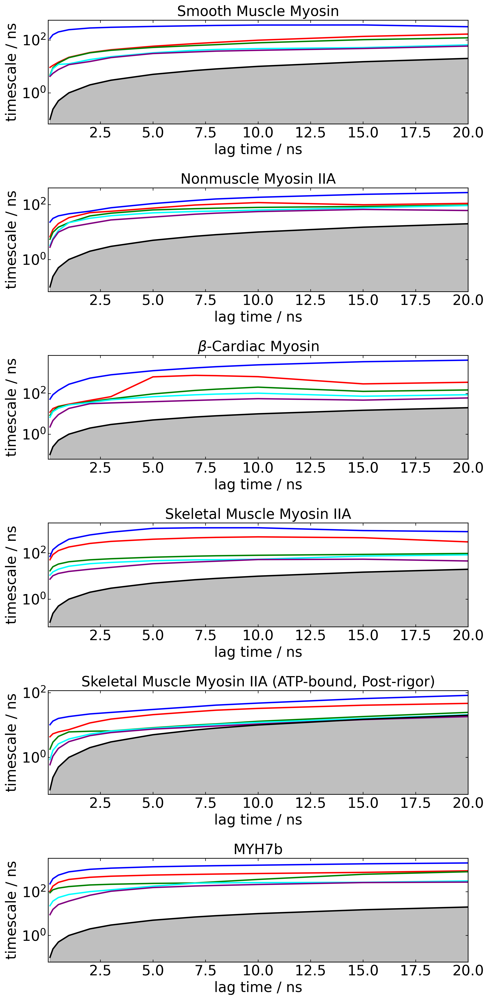

In [494]:
writeout_freq = 50
stride = 1

fig, axes = plt.subplots(6, 1, sharey=False, figsize=(10, 20))

frames_per_ns = int(writeout_freq / stride)

for i, (p, assigns) in enumerate(ra_assignments_dict.items()):
    lags_in_ns = [0.1, 0.25, 0.5, 1, 2, 3, 5, 7, 8, 10, 15, 20]
    lags_in_frames = [int(l*frames_per_ns) for l in lags_in_ns]
    its = pe.msm.its(list(assigns), lags=lags_in_frames, nits=5, reversible=True)
    
    pe.plots.plot_implied_timescales(its, ax=axes[i], ylog=True, units='ns', dt=1/frames_per_ns)
    axes[i].set_title(labels[p], fontsize=20)

plt.tight_layout()

plt.savefig(f'{output_figure_directory}/supplement/combined-implied-timescales.pdf', dpi=300)
plt.show()

In [787]:
lag_times = {
    'myh11-1br2': 5, 
    'myh9-5i4e': 8,
    'myh7-5n6a': 5,
    'myh2-5n6a': 5,
    'myh2-6fsa': 2.5,
    'myh7b-hs-5n6a': 5,
}

msm_objs = {}
for p, lt in lag_times.items():
    msm = pe.msm.estimate_markov_model(list(ra_assignments_dict[p]), lag=lt*frames_per_ns, reversible=True)
    print(p, msm.pi.max())
    msm_objs[p] = msm

myh11-1br2 0.04833067281586862
myh9-5i4e 0.033196226348882765
myh7-5n6a 0.04347564198841872
myh2-5n6a 0.10446770796354697
myh2-6fsa 0.019831023924681158
myh7b-hs-5n6a 0.04052913667855497


# Figure 2

## Query PDB for pdb structures that are homologs of myosin with the criteria described in the 'Structural Bioinformatics' Methods section. 

In [473]:
os.chdir(f"{bowmore_path}/bowmanlab/j.lotthammer/Simulations/myosin/specificity/myosin_pdbs/")
xtal_files = glob("????.pdb")
xtal_structs = {}
for prot in tqdm(xtal_files):
    p = prot.split(".")[0]
    xtal_structs[p] = md.load(f"{p}.pdb")
os.chdir(f"{bowmore_path}/bowmore/ameller/projects/notebooks/")

 75%|███████▌  | 101/134 [00:20<00:13,  2.45it/s]/home/artur/anaconda3/envs/enspara/lib/python3.6/site-packages/mdtraj/formats/pdb/pdbfile.py:198: UserWarning: Unlikely unit cell vectors detected in PDB file likely resulting from a dummy CRYST1 record. Discarding unit cell vectors.
  'cell vectors.', category=UserWarning)
100%|██████████| 134/134 [00:29<00:00,  4.52it/s]


In [474]:
cleaned_structs = {}
for prot in tqdm(xtal_structs):
    p = prot.split(".")[0]
    chain_lengths = [c.n_residues for c in xtal_structs[p].top.chains]

#     for i, chain in enumerate(xtal_structs[p].top.chains):
#         chain_lengths.append(len(list(chain.residues)))

    chainid = np.argmax(chain_lengths)
    # manually override weird pdb with lots of water molecules
    if p == '1W9I' or p == '3MNQ':
        chainid = 0
    selection = xtal_structs[p].top.select(f"chainid {chainid} and protein")
    cleaned_structs[p] = xtal_structs[p].atom_slice(selection)

100%|██████████| 134/134 [00:11<00:00, 11.71it/s]


In [475]:
# load pocket volumes that were calculated in script
# much better if we re-ran the calculation in the notebook
xtal_pocket_volumes = pickle.load(open(f'{bowmore_path}/bowmore/ameller/projects/myosin/'
                                       'BIT-pocket-volumes.pkl', 'rb'))

holo_structures = ['6Z7U', '6YSY', '3MJX', '3BZ8', '3BZ7', '3BZ9', '1YV3', '3MYK', '3MYH']

grid_spacing = 0.7
gp_volume = grid_spacing ** 3
apo_pocket_volumes = [pv*gp_volume for pdb_id, pv in xtal_pocket_volumes.items() if pdb_id not in holo_structures]

### Selecting structures for pymol inset in fig 2

In [11]:
for choice in np.random.choice(list(xtal_pocket_volumes.keys()),15):
    print(f"load {choice}-clean-with-h.pdb")

# load 4E7Z-clean-with-h.pdb
# load 1MMN-clean-with-h.pdb
# load 1KQM-clean-with-h.pdb
# load 3BZ8-clean-with-h.pdb
# load 4E7Z-clean-with-h.pdb
# load 1KQM-clean-with-h.pdb
# load 5HMP-clean-with-h.pdb
# load 3MKD-clean-with-h.pdb
# load 1D1C-clean-with-h.pdb
# load 4E7S-clean-with-h.pdb
# load 5HMP-clean-with-h.pdb
# load 5I4E-clean-with-h.pdb
# load 5O2L-clean-with-h.pdb
# load 1D0Z-clean-with-h.pdb
# load 6YCZ-clean-with-h.pdb

load 1B7T-clean-with-h.pdb
load 3I5H-clean-with-h.pdb
load 3BZ9-clean-with-h.pdb
load 4PK4-clean-with-h.pdb
load 1KK8-clean-with-h.pdb
load 6QDJ-clean-with-h.pdb
load 1SR6-clean-with-h.pdb
load 6YCX-clean-with-h.pdb
load 6YCY-clean-with-h.pdb
load 1SR6-clean-with-h.pdb
load 4PJK-clean-with-h.pdb
load 4PA0-clean-with-h.pdb
load 3MYH-clean-with-h.pdb
load 7B1A-clean-with-h.pdb
load 1BR4-clean-with-h.pdb


## Load MYH2 pocket volumes and holo xtal pocket volume

In [498]:
pocket_vols = {}

p = 'myh2-5n6a'
xtal = '1YV3'
ligand = 'BIT'
stride = 1
pocket_vols[p] = ra.load(f'/{bowmore_path}/bowmore/ameller/projects/allostery/'
                        'subset-trajectory-ligand-pocket-volumes/'
                        f'{p}-combined-{xtal}-{ligand}-ligsite-pocket-volumes-stride-{stride}-min-rank-6'
                        '-min-cluster-size-3-grid-spacing-0.07-'
                        'probe-radius-0.14-max-dist-from-ligand-0.25.h5')

In [477]:
# in pocket volume calcs across isoforms we have no hydrogens on the ligand but hydrogens on proteins
xtal_1yv3 = md.load('tmp/1yv3-protein-with-hydrogens-ligand-no-hydrogens.pdb')

all_holo_pockets = geometry.pockets.get_pockets(xtal_1yv3.atom_slice(xtal_1yv3.top.select('protein')),
                                                grid_spacing=0.07, probe_radius=0.14,
                                                min_rank=6, min_cluster_size=3)

ligand_aids = xtal_1yv3.top.select('resname BIT')
print([xtal_1yv3.top.atom(ai) for ai in ligand_aids])

ligand_xyz = xtal_1yv3.xyz[0][ligand_aids]

dists_ligand_pockets = cdist(ligand_xyz, all_holo_pockets[0].xyz[0], 'sqeuclidean')

dist_cutoff = 0.25
dist_cutoff_sq = dist_cutoff ** 2
holo_pocket_vol = np.sum(np.sum(dists_ligand_pockets < dist_cutoff_sq, axis=0) > 0)
print(holo_pocket_vol)


[BIT800-C1, BIT800-N1, BIT800-O1, BIT800-C2, BIT800-N2, BIT800-O2, BIT800-C3, BIT800-C4, BIT800-C5, BIT800-C6, BIT800-C7, BIT800-C8, BIT800-C9, BIT800-C10, BIT800-C11, BIT800-C12, BIT800-C13, BIT800-C14, BIT800-C15, BIT800-C16, BIT800-C17, BIT800-C18]
236


## Main plot

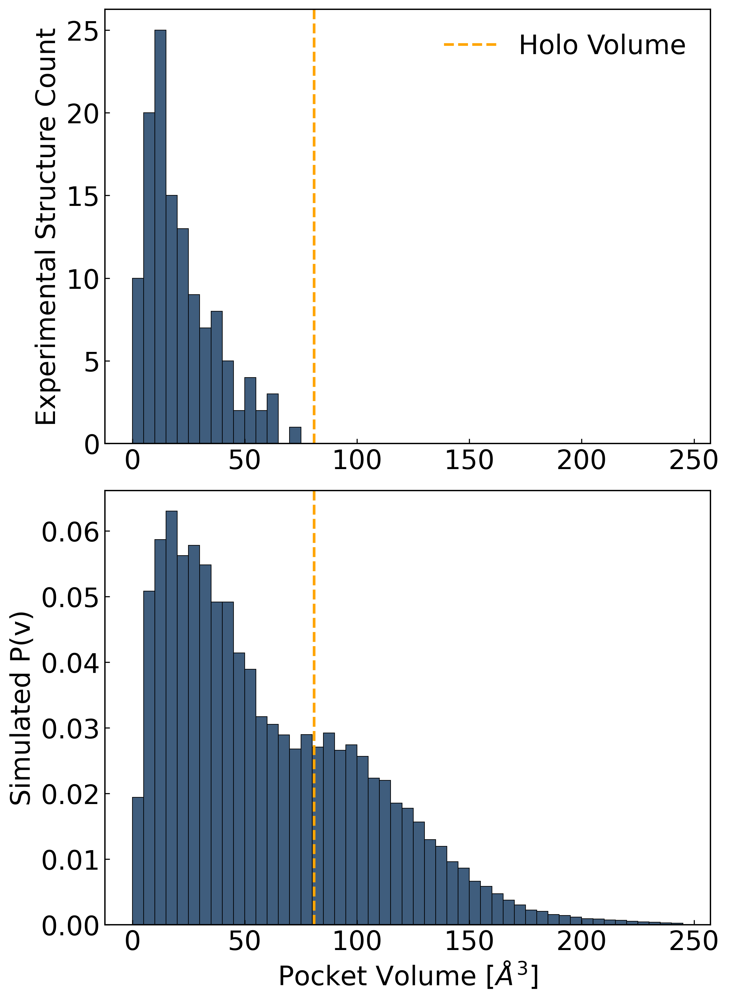

In [485]:
fig, ax = plt.subplots(2,1,figsize=(8,11),sharex=True)
bins = np.arange(0,250,5)

# plot xtal distribution
ax[0].hist(apo_pocket_volumes, bins=bins,
           color="#3F5D7D",edgecolor="black",linewidth=0.5)
ax[0].axvline(holo_pocket_vol*gp_volume, color='orange', linestyle='--', label='Holo Volume')
# ax[0].set_ylim(0,25)
ax[0].set_ylabel("Experimental Structure Count")

# plot simulation distribution
p = 'myh2-5n6a'
pv_cat = pocket_vols[p]._data
frame_weights = msm_objs[p].trajectory_weights()

assert np.alltrue([len(fw) == len(pv) for fw, pv in zip(frame_weights, pocket_vols[p])])

# pv_cat, frame_weights = trim_and_weight_observable(pocket_vols, ra_assignments_dict[p], msm_objs[p])

ax[1].hist(pv_cat*gp_volume, weights=np.concatenate(frame_weights),
           bins=bins, color="#3F5D7D", edgecolor="black", linewidth=0.5)
ax[1].axvline(holo_pocket_vol*gp_volume, color='orange', linestyle='--', label='Holo Volume')
ax[1].set_xlabel(r"Pocket Volume [$\AA^{3}$]")
# plt.hist(apo_pocket_volumes,bins=25,color="#3F5D7D",edgecolor="black",linewidth=0.5)
# plt.ylabel(r"Pocket Volume [$\AA^{3}$],fontsize=20)

plt.ylabel("Simulated P(v)")
plt.tight_layout()
ax[0].legend()
for a in ax:
#     a.spines['right'].set_visible(False)
#     a.spines['top'].set_visible(False)
    a.yaxis.set_ticks_position('left')
    a.xaxis.set_ticks_position('bottom')

# ax[0].set_ylim(0,25)
# ax[1].set_ylim(0,1600)

plt.savefig(f'{output_figure_directory}/final-submission/simulation_myh2_blebbisatin_pocket_vols_vertical.pdf', dpi=600)
plt.show()

0.9994272929055878


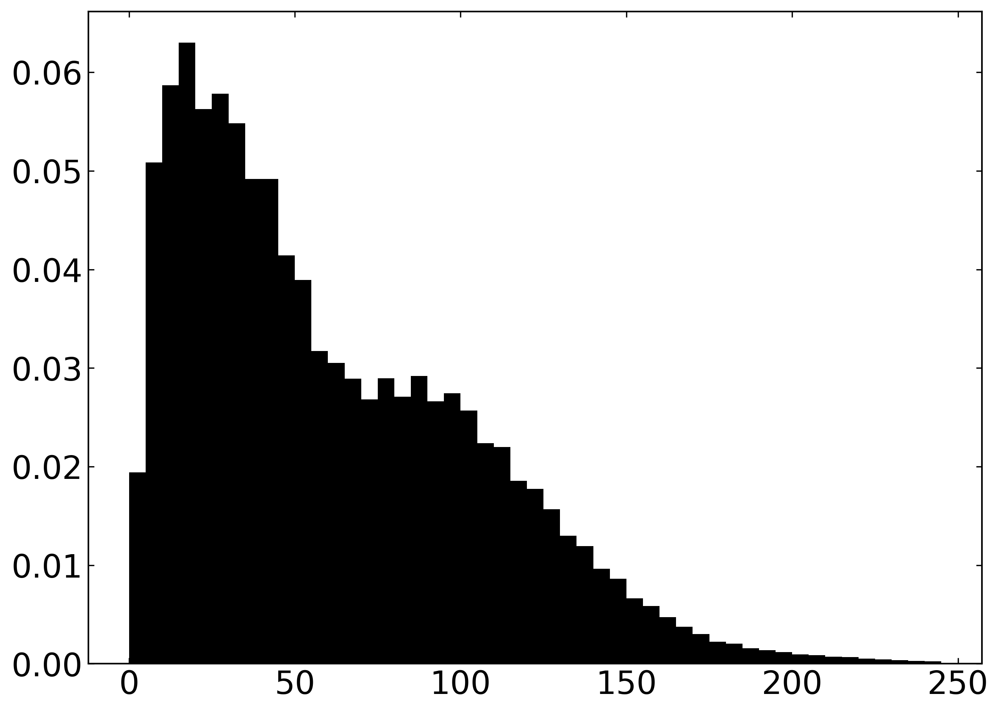

In [486]:
# density should be set to False here since it's more natural to read a histogram based on the probability of each bin rather than 
# the probability density
n, _, _ = plt.hist(pv_cat*gp_volume, weights=np.concatenate(frame_weights), bins=bins)
print(np.sum(n))

# Figure 3

In [499]:
xtal = '1YV3'
ligand = 'BIT'
stride = 1
grid_spacing = 0.07

p = 'myh2-6fsa'
pocket_vols[p] = ra.load('/mnt/bowmore/bowmore/ameller/projects/allostery/'
                         'subset-trajectory-ligand-pocket-volumes/'
                         f'{p}-{xtal}-{ligand}-ligsite-pocket-volumes-stride-{stride}-min-rank-6'
                         f'-min-cluster-size-3-grid-spacing-{grid_spacing}-'
                         'probe-radius-0.14-max-dist-from-ligand-0.25.h5')


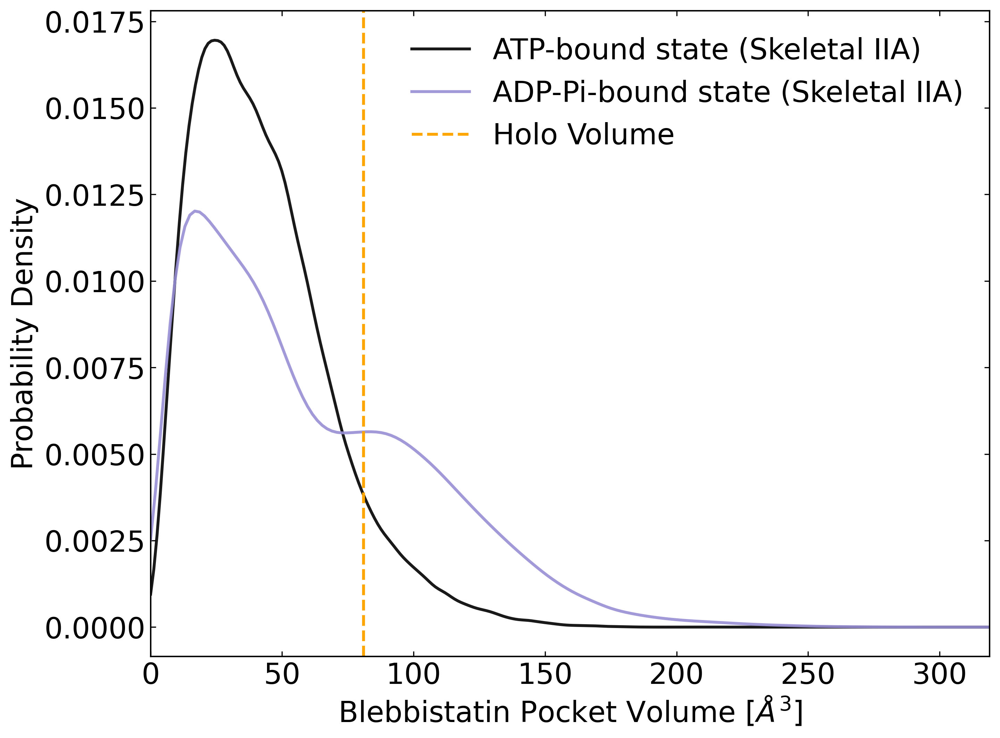

In [496]:
# convert from nm to A^3
conversion_factor = (grid_spacing * 10) ** 3
gaussian_width = 0.1

p = 'myh2-6fsa'
# trimmed_vols, frame_weights = trim_and_weight_observable(pocket_vols, ra_assignments_dict[p], msm_objs[p])
frame_weights = msm_objs[p].trajectory_weights()

assert np.all([len(fw) == len(pv) for fw, pv in zip(pocket_vols[p], frame_weights)])

kde = gaussian_kde(pocket_vols[p]._data * conversion_factor,
                   weights=np.concatenate(frame_weights), bw_method=gaussian_width)

x = np.linspace(pocket_vols[p].min(), pocket_vols[p].max(), 500)

plt.plot(x, kde.evaluate(x), label='ATP-bound state (Skeletal IIA)', linewidth=2, alpha=0.9)

p = 'myh2-5n6a'
# trimmed_vols, frame_weights = trim_and_weight_observable(pocket_vols, ra_assignments_dict[p], msm_objs[p])

frame_weights = msm_objs[p].trajectory_weights()

assert np.all([len(fw) == len(pv) for fw, pv in zip(pocket_vols[p], frame_weights)])

kde = gaussian_kde(pocket_vols[p]._data * conversion_factor,
                   weights=np.concatenate(frame_weights), bw_method=gaussian_width)

x = np.linspace(pocket_vols[p].min(), pocket_vols[p].max(), 500)
plt.plot(x, kde.evaluate(x), label='ADP-Pi-bound state (Skeletal IIA)', linewidth=2, alpha=0.9)

# Add holo volume
plt.axvline(holo_pocket_vol * conversion_factor, color='orange', linestyle='--', label='Holo Volume')
plt.xlim((0, pocket_vols[p].max() * conversion_factor))
plt.legend(fontsize=20)

plt.ylabel('Probability Density', fontsize=20)
plt.xlabel('Blebbistatin Pocket Volume $[\AA^{3}]$', fontsize=20)
# plt.title('Skeletal Muscle Myosin', fontsize=25, pad=10)

plt.tight_layout()
plt.savefig(f'{output_figure_directory}/final-submission/fig3-atp-vs-adp-pi-state-pocket-vol-comparison.pdf',
            dpi=300)
plt.show()

myh2-6fsa 0.08244427003739577
myh2-5n6a 0.30777878476289217


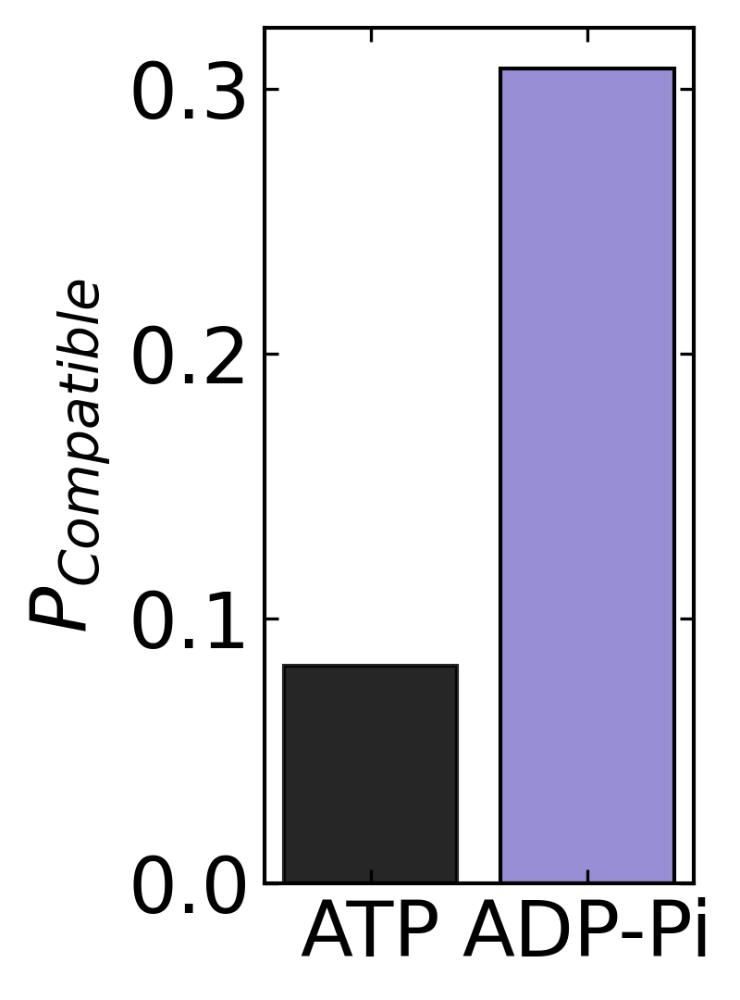

In [754]:
plt.figure(figsize=(3,4))

p = 'myh2-6fsa'

frame_weights = msm_objs[p].trajectory_weights()

plt.bar(0, np.sum(np.concatenate(frame_weights)[pocket_vols[p]._data > holo_pocket_vol]),
        alpha=0.85, edgecolor='black')

print(p, np.sum(np.concatenate(frame_weights)[pocket_vols[p]._data > holo_pocket_vol]))

p = 'myh2-5n6a'

frame_weights = msm_objs[p].trajectory_weights()
plt.bar(1, np.sum(np.concatenate(frame_weights)[pocket_vols[p]._data > holo_pocket_vol]),
        edgecolor='black')

print(p, np.sum(np.concatenate(frame_weights)[pocket_vols[p]._data > holo_pocket_vol]))

plt.ylabel('$P_{Compatible}$', fontsize=20)
plt.xticks([0, 1], ['ATP', 'ADP-Pi'])

plt.tight_layout()
# plt.savefig('../../figures/specificity/fig4/png/pps-vs-pr-pocket-compatible-probabilities.pdf', dpi=300)
plt.show()

In [788]:
n_trials = 250
# sampled_p_comps = {}

for p in ['myh2-6fsa', 'myh2-5n6a']:
    lag_time_frames = lag_times[p] * frames_per_ns
    sampled_p_comps[p] = [
        run_bootstrap_trial_mle(ra_assignments_dict[p], pocket_vols[p],
                                lag_time_frames, calc_p_over_threshold, cutoff=holo_pocket_vol)
        for i in tqdm(range(n_trials))
    ]

  0%|          | 0/250 [00:00<?, ?it/s]/home/artur/anaconda3/envs/enspara/lib/python3.6/site-packages/enspara-0.1.0-py3.6-linux-x86_64.egg/enspara/ra/ra.py:502: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  array = np.array(list(array))
100%|██████████| 250/250 [01:21<00:00,  3.08it/s]


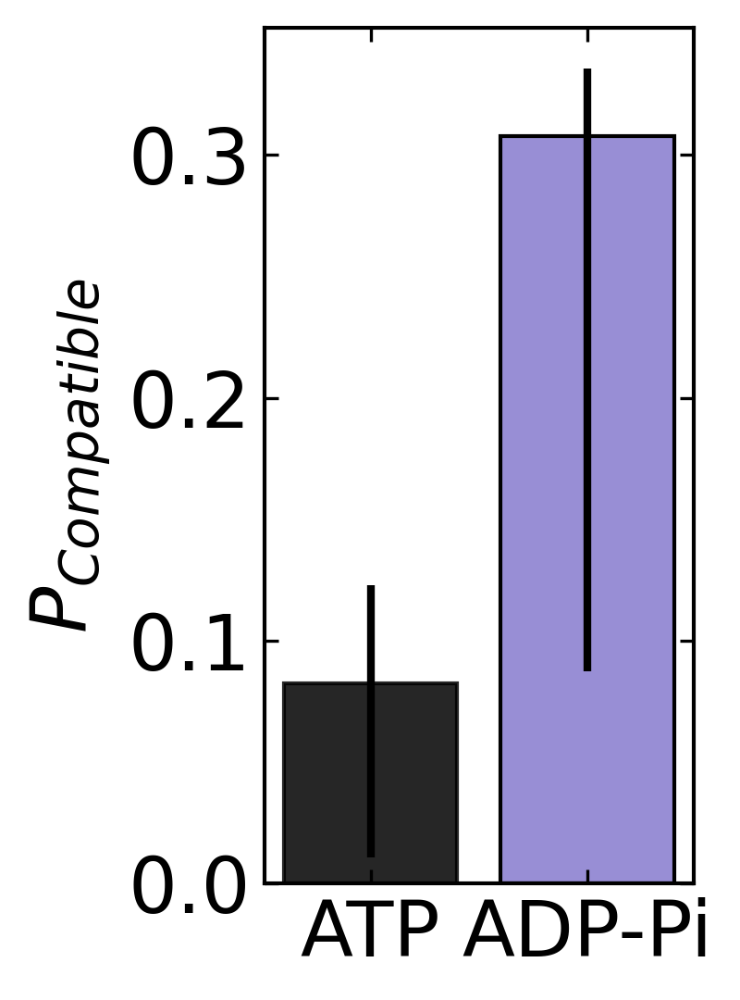

In [789]:
# Add error bars to ATP vs ADP-Pi comparison (95% CI)
plt.figure(figsize=(3,4))

p = 'myh2-6fsa'

frame_weights = msm_objs[p].trajectory_weights()
p_comp = np.sum(np.concatenate(frame_weights)[pocket_vols[p]._data > holo_pocket_vol])

yerr = [[p_comp - np.percentile(sampled_p_comps[p], 2.5)],
        [np.percentile(sampled_p_comps[p], 97.5) - p_comp]]

plt.bar(0, p_comp, yerr=yerr,
        alpha=0.85, edgecolor='black')

p = 'myh2-5n6a'

frame_weights = msm_objs[p].trajectory_weights()
p_comp = np.sum(np.concatenate(frame_weights)[pocket_vols[p]._data > holo_pocket_vol])

yerr = [[p_comp - np.percentile(sampled_p_comps[p], 2.5)],
        [np.percentile(sampled_p_comps[p], 97.5) - p_comp]]


plt.bar(1, p_comp, yerr=yerr,
        edgecolor='black')
plt.ylabel('$P_{Compatible}$', fontsize=20)
plt.xticks([0, 1], ['ATP', 'ADP-Pi'])

plt.tight_layout()

# plt.savefig(f'{output_figure_directory}/final-submission/fig3-atp-vs-adp-pi-p-compatible.pdf', dpi=300)
plt.show()

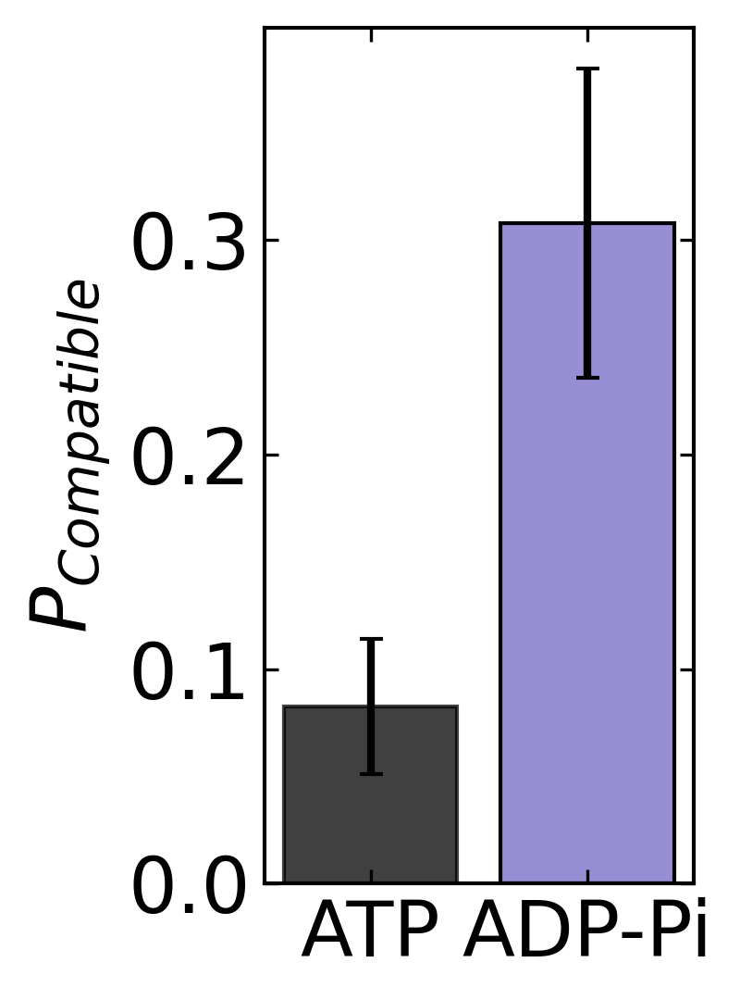

In [800]:
# Add error bars to ATP vs ADP-Pi comparison (bootstrapped estimate of standard error of mean)
plt.figure(figsize=(3,4))

p = 'myh2-6fsa'

frame_weights = msm_objs[p].trajectory_weights()
p_comp = np.sum(np.concatenate(frame_weights)[pocket_vols[p]._data > holo_pocket_vol])

yerr = np.std(sampled_p_comps[p], ddof=1)

plt.bar(0, p_comp, yerr=yerr,
        alpha=0.75, edgecolor='black', capsize = 3,)

p = 'myh2-5n6a'

frame_weights = msm_objs[p].trajectory_weights()
p_comp = np.sum(np.concatenate(frame_weights)[pocket_vols[p]._data > holo_pocket_vol])

yerr = np.std(sampled_p_comps[p], ddof=1)

plt.bar(1, p_comp, yerr=yerr,
        edgecolor='black', capsize = 3)
plt.ylabel('$P_{Compatible}$', fontsize=20)
plt.xticks([0, 1], ['ATP', 'ADP-Pi'])

plt.tight_layout()

plt.savefig(f'{output_figure_directory}/final-submission/fig3-atp-vs-adp-pi-p-compatible.pdf', dpi=300)
plt.show()

In [799]:
# error propagation
# ratio of pocket opening probabilities

p = 'myh2-5n6a'
frame_weights = msm_objs[p].trajectory_weights()
p_comp1 = np.sum(np.concatenate(frame_weights)[pocket_vols[p]._data > holo_pocket_vol])
yerr1 = np.std(sampled_p_comps[p], ddof=1)

p = 'myh2-6fsa'
frame_weights = msm_objs[p].trajectory_weights()
p_comp2 = np.sum(np.concatenate(frame_weights)[pocket_vols[p]._data > holo_pocket_vol])
yerr2 = np.std(sampled_p_comps[p], ddof=1)

combined_relative_error = np.sqrt((yerr1 / p_comp1) ** 2 + (yerr2 / p_comp2) ** 2)

opening_ratio = p_comp1 / p_comp2
print(f'ratio of opening probabilities: {opening_ratio : .2f} +- '
      f'{opening_ratio * combined_relative_error : .2f}')

ratio of opening probabilities:  3.73 +-  1.67


# Figure 5

## Functions

In [567]:
isoforms = ['myh11-1br2', 'myh9-5i4e', 'myh7-5n6a', 'myh2-5n6a', 'myh7b-hs-5n6a']

In [572]:
labels_with_IC50s = {
    p: (
        labels[p] + "\n (IC$_{50}$: " + f"{IC50s[p.split('-')[0]] : .1f} $\mu M$)"
        if IC50s[p.split('-')[0]] < 150 else
        labels[p] + '\n (>%s $\mu M$)' %IC50s[p.split('-')[0]]
    )
    for i, p in enumerate(isoforms)
}

In [573]:
labels_with_IC50s

{'myh11-1br2': 'Smooth Muscle Myosin\n (IC$_{50}$:  28.2 $\\mu M$)',
 'myh9-5i4e': 'Nonmuscle Myosin IIA\n (IC$_{50}$:  3.9 $\\mu M$)',
 'myh7-5n6a': '$\\beta$-Cardiac Myosin\n (IC$_{50}$:  1.4 $\\mu M$)',
 'myh2-5n6a': 'Skeletal Muscle Myosin IIA\n (IC$_{50}$:  0.3 $\\mu M$)',
 'myh7b-hs-5n6a': 'MYH7b\n (IC$_{50}$:  0.4 $\\mu M$)'}

In [354]:
def generate_trajectory_trace(pocket_vols, p, fig_height=28, frames_per_ns=5, save=False, outfile=None):
    fig, axes = plt.subplots(pocket_vols.shape[0], 1, figsize=(14, fig_height), sharey=True, sharex=True)

    color='#c23b22'
    for i in range(pocket_vols.shape[0]):
        x = np.arange(pocket_vols[i].shape[0]) / frames_per_ns
        rolling_volumes = pd.Series(pocket_vols[i]*gp_volume).rolling(frames_per_ns*10).mean()

        axes[i].plot(x, rolling_volumes,color="#3F5D7D",linewidth=2)

        axes[i].plot(x, pocket_vols[i]*gp_volume,color="#3F5D7D",alpha=0.6,linewidth=1)


        axes[i].axhline(holo_pocket_vol*gp_volume,xmin=min(x),xmax=max(x),color="orange",linestyle="--",label="Holo Volume")  
    #     plt.axhspan(holo_pocket_vol*gp_volume,max(pocket_vols[i]*gp_volume),
    #                 color="#008b8b",
    #                 alpha=0.4,
    #                 label="Compatabile zone")
        axes[i].set_xlim(0,1550)
        axes[i].set_ylim(0,300)
        axes[i].set_xticks(np.arange(0,1550,250))
        axes[i].set_xticklabels(np.arange(0,1550,250), fontsize=24)
        axes[i].tick_params(axis='y', labelsize=24)
        axes[i].set_xlabel("Time [ns]",fontsize=24)
    #     axes[i].set_ylabel(r'Pocket Volume [$\AA^{3}$]',fontsize=24)

    #     plt.title(r"$\beta$-cardiac Myosin",color=color,fontsize=36).set_path_effects([PathEffects.withStroke(linewidth=1, foreground='k')])

        axes[i].legend()
        if i == 0:
            axes[i].set_title(labels_with_IC50s[p],
                              color=color,fontsize=36).set_path_effects([PathEffects.withStroke(linewidth=1, foreground='k')])

    # add a big axis, hide frame
    fig.add_subplot(111, frameon=False)
    # hide tick and tick label of the big axis
    plt.tick_params(labelcolor='none', which='both', top=False, bottom=False, left=False, right=False)
    plt.ylabel(r'Pocket Volume [$\AA^{3}$]', fontsize=40, labelpad=18)

    # plt.title(labels[2],color=color,fontsize=36).set_path_effects([PathEffects.withStroke(linewidth=1, foreground='k')])
    fig.tight_layout()
    
    if save:
        plt.savefig(outfile, dpi=300)
    
    plt.show()


In [611]:
def generate_single_trajectory_trace(pvs, ix, p, fig_height=10, frames_per_ns=50,
                                     window_size=10, holo_pocket_vol=236, gp_volume=0.7**3, save=False, outfile=None):
    fig, ax = plt.subplots(1, 1, figsize=(14, fig_height), sharey=True, sharex=True)

    color='#c23b22'

    x = np.arange(pvs[ix].shape[0]) / frames_per_ns
    rolling_volumes = pd.Series(pvs[ix]*gp_volume).rolling(frames_per_ns*window_size).mean()

    ax.plot(x, rolling_volumes,color="#3F5D7D",linewidth=2)

    ax.plot(x, pvs[ix]*gp_volume,color="#3F5D7D",alpha=0.6,linewidth=1)


    ax.axhline(holo_pocket_vol*gp_volume, xmin=min(x), xmax=max(x),color="orange",linestyle="--",label="Holo Volume")  
#     plt.axhspan(holo_pocket_vol*gp_volume,max(pvs[i]*gp_volume),
#                 color="#008b8b",
#                 alpha=0.4,
#                 label="Compatabile zone")

    ax.set_xlim(0,1550)
    ax.set_ylim(0,300)
    ax.set_xticks(np.arange(0,1550,250))
    ax.set_xticklabels(np.arange(0,1550,250), fontsize=30)
    ax.tick_params(axis='y', labelsize=30)
    ax.set_xlabel("Time [ns]",fontsize=30)
    ax.set_ylabel(r'Pocket Volume [$\AA^{3}$]',fontsize=30)

#     plt.title(r"$\beta$-cardiac Myosin",color=color,fontsize=36).set_path_effects([PathEffects.withStroke(linewidth=1, foreground='k')])

    ax.legend(fontsize=30)

    ax.set_title(labels_with_IC50s[p], color=color, fontsize=36).set_path_effects([PathEffects.withStroke(linewidth=1, foreground='k')])
    
    plt.tight_layout(h_pad=1.1)
    if save:
        plt.savefig(outfile, dpi=300)
    
    plt.show()

## Supp - Long Trajectory Volume Traces

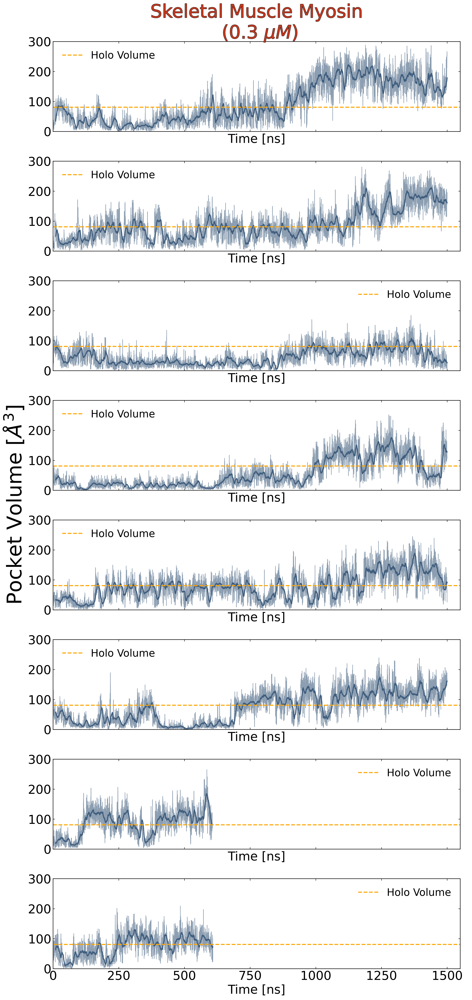

In [98]:
p = 'myh2-5n6a'
pocket_vols = ra.load(f"/{bowmore_path}/bowmore/ameller/projects/allostery/trajectory-ligand-pocket-volumes/"
                    f"{p}-charmm36-1YV3-BIT-ligsite-pocket-volumes-stride-10-min-rank-6-min-cluster-size-3-grid-spacing-0.07-probe-radius-0.14-max-dist-from-ligand-0.25.h5")

generate_trajectory_trace(pocket_vols, p)

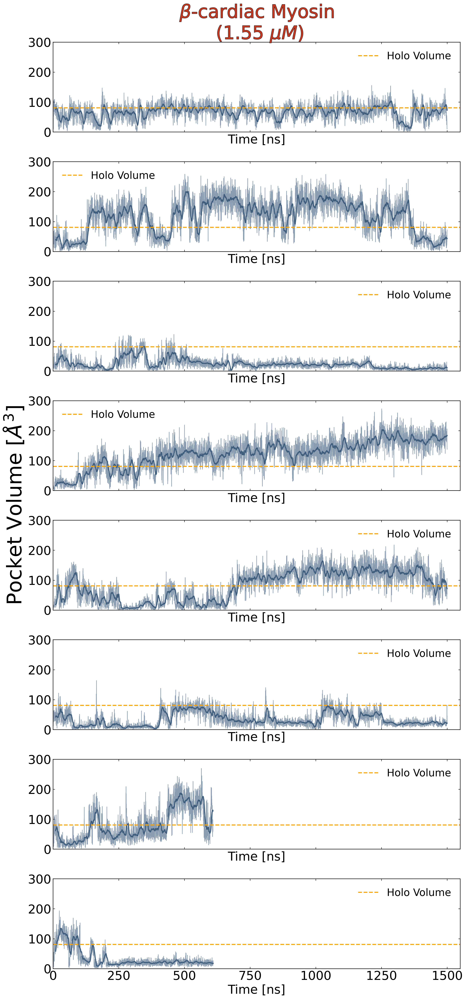

In [99]:
p = 'myh7-5n6a'
pocket_vols = ra.load(f"/{bowmore_path}/bowmore/ameller/projects/allostery/trajectory-ligand-pocket-volumes/"
                    f"{p}-charmm36-1YV3-BIT-ligsite-pocket-volumes-stride-10-min-rank-6-min-cluster-size-3-grid-spacing-0.07-probe-radius-0.14-max-dist-from-ligand-0.25.h5")

generate_trajectory_trace(pocket_vols, p)

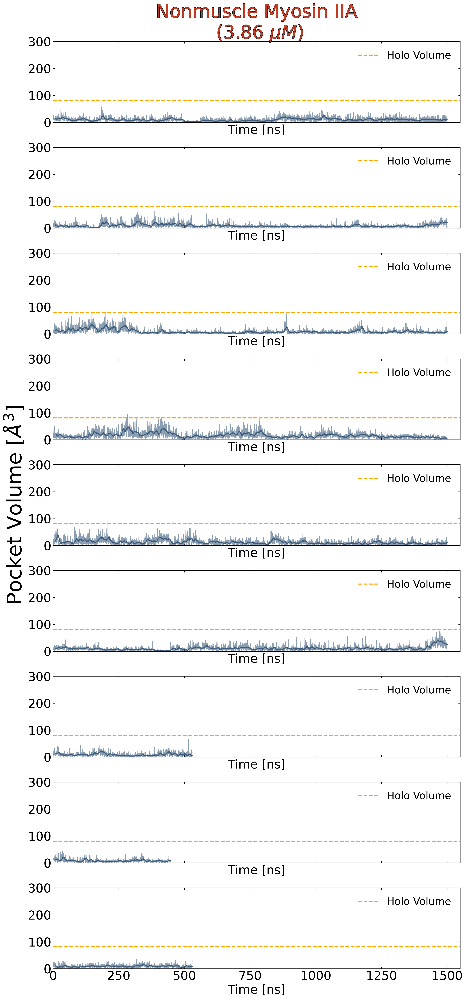

In [100]:
p = 'myh9-5i4e'
pocket_vols = ra.load(f"/{bowmore_path}/bowmore/ameller/projects/allostery/trajectory-ligand-pocket-volumes/"
                    f"{p}-charmm36-1YV3-BIT-ligsite-pocket-volumes-stride-10-min-rank-6-min-cluster-size-3-grid-spacing-0.07-probe-radius-0.14-max-dist-from-ligand-0.25.h5")

generate_trajectory_trace(pocket_vols, p)

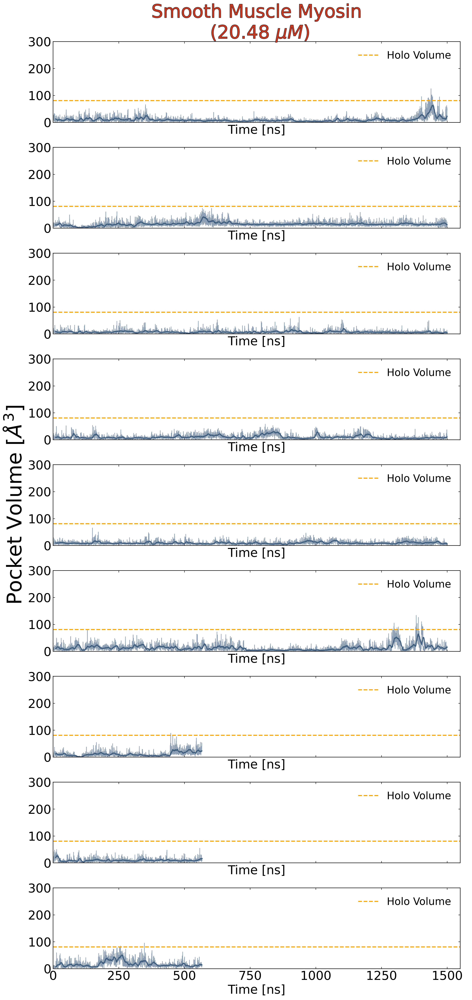

In [101]:
p = 'myh11-1br2'
pocket_vols = ra.load(f"/{bowmore_path}/bowmore/ameller/projects/allostery/trajectory-ligand-pocket-volumes/"
                    f"{p}-charmm36-1YV3-BIT-ligsite-pocket-volumes-stride-10-min-rank-6-min-cluster-size-3-grid-spacing-0.07-probe-radius-0.14-max-dist-from-ligand-0.25.h5")

generate_trajectory_trace(pocket_vols, p)

## Individual Traces

In [24]:
stride = 1
probe_radius = 0.14
pocket_vols = {}

for p in topologies.keys():
    loading_protein_name = p
    if p not in ['myh2-6fsa', 'myh7b-hs-5n6a']:
        loading_protein_name += '-combined'
    pocket_vols[p] = ra.load('/mnt/bowmore/bowmore/ameller/projects/allostery/'
                             'subset-trajectory-ligand-pocket-volumes/'
                             f'{loading_protein_name}-1YV3-BIT-ligsite-pocket-volumes-stride-{stride}-min-rank-6'
                             '-min-cluster-size-3-grid-spacing-0.07-'
                             f'probe-radius-{probe_radius}-max-dist-from-ligand-0.25.h5')
    
    frame_weights = msm_objs[p].trajectory_weights()
    
    if not np.all([len(pv) == len(fw) for pv, fw in zip(pocket_vols[p], frame_weights)]):
        diff_length_trajectories = np.where([len(pv) != len(fw) for pv, fw in zip(pocket_vols[p], frame_weights)])[0]
        for ix in diff_length_trajectories:
            print(p, pocket_vols[p][ix].shape, frame_weights[ix].shape)
            fw_l = len(frame_weights[ix])
            pocket_vols[p][ix] = pocket_vols[p][ix][:fw_l]

myh7-5n6a (87501,) (75001,)
myh9-5i4e (87501,) (75001,)
myh7b-hs-5n6a (75001,) (47509,)
myh7b-hs-5n6a (75001,) (38345,)
myh7b-hs-5n6a (75001,) (47431,)


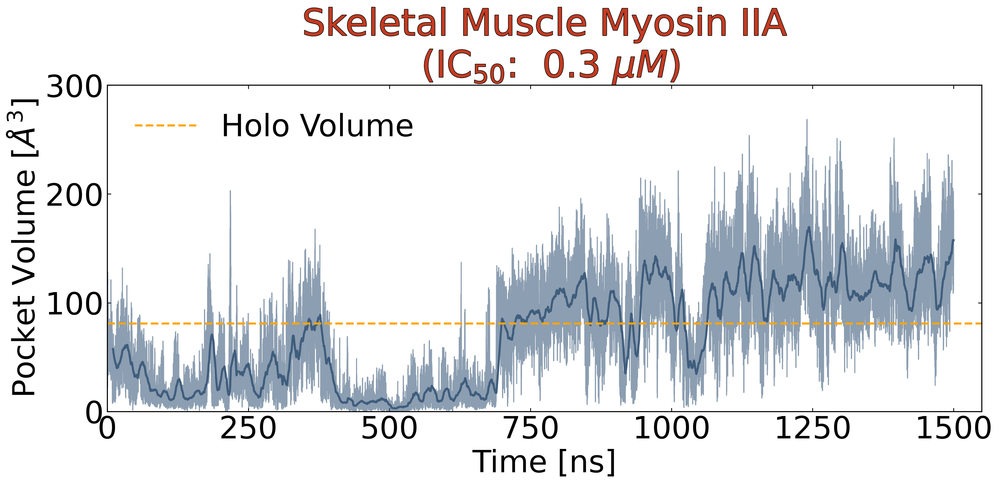

In [612]:
p = 'myh2-5n6a'
ix = -1
generate_single_trajectory_trace(pocket_vols[p], ix, p, fig_height=7,
                                 save=True, outfile=f'{output_figure_directory}/final-submission/{p}-trj-pv-trace.pdf')

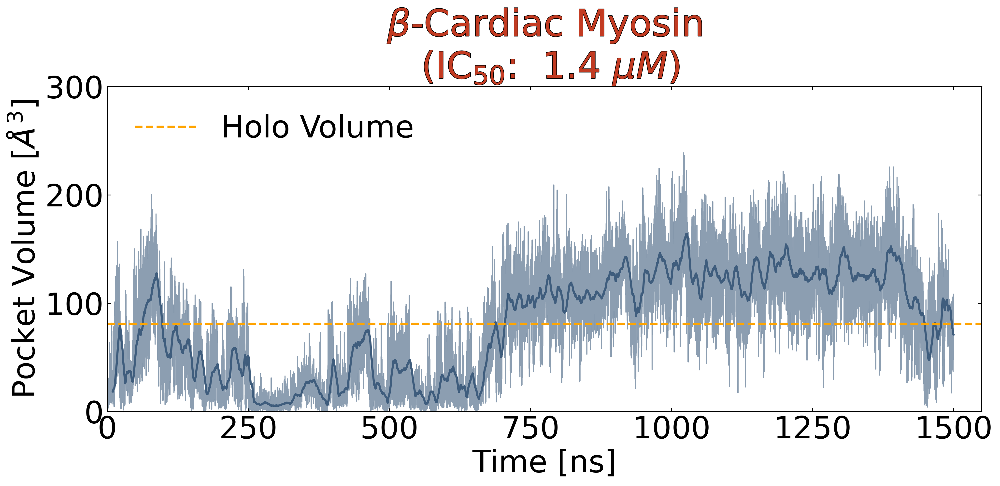

In [613]:
p = 'myh7-5n6a'
ix = -2
generate_single_trajectory_trace(pocket_vols[p], ix, p, fig_height=7,
                                 save=True, outfile=f'{output_figure_directory}/final-submission/{p}-trj-pv-trace.pdf')

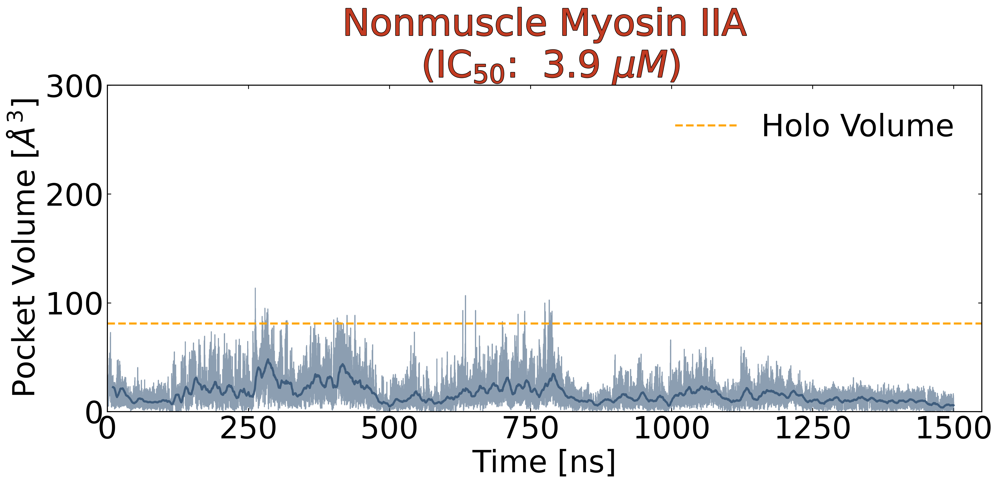

In [614]:
p = 'myh9-5i4e'
ix = -3
generate_single_trajectory_trace(pocket_vols[p], ix, p, fig_height=7,
                                 save=True, outfile=f'{output_figure_directory}/final-submission/{p}-trj-pv-trace.pdf')

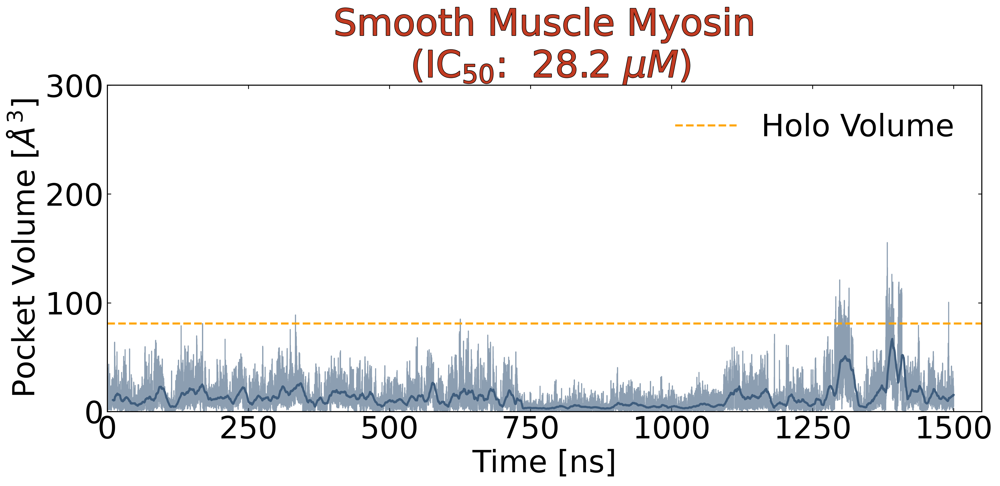

In [615]:
p = 'myh11-1br2'
ix = -1
generate_single_trajectory_trace(pocket_vols[p], ix, p, fig_height=7,
                                 save=True, outfile=f'{output_figure_directory}/final-submission/{p}-trj-pv-trace.pdf')

## Pocket Volumes vs IC50

In [524]:
stride = 1
pocket_vols = {}

for p in topologies.keys():
    loading_protein_name = p
    if p not in ['myh2-6fsa', 'myh7b-hs-5n6a']:
        loading_protein_name += '-combined'
    pocket_vols[p] = ra.load('/mnt/bowmore/bowmore/ameller/projects/allostery/'
                             'subset-trajectory-ligand-pocket-volumes/'
                             f'{loading_protein_name}-1YV3-BIT-ligsite-pocket-volumes-stride-{stride}-min-rank-6'
                             '-min-cluster-size-3-grid-spacing-0.07-'
                             f'probe-radius-{probe_radius}-max-dist-from-ligand-0.25.h5')
    
    frame_weights = msm_objs[p].trajectory_weights()
    
    if not np.all([len(pv) == len(fw) for pv, fw in zip(pocket_vols[p], frame_weights)]):
        diff_length_trajectories = np.where([len(pv) != len(fw) for pv, fw in zip(pocket_vols[p], frame_weights)])[0]
        for ix in diff_length_trajectories:
            print(p, pocket_vols[p][ix].shape, frame_weights[ix].shape)
            fw_l = len(frame_weights[ix])
            pocket_vols[p][ix] = pocket_vols[p][ix][:fw_l]

In [43]:
probe_radius = 0.14

# in pocket volume calcs across isoforms we have no hydrogens on the ligand but hydrogens on proteins
xtal_1yv3 = md.load('tmp/1yv3-protein-with-hydrogens-ligand-no-hydrogens.pdb')

all_holo_pockets = geometry.pockets.get_pockets(xtal_1yv3.atom_slice(xtal_1yv3.top.select('protein')),
                                                grid_spacing=0.07, probe_radius=probe_radius,
                                                min_rank=6, min_cluster_size=3)

ligand_aids = xtal_1yv3.top.select('resname BIT')
print([xtal_1yv3.top.atom(ai) for ai in ligand_aids])

ligand_xyz = xtal_1yv3.xyz[0][ligand_aids]

dists_ligand_pockets = cdist(ligand_xyz, all_holo_pockets[0].xyz[0], 'sqeuclidean')

dist_cutoff = 0.25
dist_cutoff_sq = dist_cutoff ** 2
holo_pocket_vol = np.sum(np.sum(dists_ligand_pockets < dist_cutoff_sq, axis=0) > 0)
print(holo_pocket_vol)

[BIT800-C1, BIT800-N1, BIT800-O1, BIT800-C2, BIT800-N2, BIT800-O2, BIT800-C3, BIT800-C4, BIT800-C5, BIT800-C6, BIT800-C7, BIT800-C8, BIT800-C9, BIT800-C10, BIT800-C11, BIT800-C12, BIT800-C13, BIT800-C14, BIT800-C15, BIT800-C16, BIT800-C17, BIT800-C18]
236


### Weighted Pocket Volume Distributions

In [525]:
isoforms = ['myh11-1br2', 'myh9-5i4e', 'myh7-5n6a', 'myh2-5n6a', 'myh7b-hs-5n6a']

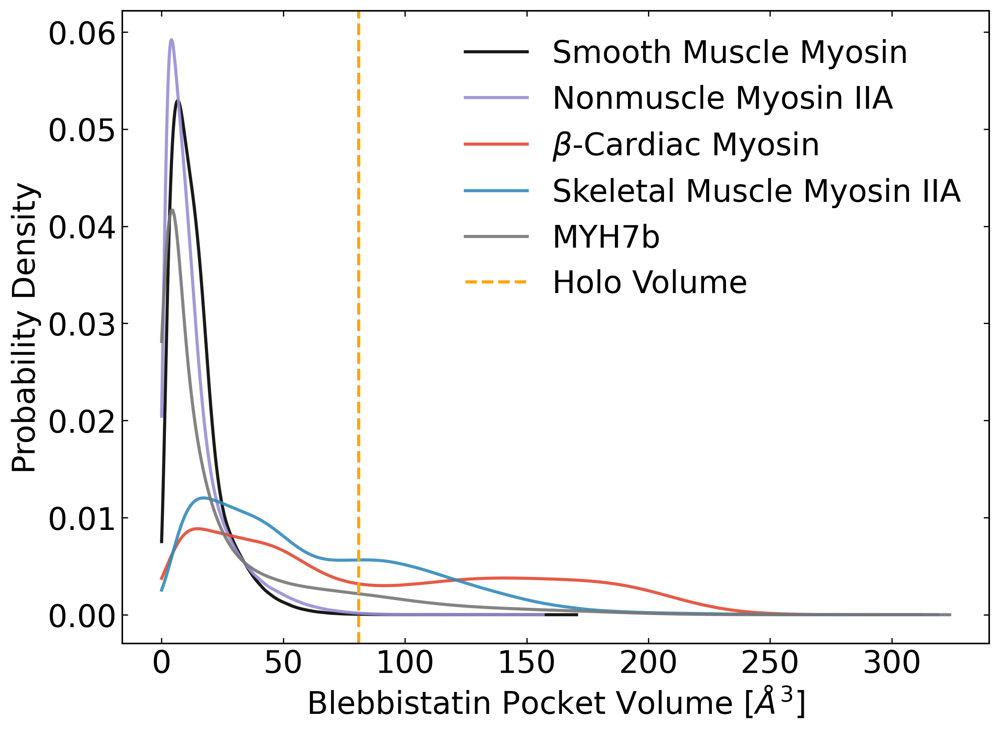

In [526]:
gaussian_width = 0.1
grid_spacing = 0.07 * 10 # 0.07 nm to A
conversion_factor = grid_spacing ** 3

for p in isoforms:
    # determine p comp for the entire dataset
    frame_weights = msm_objs[p].trajectory_weights()
    
    kde = gaussian_kde(pocket_vols[p]._data * conversion_factor, weights=np.concatenate(frame_weights), bw_method=gaussian_width)

    x = np.linspace(pocket_vols[p].min() * conversion_factor, pocket_vols[p].max() * conversion_factor, 500)
    plt.plot(x, kde.evaluate(x), label=labels[p], linewidth=2, alpha=0.9)

# Add holo volume
plt.axvline(holo_pocket_vol * conversion_factor, color='orange', linestyle='--', label='Holo Volume')
# plt.xlim((0, pocket_vols.max()))
plt.legend(fontsize=20)

plt.ylabel('Probability Density', fontsize=20)
plt.xlabel('Blebbistatin Pocket Volume $[\AA^{3}]$', fontsize=20)

plt.savefig(f'{output_figure_directory}/supplement/all-isoforms-pocket-volumes.pdf', dpi=300)
plt.show()
    

### Compatible Probabilities

In [616]:
isoforms = ['myh11-1br2', 'myh9-5i4e', 'myh7-5n6a', 'myh2-5n6a']

In [617]:
n_trials = 250

# p_comps is the computed value for the entire dataset
p_comps = {}
sampled_p_comps = {}
for p in isoforms:
    # determine p comp for the entire dataset
    frame_weights = msm_objs[p].trajectory_weights()
    p_comps[p] = calc_p_over_threshold(pocket_vols[p]._data, np.concatenate(frame_weights), holo_pocket_vol)

    lag_time_frames = lag_times[p] * frames_per_ns
    sampled_p_comps[p] = [
        run_bootstrap_trial_mle(ra_assignments_dict[p], pocket_vols[p], lag_time_frames, calc_p_over_threshold, cutoff=holo_pocket_vol)
        for i in tqdm(range(n_trials))
    ]




  0%|          | 0/250 [00:00<?, ?it/s]/home/artur/anaconda3/envs/enspara/lib/python3.6/site-packages/enspara-0.1.0-py3.6-linux-x86_64.egg/enspara/ra/ra.py:502: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  array = np.array(list(array))


  0%|          | 1/250 [00:00<01:17,  3.20it/s]

  1%|          | 2/250 [00:00<01:16,  3.23it/s]

  1%|          | 3/250 [00:00<01:17,  3.21it/s]

  2%|▏         | 4/250 [00:01<01:16,  3.21it/s]

  2%|▏         | 5/250 [00:01<01:16,  3.20it/s]

  2%|▏         | 6/250 [00:01<01:16,  3.20it/s]

  3%|▎         | 7/250 [00:02<01:15,  3.20it/s]

  3%|▎         | 8/250 [00:02<01:15,  3.19it/s]

  4%|▎         | 9/250 [00:02<01:15,  3.20it/s]

  4%|▍         | 10/250 [00:03<01:14,  3.23it/s]

  4%|▍         | 11/250 [00:03<01:13,  3.24it/s

 12%|█▏        | 31/250 [00:09<01:13,  2.98it/s]

 13%|█▎        | 32/250 [00:09<01:12,  3.02it/s]

 13%|█▎        | 33/250 [00:09<01:08,  3.16it/s]

 14%|█▎        | 34/250 [00:09<01:06,  3.25it/s]

 14%|█▍        | 35/250 [00:10<01:03,  3.38it/s]

 14%|█▍        | 36/250 [00:10<01:02,  3.45it/s]

 15%|█▍        | 37/250 [00:10<01:02,  3.42it/s]

 15%|█▌        | 38/250 [00:11<01:03,  3.35it/s]

 16%|█▌        | 39/250 [00:11<01:02,  3.39it/s]

 16%|█▌        | 40/250 [00:11<01:01,  3.40it/s]

 16%|█▋        | 41/250 [00:11<01:01,  3.41it/s]

 17%|█▋        | 42/250 [00:12<01:00,  3.43it/s]

 17%|█▋        | 43/250 [00:12<01:01,  3.36it/s]

 18%|█▊        | 44/250 [00:12<00:59,  3.48it/s]

 18%|█▊        | 45/250 [00:13<00:58,  3.52it/s]

 18%|█▊        | 46/250 [00:13<00:58,  3.46it/s]

 19%|█▉        | 47/250 [00:13<00:58,  3.45it/s]

 19%|█▉        | 48/250 [00:13<00:57,  3.50it/s]

 20%|█▉        | 49/250 [00:14<00:57,  3.49it/s]

 20%|██        | 50/250 [00:14<00:56,  3.52it/s]



 28%|██▊       | 69/250 [00:28<01:07,  2.67it/s]

 28%|██▊       | 70/250 [00:28<01:05,  2.74it/s]

 28%|██▊       | 71/250 [00:29<01:03,  2.81it/s]

 29%|██▉       | 72/250 [00:29<01:06,  2.67it/s]

 29%|██▉       | 73/250 [00:30<01:08,  2.60it/s]

 30%|██▉       | 74/250 [00:30<01:10,  2.51it/s]

 30%|███       | 75/250 [00:30<01:09,  2.52it/s]

 30%|███       | 76/250 [00:31<01:10,  2.47it/s]

 31%|███       | 77/250 [00:31<01:10,  2.45it/s]

 31%|███       | 78/250 [00:32<01:10,  2.44it/s]

 32%|███▏      | 79/250 [00:32<01:10,  2.43it/s]

 32%|███▏      | 80/250 [00:32<01:09,  2.44it/s]

 32%|███▏      | 81/250 [00:33<01:09,  2.42it/s]

 33%|███▎      | 82/250 [00:33<01:09,  2.42it/s]

 33%|███▎      | 83/250 [00:34<01:05,  2.55it/s]

 34%|███▎      | 84/250 [00:34<01:06,  2.50it/s]

 34%|███▍      | 85/250 [00:34<01:03,  2.61it/s]

 34%|███▍      | 86/250 [00:35<01:04,  2.54it/s]

 35%|███▍      | 87/250 [00:35<01:03,  2.58it/s]

 35%|███▌      | 88/250 [00:36<01:00,  2.68it/s]



 43%|████▎     | 107/250 [00:34<00:44,  3.23it/s]

 43%|████▎     | 108/250 [00:34<00:43,  3.24it/s]

 44%|████▎     | 109/250 [00:34<00:44,  3.15it/s]

 44%|████▍     | 110/250 [00:35<00:44,  3.13it/s]

 44%|████▍     | 111/250 [00:35<00:57,  2.43it/s]

 45%|████▍     | 112/250 [00:36<00:52,  2.64it/s]

 45%|████▌     | 113/250 [00:36<00:48,  2.81it/s]

 46%|████▌     | 114/250 [00:36<00:57,  2.38it/s]

 46%|████▌     | 115/250 [00:37<00:51,  2.60it/s]

 46%|████▋     | 116/250 [00:37<00:48,  2.78it/s]

 47%|████▋     | 117/250 [00:37<00:45,  2.92it/s]

 47%|████▋     | 118/250 [00:38<00:43,  3.02it/s]

 48%|████▊     | 119/250 [00:38<00:43,  3.05it/s]

 48%|████▊     | 120/250 [00:38<00:41,  3.12it/s]

 48%|████▊     | 121/250 [00:39<00:40,  3.19it/s]

 49%|████▉     | 122/250 [00:39<00:39,  3.24it/s]

 49%|████▉     | 123/250 [00:39<00:39,  3.18it/s]

 50%|████▉     | 124/250 [00:40<00:40,  3.10it/s]

 50%|█████     | 125/250 [00:40<00:42,  2.92it/s]

 50%|█████     | 126/250 [00:40

In [618]:
labels_with_IC50s = {
    p: (labels[p] + "\n (IC$_{50}$: " + f"{IC50s[p.split('-')[0]] : .1f} $\mu M$)")
    for p in isoforms
}

myh11-1br2 0.0005150008146446158 0.0005249922717136461
myh9-5i4e 0.001344145799775767 0.0013391024536687777
myh7-5n6a 0.45672059720496305 0.44454047361211474
myh2-5n6a 0.30972020827970065 0.269644157167972


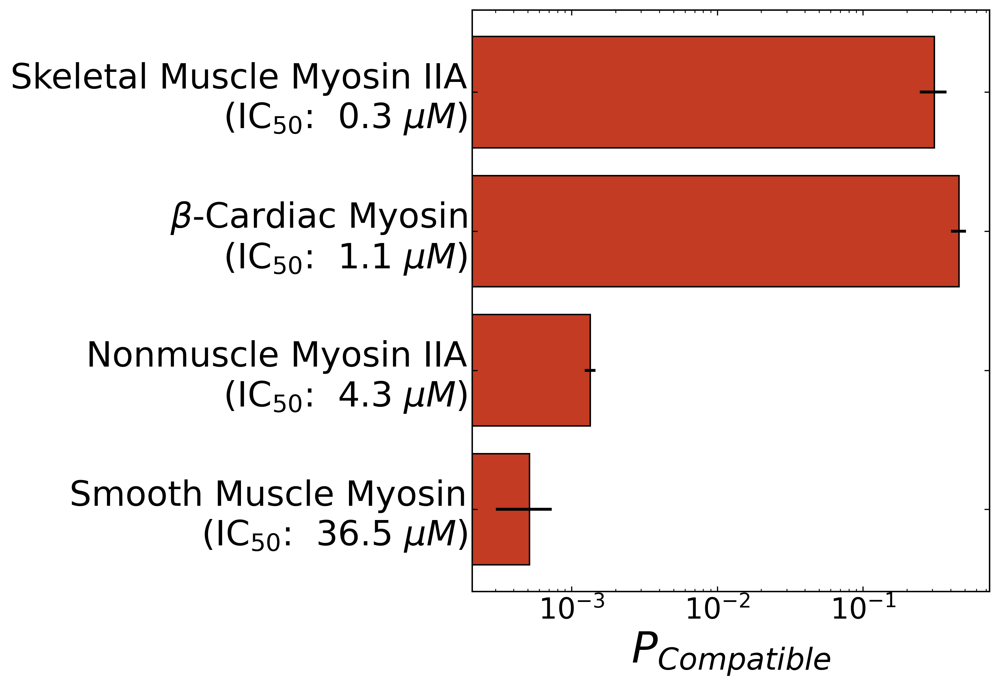

In [619]:
split_labels = {}
for p in labels_with_IC50s:
    split_labels[p] = "\n".join(labels_with_IC50s[p].split())


colors = ["#c23b22" for i in range(len(IC50s))]

fig, ax = plt.subplots(figsize=(10, 7),facecolor="w")

for i, p in enumerate(isoforms):
    print(p, p_comps[p], np.mean(sampled_p_comps[p]))
    
#     # bar height is the p comp for the entire dataset
#     # error is a 95% CI
#     plt.barh(i, p_comps[p],
#              xerr=[[p_comps[p] - np.percentile(sampled_p_comps[p], 2.5)],
#                    [np.percentile(sampled_p_comps[p], 97.5) - p_comps[p]]],
#              color=colors[i], edgecolor='black')
    
    # bar height is the p comp for the entire dataset
    # error is standard deviation of bootstrapped samples
    plt.barh(i, p_comps[p],
             xerr=np.std(sampled_p_comps[p], ddof=1),
             color=colors[i], edgecolor='black')

plt.yticks(range(len(labels_with_IC50s.keys())), labels_with_IC50s.values(), fontsize=24) #.set_path_effects([PathEffects.withStroke(linewidth=1, foreground='k')])
# ax.set_yticklabels([split_labels[p] for p in IC50s], fontsize=20)
ax.set_xlabel(r'$P_{Compatible}$', fontsize=30)
plt.xscale("log")

# ax.set_aspect('equal',"box")
plt.tight_layout()

plt.savefig(f'{output_figure_directory}/final-submission/probability_of_ligand_compatible_volume.pdf',dpi=300)

plt.show()

In [531]:
# determine p comp for myh7b
p = 'myh7b-hs-5n6a'
frame_weights = msm_objs[p].trajectory_weights()
p_comps[p] = calc_p_over_threshold(pocket_vols[p]._data, np.concatenate(frame_weights), holo_pocket_vol)

print(f'probability of compatible pocket volume for {p} is {p_comps[p]: .2f}')

probability of compatible pocket volume for myh7b-hs-5n6a is  0.10


### Sensitivity Analysis to Cutoff

[118. 177. 236. 295. 354.]


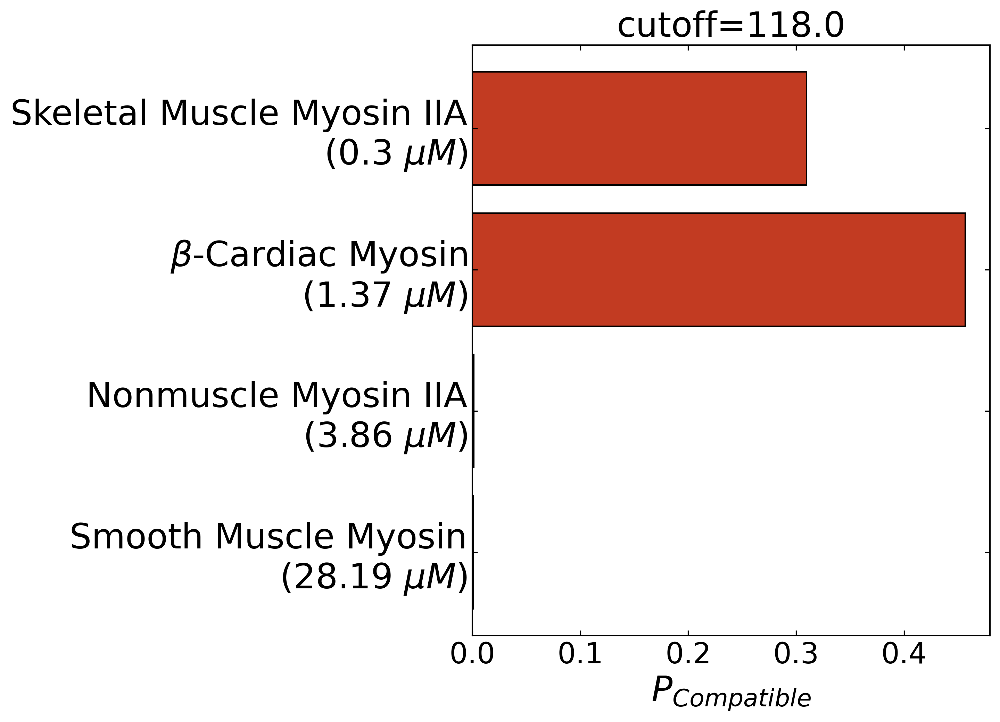

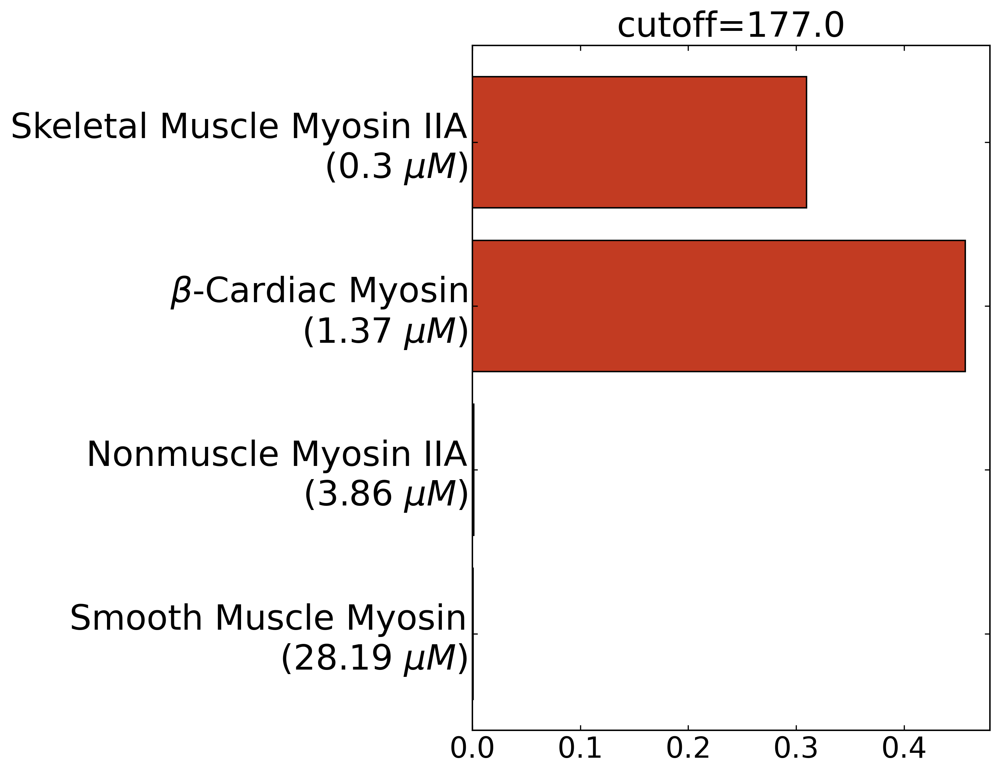

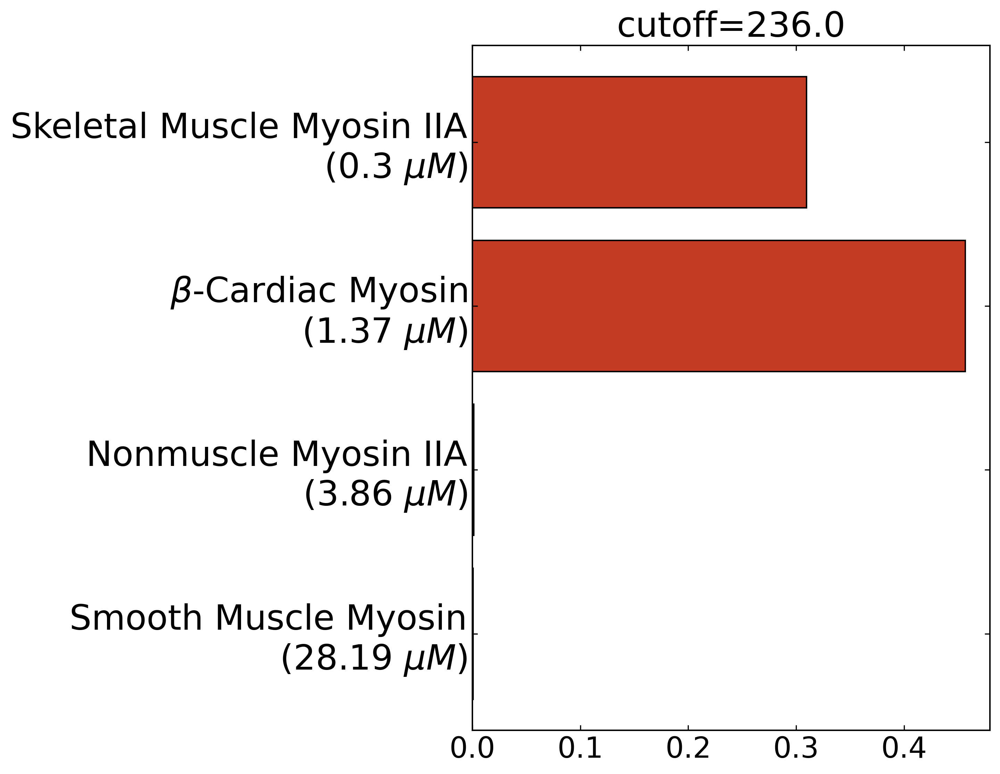

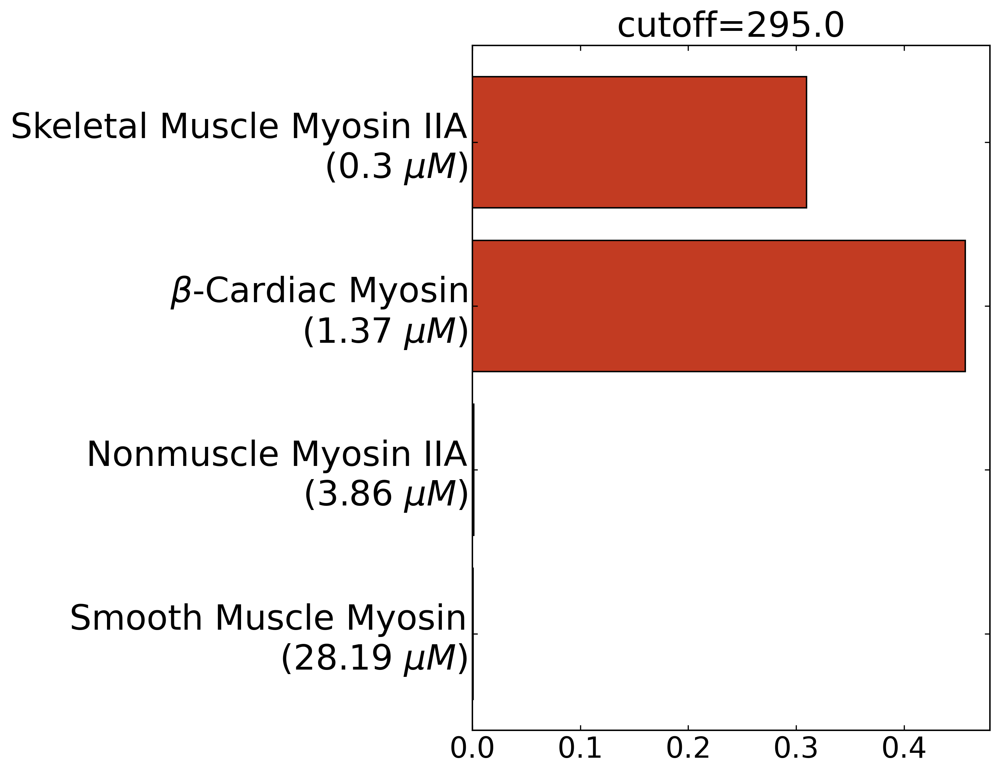

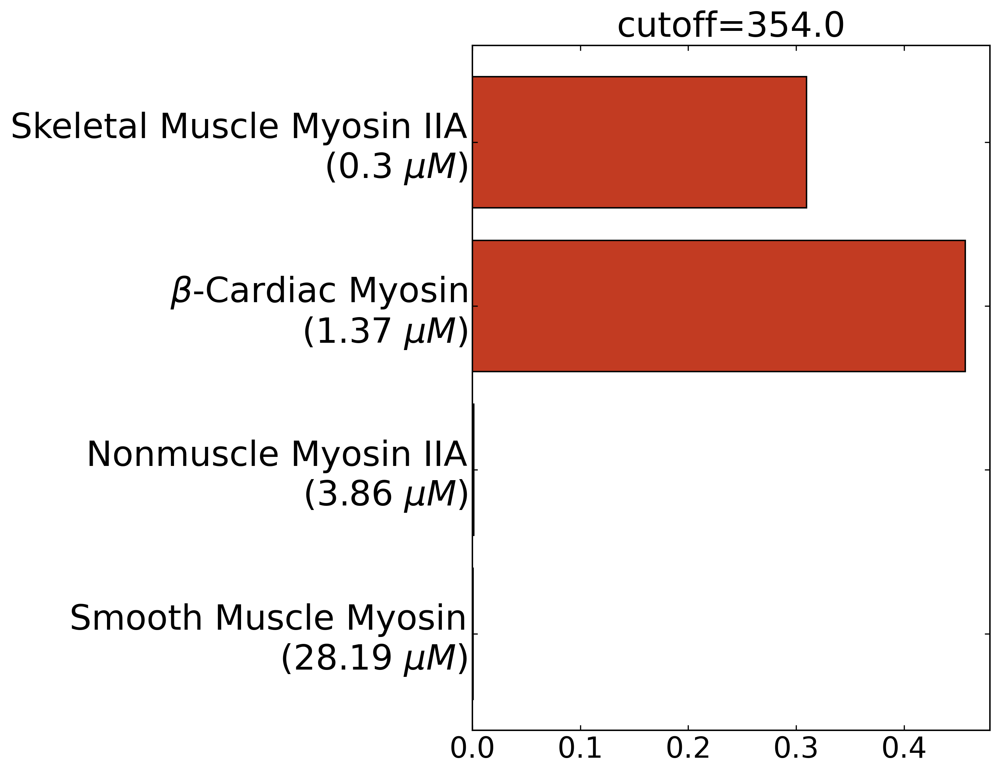

In [545]:
colors = ["#c23b22" for i in range(len(isoforms))]

fig, ax = plt.subplots(figsize=(10, 7),facecolor="w")

cutoff_scan = np.arange(0.5*holo_pocket_vol, 1.75*holo_pocket_vol, 0.25*holo_pocket_vol)
print(cutoff_scan)

for cutoff in cutoff_scan:
    for j, p in enumerate(isoforms):
        frame_weights = msm_objs[p].trajectory_weights()
        plt.barh(j, calc_p_over_threshold(pocket_vols[p]._data,
                                          np.concatenate(frame_weights), holo_pocket_vol),
                 color=colors[i], edgecolor='black')


    plt.yticks(range(len(labels_with_IC50s.keys())), labels_with_IC50s.values(), fontsize=24)
    ax.set_xlabel(r'$P_{Compatible}$', fontsize=24)
#     plt.xscale("log")
    plt.tight_layout()
    plt.title(f'cutoff={cutoff}')
    # plt.savefig("figures/fig3/probability_of_ligand_compatible_volume.pdf",dpi=300)
    plt.show()

### p_comp vs delta G

In [547]:
predicted_deltaGs = {}

for p in isoforms:
    # find free energy difference between pocket open and closed states
    p_open = p_comps[p]
    
    T = 300 # K
    kT = 3.297623483e-24 * T / 1000 # kcal
    Na = 6.02214076e23 # particles / mol
    RT = kT*Na # kcal/mol

    predicted_deltaGs[p.split('-')[0]] = np.log((1 - p_open) / p_open) * RT # in units of kcal / mol

In [548]:
experimental_deltaGs = {}

for p in isoforms:
    experimental_deltaGs[p.split('-')[0]] = IC50_to_deltaG(IC50s[p.split('-')[0]])

In [549]:
experimental_deltaGs

{'myh11': -6.20407054014753,
 'myh9': -7.3815156107202275,
 'myh7': -7.994936115049978,
 'myh2': -8.894339669812013}

In [550]:
yerrs = []

for p in isoforms:
    lower_bound_p_open = np.percentile(sampled_p_comps[p], 2.5)
    upper_bound_p_open = np.percentile(sampled_p_comps[p], 97.5)
    
    yerrs.append([
        predicted_deltaGs[p.split('-')[0]] - (np.log((1 - lower_bound_p_open) / lower_bound_p_open) * RT),
        (np.log((1 - upper_bound_p_open) / upper_bound_p_open) * RT) - predicted_deltaGs[p.split('-')[0]],
    ])

In [551]:
yerrs

[[-0.5461964569496072, -0.36337492884086053],
 [-0.11581478818939184, -0.09778471178817894],
 [-0.2641157297352365, -0.14385643821985608],
 [-0.8163309503824755, -0.07825468223402188]]

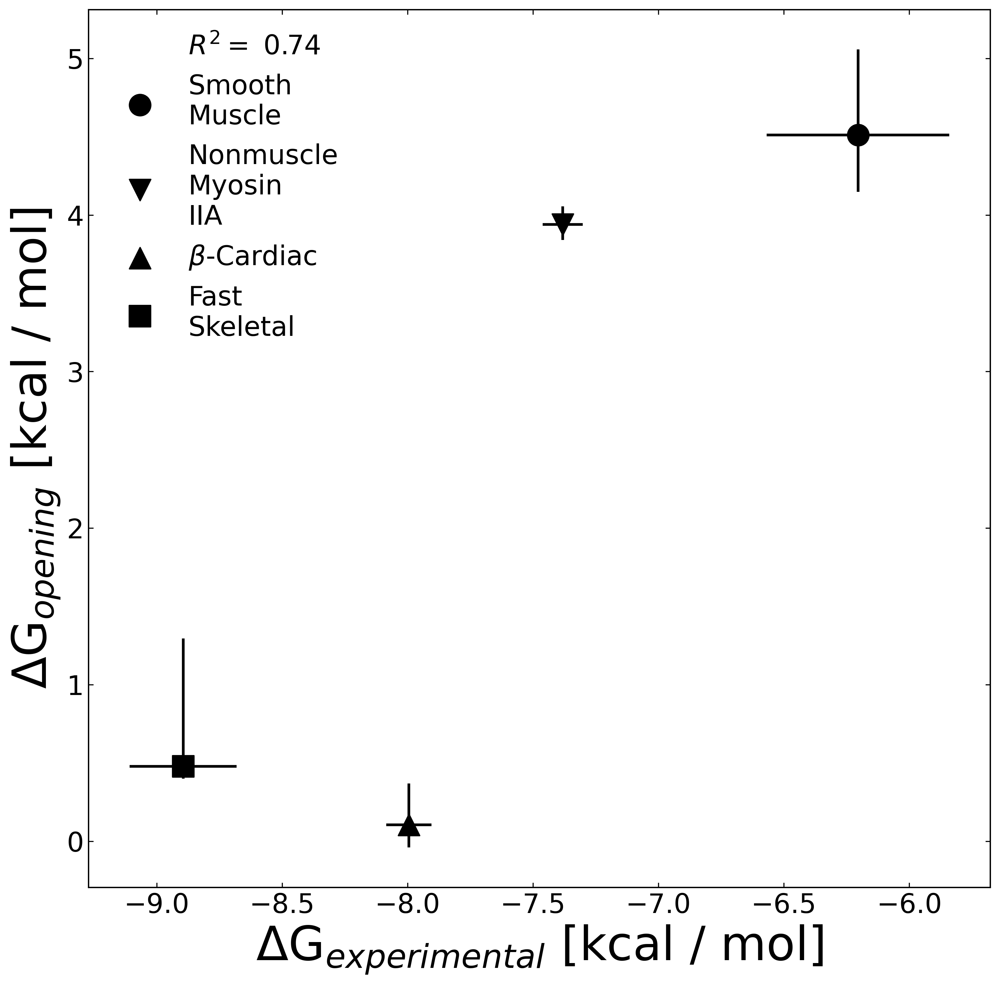

In [552]:
labels = {
    'myh11-1br2': "Smooth Muscle",
    'myh9-5i4e': "Nonmuscle Myosin IIA",
    'myh7-5n6a': r"$\beta$-Cardiac",
    'myh2-5n6a': "Fast Skeletal",
}

split_labels = {}
for p in labels:
    split_labels[p] = "\n".join(labels[p].split())

markers = ["o","v","^","s"]

# run a regression for this isoform
reg = linregress(list(experimental_deltaGs.values()), list(predicted_deltaGs.values()))

x = np.array([min(experimental_deltaGs.values()), max(experimental_deltaGs.values())])
y = reg.slope*x + reg.intercept


fig,ax = plt.subplots(1, 1, figsize=(12,12))

# prepare +- 1kcal graphic
# z = np.linspace(-15,0,100)
# ax.plot(z,z,color='black',linewidth=3,zorder=1)
# ax.plot(z,z+1,c='red',linewidth=5,zorder=1)
# ax.plot(z+1,z,c='red',linewidth=5,zorder=1)

# ax.set_xlim(-15,0)
# ax.set_ylim(-15,0)


# ax.fill_between([-20,0], np.array([-20,0])-1, np.array([-20,0])+1, alpha=0.2,color='grey',zorder=1)

ax.plot(x, y, '--', c='gray', label=f'$R^{2}=${reg.rvalue ** 2 : .2f}',alpha=0)
# labels=['Smooth\nMuscle', 'Nonmuscle\nIIA', r'$\beta$-cardiac', 'Fast\nSkeletal']


labels=list(split_labels.values())

for i in range(len(isoforms)):
    ax.scatter(list(experimental_deltaGs.values())[i], list(predicted_deltaGs.values())[i], 
               color="k",marker=markers[i],label=labels[i],s=250,zorder=3)

# Add errors
# Standard errror for experimental measurements
xerrs = [
    (
        np.std([IC50_to_deltaG(ic50) for ic50 in experimental_data.loc[experimental_data['Gene'] == g.upper(), 'IC50/Ki']]) / 
        np.sqrt(len(experimental_data.loc[experimental_data['Gene'] == g.upper(), 'IC50/Ki']))
    )
    for g in [p.split('-')[0] for p in isoforms]
]


# 95 % CI for 
ax.errorbar(
    list(experimental_deltaGs.values()),
    list(predicted_deltaGs.values()),
    xerr=xerrs,
    yerr=np.array(yerrs).transpose(),
    fmt='o',markersize=1,zorder=2
)

    
ax.set_xlabel(r'$\Delta$G$_{experimental}$ [kcal / mol]',fontsize=35)
ax.set_ylabel(r'$\Delta$G$_{opening}$ [kcal / mol]',fontsize=35)
# ax.set_ylabel(r'pIC$_{50}$',fontsize=35)

ax.legend()
# plt.savefig(f"figures/fig3/msm_weighted_delta_G_docking_vs_deltaG_actin_activated.pdf",dpi=300)
plt.show()

# Delta G docking figure 6

## Box Comparison

[-6.6529934243732765, -7.469157126678134]
[-7.87862706105059, -8.220117159730801]
[-9.3449151349923, -9.412465687845968]
[-9.388467634008993, -9.439717910206847]
[-8.758471277011466, -8.822317650259365]


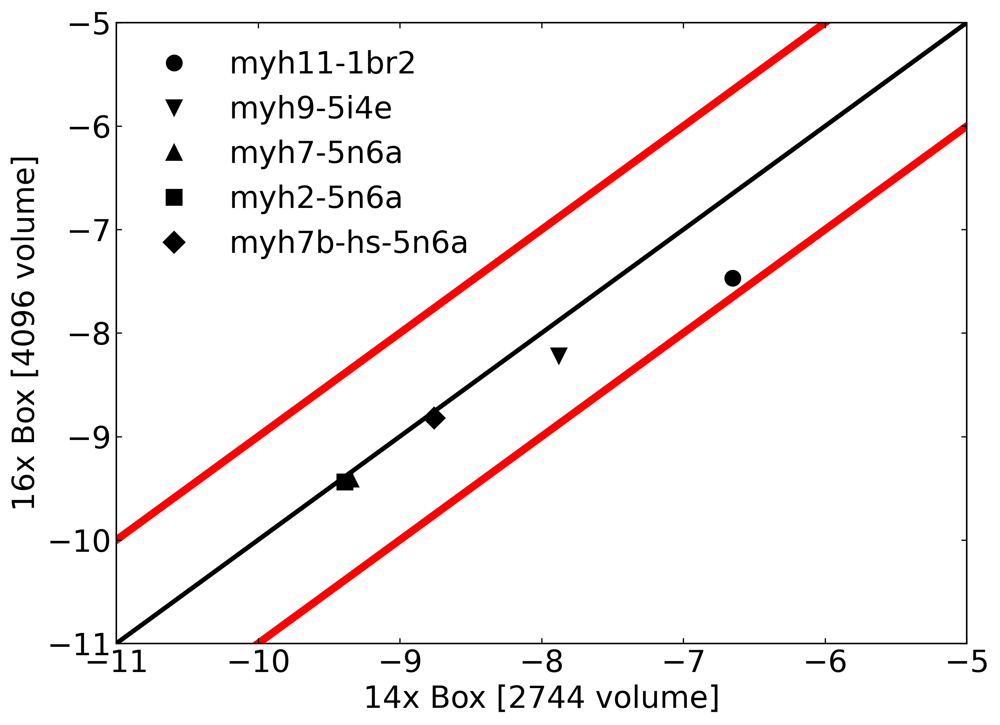

In [442]:
markers = ["o","v","^","s", "D"]

predicted_deltaGs = {}
for i, p in enumerate(isoforms):
    pdG = []
    for box in [14, 16]:
        if p == 'myh7b-hs-5n6a':
            docking_summary = json.load(
                open(f"/{bowmore_path}/bowmore/louiss/binding/myosin/myh7b-final/myh7b-totals/"
                f"extracted_scores/{box}xsmina/binding-calx/calx.json")
            )
        else:
            gene = p.split('-')[0]
            docking_summary = json.load(
                open(f'/{bowmore_path}/bowmore/louiss/binding/myosin/{gene}-final/{gene}-{n_clusters[p]}-2000/'
                     f'extracted_scores/{box}xsmina/'
                     'binding-calx/calx.json')
            )

        pdG.append(docking_summary['blebbistatin']['msm dG'])
    
    print(pdG)
    plt.plot(pdG[0], pdG[1], markers[i], label=p, color='black', markersize=10)
    
z = np.linspace(-11,-5,100)
plt.plot(z,z,color='black',linewidth=3,zorder=1)
plt.plot(z,z+1,c='red',linewidth=5,zorder=1)
plt.plot(z+1,z,c='red',linewidth=5,zorder=1)

plt.xlim(-11,-5)
plt.ylim(-11,-5)

plt.xlabel(f'14x Box [{14**3} volume]')
plt.ylabel(f'16x Box [{16**3} volume]')

plt.legend()
    

plt.show()

## Main Plot

In [584]:
box = 14

In [645]:
isoforms = ['myh11-1br2', 'myh9-5i4e', 'myh7-5n6a', 'myh2-5n6a', 'myh7b-hs-5n6a']

In [586]:
experimental_deltaGs = {}

for p in isoforms:
    experimental_deltaGs[p.split('-')[0]] = IC50_to_deltaG(IC50s[p.split('-')[0]])

In [587]:
# Add experimental errors
# Standard errror for experimental measurements
xerrs = [
    (
        np.std([IC50_to_deltaG(ic50) for ic50 in experimental_data.loc[experimental_data['Gene'] == g.upper(), 'IC50/Ki']]) / 
        np.sqrt(len(experimental_data.loc[experimental_data['Gene'] == g.upper(), 'IC50/Ki']))
    )
    for g in [p.split('-')[0] for p in isoforms]
]


In [646]:
docking_scores = {}

for p in isoforms:
    if p == 'myh7b-hs-5n6a':
        docking_scores[p] = ra.load(
            f"/{bowmore_path}/bowmore/louiss/binding/myosin/myh7b-final/myh7b-totals/"
            f"extracted_scores/{box}xsmina/blebbistatin.h5"
        )
    else:
        gene = p.split('-')[0]
        docking_scores[p] = ra.load(
            f'/{bowmore_path}/bowmore/louiss/binding/myosin/{gene}-final/{gene}-{n_clusters[p]}-2000/'
            f'extracted_scores/{box}xsmina/'
            'blebbistatin.h5'
        )

In [589]:
predicted_deltaGs = {}
for p in isoforms:
    if p == 'myh7b-hs-5n6a':
        docking_summary = json.load(
            open(f"/{bowmore_path}/bowmore/louiss/binding/myosin/myh7b-final/myh7b-totals/"
                 f"extracted_scores/{box}xsmina/binding-calx/calx.json")
        )
    else:
        gene = p.split('-')[0]
        docking_summary = json.load(
            open(f'/{bowmore_path}/bowmore/louiss/binding/myosin/{gene}-final/{gene}-{n_clusters[p]}-2000/'
                 f'extracted_scores/{box}xsmina/'
                 'binding-calx/calx.json')
        )
    predicted_deltaGs[p] = docking_summary['blebbistatin']['msm dG']

In [590]:
docking_summary

{'command line': [['/home/research/louiss/bowmore/software/MSM-docking/msm_binder.py',
   '-n',
   '12',
   '--reweighted-eq',
   '--out',
   'myh7b-totals/extracted_scores/14xsmina/binding-calx',
   'bin-samples',
   'myh7b-hs-backbone-all-chis-dihedrals-bleb-pocket-charmm36-sims-tica-lag-500-k-100-msm-lag-5ns-eq-probs.npy',
   'myh7b-totals/extracted_scores/14xsmina/blebbistatin.h5']],
 'log': {'rt': 0.6160333201786573},
 'blebbistatin': {'msm dG': -8.758471277011466,
  'msm K_D': 0.6689687533228561,
  'weighted avg': 1.0635395362674354,
  'simple avg': 1.0605641603469849,
  'best score': -11.710762023925781}}

In [591]:
predicted_deltaGs

{'myh11-1br2': -6.6529934243732765,
 'myh9-5i4e': -7.87862706105059,
 'myh7-5n6a': -9.3449151349923,
 'myh2-5n6a': -9.388467634008993,
 'myh7b-hs-5n6a': -8.758471277011466}

In [592]:
## Determine prediction error - 250 bootstrap trials
n_trials = 250
data_stride = 1

sampled_deltaGs = {}

for p in isoforms:
    lag_time_frames = int(lag_times[p] * frames_per_ns)
    
    mapping_from_original = {
        s: i
        for i, s in enumerate(msm_objs[p].active_set)
    }
    
    sampled_deltaGs[p] = [
        run_bootstrap_trial_mle_frame_picker(
            ra_assignments_dict[p], docking_scores[p], lag_time_frames, mapping_from_original, msm_docking_aggregation)
        for i in tqdm(range(n_trials))
    ]



  0%|          | 0/250 [00:00<?, ?it/s]/home/artur/anaconda3/envs/enspara/lib/python3.6/site-packages/enspara-0.1.0-py3.6-linux-x86_64.egg/enspara/ra/ra.py:502: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  array = np.array(list(array))


  0%|          | 1/250 [00:00<00:57,  4.32it/s]

0.05313563053516455




  1%|          | 2/250 [00:00<00:57,  4.35it/s]

0.058931031814969975




  1%|          | 3/250 [00:00<00:55,  4.44it/s]

0.05747226994112729




  2%|▏         | 4/250 [00:00<00:55,  4.44it/s]

0.05088136283973052




  2%|▏         | 5/250 [00:01<00:55,  4.43it/s]

0.05304864645756986




  2%|▏         | 6/250 [00:01<00:55,  4.39it/s]

0.07233146078068475




  3%|▎         | 7/250 [00:01<00:55,  4.41it/s]

0.052241374887890255




  3%|▎         | 8/250 [00:01<00:54,  4.45it/s]

0.04954870450775509




  4%|▎         | 9/250 [00:02<00:53,  4.47it/s]

0.04724388274122998




  4%|▍         | 10/250 [00:02<00:53,  4.47it/s]

0.05250089944011907




  4%|▍         | 11/250 [00:02<00:54,  4.39it/s]

0.05212347849657528




  5%|▍         | 12/250 [00:02<00:54,  4.38it/s]

0.05025953899177537




  5%|▌         | 13/250 [00:02<00:54,  4.38it/s]

0.05206920585189731




  6%|▌         | 14/250 [00:03<00:54,  4.35it/s]

0.0534743154449009




  6%|▌         | 15/250 [00:03<00:53,  4.38it/s]

0.059880240741521304




  6%|▋         | 16/250 [00:03<00:54,  4.30it/s]

0.0573485323878593




  7%|▋         | 17/250 [00:03<00:53,  4.39it/s]

0.050435671737157066




  7%|▋         | 18/250 [00:04<00:52,  4.42it/s]

0.057259043587710785




  8%|▊         | 19/250 [00:04<00:52,  4.43it/s]

0.05627604060283772




  8%|▊         | 20/250 [00:04<00:51,  4.43it/s]

0.05498026298530323




  8%|▊         | 21/250 [00:04<00:51,  4.47it/s]

0.06218126011457754




  9%|▉         | 22/250 [00:04<00:52,  4.38it/s]

0.060952488031553766




  9%|▉         | 23/250 [00:05<00:51,  4.44it/s]

0.061408290085384974




 10%|▉         | 24/250 [00:05<00:50,  4.45it/s]

0.051649591807149633




 10%|█         | 25/250 [00:05<00:50,  4.45it/s]

0.04925543973559481




 10%|█         | 26/250 [00:05<00:51,  4.39it/s]

0.04964851191978788




 11%|█         | 27/250 [00:06<00:50,  4.39it/s]

0.06095270998153687




 11%|█         | 28/250 [00:06<00:50,  4.44it/s]

0.05315010834798513




 12%|█▏        | 29/250 [00:06<00:49,  4.43it/s]

0.05908757081852729




 12%|█▏        | 30/250 [00:06<00:49,  4.42it/s]

0.06228209641576715




 12%|█▏        | 31/250 [00:07<00:49,  4.40it/s]

0.05567337774173529




 13%|█▎        | 32/250 [00:07<00:49,  4.38it/s]

0.05650318472002773




 13%|█▎        | 33/250 [00:07<00:48,  4.46it/s]

0.05584043417636771




 14%|█▎        | 34/250 [00:07<00:48,  4.45it/s]

0.05620832136200459




 14%|█▍        | 35/250 [00:07<00:48,  4.48it/s]

0.05676154776951182




 14%|█▍        | 36/250 [00:08<00:47,  4.46it/s]

0.05118773064115442




 15%|█▍        | 37/250 [00:08<00:48,  4.39it/s]

0.05669297738798381




 15%|█▌        | 38/250 [00:08<00:47,  4.49it/s]

0.05186786611681163




 16%|█▌        | 39/250 [00:08<00:47,  4.41it/s]

0.05707417697205966




 16%|█▌        | 40/250 [00:09<00:46,  4.48it/s]

0.056996780937862895




 16%|█▋        | 41/250 [00:09<00:46,  4.54it/s]

0.05337744458466002




 17%|█▋        | 42/250 [00:09<00:46,  4.45it/s]

0.05232265445363946




 17%|█▋        | 43/250 [00:09<00:46,  4.42it/s]

0.06791249869992308




 18%|█▊        | 44/250 [00:09<00:46,  4.45it/s]

0.069879935588951




 18%|█▊        | 45/250 [00:10<00:45,  4.55it/s]

0.0507153899878921




 18%|█▊        | 46/250 [00:10<00:45,  4.49it/s]

0.04784023239036547




 19%|█▉        | 47/250 [00:10<00:45,  4.48it/s]

0.05587003976052777




 19%|█▉        | 48/250 [00:10<00:45,  4.47it/s]

0.05555232970677124




 20%|█▉        | 49/250 [00:11<00:44,  4.53it/s]

0.06220840419086721




 20%|██        | 50/250 [00:11<00:44,  4.45it/s]

0.06050197913516142




 20%|██        | 51/250 [00:11<00:44,  4.45it/s]

0.051995895184619625




 21%|██        | 52/250 [00:11<00:44,  4.45it/s]

0.05449543579511653




 21%|██        | 53/250 [00:11<00:44,  4.43it/s]

0.05800321621684872




 22%|██▏       | 54/250 [00:12<00:44,  4.38it/s]

0.08534180456037344




 22%|██▏       | 55/250 [00:12<00:44,  4.41it/s]

0.05454201567713196




 22%|██▏       | 56/250 [00:12<00:43,  4.45it/s]

0.05203459544970398




 23%|██▎       | 57/250 [00:12<00:44,  4.38it/s]

0.053446176152849814




 23%|██▎       | 58/250 [00:13<00:43,  4.38it/s]

0.04614984697051805




 24%|██▎       | 59/250 [00:13<00:43,  4.34it/s]

0.07500948632696598




 24%|██▍       | 60/250 [00:13<00:43,  4.39it/s]

0.05153583069379534




 24%|██▍       | 61/250 [00:13<00:43,  4.35it/s]

0.04879899583921085




 25%|██▍       | 62/250 [00:14<00:43,  4.30it/s]

0.050493614893795453




 25%|██▌       | 63/250 [00:14<00:43,  4.28it/s]

0.05580723014619805




 26%|██▌       | 64/250 [00:14<00:43,  4.32it/s]

0.046981194458041595




 26%|██▌       | 65/250 [00:14<00:42,  4.31it/s]

0.0461559611786186




 26%|██▋       | 66/250 [00:14<00:42,  4.37it/s]

0.047334520092106425




 27%|██▋       | 67/250 [00:15<00:41,  4.39it/s]

0.048696650687381694




 27%|██▋       | 68/250 [00:15<00:42,  4.28it/s]

0.0635231694832553




 28%|██▊       | 69/250 [00:15<00:42,  4.27it/s]

0.07524449149071552




 28%|██▊       | 70/250 [00:15<00:41,  4.34it/s]

0.056786146942019916




 28%|██▊       | 71/250 [00:16<00:41,  4.35it/s]

0.05932656330609767




 29%|██▉       | 72/250 [00:16<00:40,  4.35it/s]

0.051799568898843254




 29%|██▉       | 73/250 [00:16<00:40,  4.34it/s]

0.052108230753799646




 30%|██▉       | 74/250 [00:16<00:40,  4.33it/s]

0.08973856213236725




 30%|███       | 75/250 [00:17<00:39,  4.45it/s]

0.05334854584989065




 30%|███       | 76/250 [00:17<00:39,  4.44it/s]

0.050556283605304876




 31%|███       | 77/250 [00:17<00:39,  4.42it/s]

0.04653703202928824




 31%|███       | 78/250 [00:17<00:38,  4.42it/s]

0.06029574479176638




 32%|███▏      | 79/250 [00:17<00:38,  4.42it/s]

0.05966347026024141




 32%|███▏      | 80/250 [00:18<00:38,  4.47it/s]

0.04997908743442012




 32%|███▏      | 81/250 [00:18<00:37,  4.49it/s]

0.07235037500570052




 33%|███▎      | 82/250 [00:18<00:37,  4.44it/s]

0.06943760804317305




 33%|███▎      | 83/250 [00:18<00:37,  4.46it/s]

0.04934073454765449




 34%|███▎      | 84/250 [00:19<00:37,  4.44it/s]

0.04458404541040079




 34%|███▍      | 85/250 [00:19<00:36,  4.50it/s]

0.053956564150248076




 34%|███▍      | 86/250 [00:19<00:36,  4.48it/s]

0.05210980129678555




 35%|███▍      | 87/250 [00:19<00:37,  4.40it/s]

0.051057417902843634




 35%|███▌      | 88/250 [00:19<00:36,  4.46it/s]

0.047006554631301545




 36%|███▌      | 89/250 [00:20<00:36,  4.42it/s]

0.05322541465758637




 36%|███▌      | 90/250 [00:20<00:35,  4.46it/s]

0.06435854846831351




 36%|███▋      | 91/250 [00:20<00:35,  4.43it/s]

0.04705944772676919




 37%|███▋      | 92/250 [00:20<00:35,  4.47it/s]

0.05099246865775088




 37%|███▋      | 93/250 [00:21<00:35,  4.46it/s]

0.05348502719285178




 38%|███▊      | 94/250 [00:21<00:34,  4.50it/s]

0.05232591406017592




 38%|███▊      | 95/250 [00:21<00:34,  4.50it/s]

0.05330441455636195




 38%|███▊      | 96/250 [00:21<00:33,  4.55it/s]

0.055427494401876866




 39%|███▉      | 97/250 [00:21<00:33,  4.55it/s]

0.05259997883068236




 39%|███▉      | 98/250 [00:22<00:33,  4.47it/s]

0.08440366929759156




 40%|███▉      | 99/250 [00:22<00:33,  4.54it/s]

0.05402041863591074




 40%|████      | 100/250 [00:22<00:32,  4.57it/s]

0.05162665680151997




 40%|████      | 101/250 [00:22<00:33,  4.50it/s]

0.05429238157272572




 41%|████      | 102/250 [00:23<00:33,  4.43it/s]

0.04747492089283099




 41%|████      | 103/250 [00:23<00:33,  4.44it/s]

0.0772123186186762




 42%|████▏     | 104/250 [00:23<00:32,  4.49it/s]

0.055519021756345446




 42%|████▏     | 105/250 [00:23<00:32,  4.42it/s]

0.05393349317801856




 42%|████▏     | 106/250 [00:23<00:32,  4.48it/s]

0.05305406106861666




 43%|████▎     | 107/250 [00:24<00:32,  4.41it/s]

0.04936354772866509




 43%|████▎     | 108/250 [00:24<00:32,  4.43it/s]

0.06800378061960063




 44%|████▎     | 109/250 [00:24<00:31,  4.49it/s]

0.04913920659727846




 44%|████▍     | 110/250 [00:24<00:31,  4.49it/s]

0.04752595449987249




 44%|████▍     | 111/250 [00:25<00:31,  4.41it/s]

0.05907463454454634




 45%|████▍     | 112/250 [00:25<00:31,  4.44it/s]

0.0597805954944686




 45%|████▌     | 113/250 [00:25<00:30,  4.48it/s]

0.05333773987263917




 46%|████▌     | 114/250 [00:25<00:30,  4.47it/s]

0.060849715516790706




 46%|████▌     | 115/250 [00:25<00:30,  4.48it/s]

0.04831599054227059




 46%|████▋     | 116/250 [00:26<00:29,  4.47it/s]

0.06149444911108572




 47%|████▋     | 117/250 [00:26<00:29,  4.46it/s]

0.06219789892772195




 47%|████▋     | 118/250 [00:26<00:30,  4.39it/s]

0.0931773820709508




 48%|████▊     | 119/250 [00:26<00:29,  4.44it/s]

0.0732306750485258




 48%|████▊     | 120/250 [00:27<00:29,  4.40it/s]

0.045280584295816696




 48%|████▊     | 121/250 [00:27<00:29,  4.39it/s]

0.048989484786005455




 49%|████▉     | 122/250 [00:27<00:29,  4.38it/s]

0.05400928044171035




 49%|████▉     | 123/250 [00:27<00:28,  4.41it/s]

0.05056868740873833




 50%|████▉     | 124/250 [00:28<00:28,  4.35it/s]

0.05486424286504534




 50%|█████     | 125/250 [00:28<00:28,  4.33it/s]

0.0729289206543924




 50%|█████     | 126/250 [00:28<00:29,  4.19it/s]

0.0515102996338236




 51%|█████     | 127/250 [00:28<00:28,  4.30it/s]

0.05401013186470129




 51%|█████     | 128/250 [00:28<00:28,  4.27it/s]

0.0595476043206602




 52%|█████▏    | 129/250 [00:29<00:27,  4.34it/s]

0.04766414146827279




 52%|█████▏    | 130/250 [00:29<00:27,  4.36it/s]

0.05112154963112811




 52%|█████▏    | 131/250 [00:29<00:27,  4.28it/s]

0.055538883893692374




 53%|█████▎    | 132/250 [00:29<00:27,  4.33it/s]

0.06327037530273846




 53%|█████▎    | 133/250 [00:30<00:26,  4.38it/s]

0.05070926954200536




 54%|█████▎    | 134/250 [00:30<00:26,  4.35it/s]

0.05871417496079161




 54%|█████▍    | 135/250 [00:30<00:25,  4.45it/s]

0.04903375474530303




 54%|█████▍    | 136/250 [00:30<00:25,  4.47it/s]

0.0617558588155322




 55%|█████▍    | 137/250 [00:31<00:25,  4.35it/s]

0.058794725967554536




 55%|█████▌    | 138/250 [00:31<00:25,  4.38it/s]

0.06081554459620499




 56%|█████▌    | 139/250 [00:31<00:24,  4.44it/s]

0.052059343845530896




 56%|█████▌    | 140/250 [00:31<00:25,  4.39it/s]

0.04927526373467401




 56%|█████▋    | 141/250 [00:31<00:24,  4.42it/s]

0.05346739798193786




 57%|█████▋    | 142/250 [00:32<00:24,  4.44it/s]

0.04958263344904504




 57%|█████▋    | 143/250 [00:32<00:24,  4.44it/s]

0.05899293520404069




 58%|█████▊    | 144/250 [00:32<00:24,  4.41it/s]

0.09458366156074656




 58%|█████▊    | 145/250 [00:32<00:23,  4.47it/s]

0.0510617924657361




 58%|█████▊    | 146/250 [00:33<00:23,  4.43it/s]

0.05840480427452786




 59%|█████▉    | 147/250 [00:33<00:23,  4.46it/s]

0.05467524913556606




 59%|█████▉    | 148/250 [00:33<00:22,  4.46it/s]

0.04590449720021594




 60%|█████▉    | 149/250 [00:33<00:22,  4.46it/s]

0.05152560482613831




 60%|██████    | 150/250 [00:33<00:22,  4.51it/s]

0.05919356577165716




 60%|██████    | 151/250 [00:34<00:22,  4.44it/s]

0.069912652412419




 61%|██████    | 152/250 [00:34<00:21,  4.49it/s]

0.04742496356665528




 61%|██████    | 153/250 [00:34<00:21,  4.46it/s]

0.054260862197432196




 62%|██████▏   | 154/250 [00:34<00:21,  4.49it/s]

0.05079136517484218




 62%|██████▏   | 155/250 [00:35<00:21,  4.46it/s]

0.0588034401176096




 62%|██████▏   | 156/250 [00:35<00:21,  4.45it/s]

0.06335342775989598




 63%|██████▎   | 157/250 [00:35<00:20,  4.47it/s]

0.051207878532471135




 63%|██████▎   | 158/250 [00:35<00:20,  4.45it/s]

0.05581149302977299




 64%|██████▎   | 159/250 [00:35<00:20,  4.46it/s]

0.047757715273287205




 64%|██████▍   | 160/250 [00:36<00:20,  4.47it/s]

0.062008409605349896




 64%|██████▍   | 161/250 [00:36<00:19,  4.47it/s]

0.04924262072946783




 65%|██████▍   | 162/250 [00:36<00:19,  4.43it/s]

0.05495904620014233




 65%|██████▌   | 163/250 [00:36<00:19,  4.53it/s]

0.060209104232571385




 66%|██████▌   | 164/250 [00:37<00:19,  4.49it/s]

0.061680870045237784




 66%|██████▌   | 165/250 [00:37<00:18,  4.50it/s]

0.05401792422380621




 66%|██████▋   | 166/250 [00:37<00:18,  4.50it/s]

0.058147805130849134




 67%|██████▋   | 167/250 [00:37<00:18,  4.52it/s]

0.05509363223933697




 67%|██████▋   | 168/250 [00:37<00:18,  4.52it/s]

0.05769523654261987




 68%|██████▊   | 169/250 [00:38<00:17,  4.53it/s]

0.06914880508356383




 68%|██████▊   | 170/250 [00:38<00:17,  4.53it/s]

0.054141253180537384




 68%|██████▊   | 171/250 [00:38<00:17,  4.53it/s]

0.05275347122305875




 69%|██████▉   | 172/250 [00:38<00:17,  4.52it/s]

0.04890219265368772




 69%|██████▉   | 173/250 [00:39<00:17,  4.53it/s]

0.055463994805927674




 70%|██████▉   | 174/250 [00:39<00:16,  4.51it/s]

0.05237636058309478




 70%|███████   | 175/250 [00:39<00:17,  4.39it/s]

0.049947848074314745




 70%|███████   | 176/250 [00:39<00:16,  4.43it/s]

0.049770315733983876




 71%|███████   | 177/250 [00:39<00:16,  4.44it/s]

0.06049110856544901




 71%|███████   | 178/250 [00:40<00:16,  4.47it/s]

0.0721997907444524




 72%|███████▏  | 179/250 [00:40<00:15,  4.49it/s]

0.05935922714701945




 72%|███████▏  | 180/250 [00:40<00:15,  4.46it/s]

0.054435060797724054




 72%|███████▏  | 181/250 [00:40<00:15,  4.52it/s]

0.05623273654427261




 73%|███████▎  | 182/250 [00:41<00:14,  4.57it/s]

0.048619664050846396




 73%|███████▎  | 183/250 [00:41<00:14,  4.48it/s]

0.05368346869739482




 74%|███████▎  | 184/250 [00:41<00:14,  4.54it/s]

0.06132844098927942




 74%|███████▍  | 185/250 [00:41<00:14,  4.51it/s]

0.04914578933570408




 74%|███████▍  | 186/250 [00:41<00:14,  4.52it/s]

0.04847279102682755




 75%|███████▍  | 187/250 [00:42<00:14,  4.48it/s]

0.05642945349495394




 75%|███████▌  | 188/250 [00:42<00:13,  4.46it/s]

0.06694301979923464




 76%|███████▌  | 189/250 [00:42<00:13,  4.44it/s]

0.04753570115675418




 76%|███████▌  | 190/250 [00:42<00:13,  4.42it/s]

0.04927392214822353




 76%|███████▋  | 191/250 [00:43<00:13,  4.41it/s]

0.06809777584731454




 77%|███████▋  | 192/250 [00:43<00:13,  4.38it/s]

0.0512866794039391




 77%|███████▋  | 193/250 [00:43<00:13,  4.38it/s]

0.05952811474307667




 78%|███████▊  | 194/250 [00:43<00:13,  4.27it/s]

0.048913691324424656




 78%|███████▊  | 195/250 [00:44<00:12,  4.27it/s]

0.061220338798397035




 78%|███████▊  | 196/250 [00:44<00:12,  4.34it/s]

0.06497719770039966




 79%|███████▉  | 197/250 [00:44<00:12,  4.38it/s]

0.04933924865167414




 79%|███████▉  | 198/250 [00:44<00:11,  4.43it/s]

0.05806849769652111




 80%|███████▉  | 199/250 [00:44<00:11,  4.46it/s]

0.057257878600081816




 80%|████████  | 200/250 [00:45<00:11,  4.45it/s]

0.0556190919264823




 80%|████████  | 201/250 [00:45<00:11,  4.42it/s]

0.04633494644381728




 81%|████████  | 202/250 [00:45<00:10,  4.41it/s]

0.04585183698977318




 81%|████████  | 203/250 [00:45<00:10,  4.37it/s]

0.06102816170869399




 82%|████████▏ | 204/250 [00:46<00:10,  4.41it/s]

0.05039381150200053




 82%|████████▏ | 205/250 [00:46<00:10,  4.37it/s]

0.0544590230705355




 82%|████████▏ | 206/250 [00:46<00:10,  4.32it/s]

0.06100215672860151




 83%|████████▎ | 207/250 [00:46<00:09,  4.34it/s]

0.05497599185967144




 83%|████████▎ | 208/250 [00:46<00:09,  4.36it/s]

0.059269973163189424




 84%|████████▎ | 209/250 [00:47<00:09,  4.41it/s]

0.05033118182228675




 84%|████████▍ | 210/250 [00:47<00:09,  4.35it/s]

0.0556671875940097




 84%|████████▍ | 211/250 [00:47<00:08,  4.38it/s]

0.05321972573789689




 85%|████████▍ | 212/250 [00:47<00:08,  4.38it/s]

0.053208622043936796




 85%|████████▌ | 213/250 [00:48<00:08,  4.36it/s]

0.055406976579726354




 86%|████████▌ | 214/250 [00:48<00:08,  4.42it/s]

0.06468760730015292




 86%|████████▌ | 215/250 [00:48<00:07,  4.41it/s]

0.04909118508744555




 86%|████████▋ | 216/250 [00:48<00:07,  4.47it/s]

0.05854349712260423




 87%|████████▋ | 217/250 [00:48<00:07,  4.52it/s]

0.05254135919305831




 87%|████████▋ | 218/250 [00:49<00:06,  4.57it/s]

0.06394994836054993




 88%|████████▊ | 219/250 [00:49<00:06,  4.51it/s]

0.07579479773350921




 88%|████████▊ | 220/250 [00:49<00:06,  4.53it/s]

0.05057698851253093




 88%|████████▊ | 221/250 [00:49<00:06,  4.51it/s]

0.05026340702144849




 89%|████████▉ | 222/250 [00:50<00:06,  4.57it/s]

0.05056367768584468




 89%|████████▉ | 223/250 [00:50<00:05,  4.52it/s]

0.04706335813729253




 90%|████████▉ | 224/250 [00:50<00:05,  4.43it/s]

0.06398762668386182




 90%|█████████ | 225/250 [00:50<00:05,  4.41it/s]

0.04653633961139402




 90%|█████████ | 226/250 [00:51<00:05,  4.41it/s]

0.05158451530890837




 91%|█████████ | 227/250 [00:51<00:05,  4.43it/s]

0.04877516104982344




 91%|█████████ | 228/250 [00:51<00:05,  4.38it/s]

0.06321774627367004




 92%|█████████▏| 229/250 [00:51<00:04,  4.39it/s]

0.060573204895327956




 92%|█████████▏| 230/250 [00:51<00:04,  4.37it/s]

0.050573293805640004




 92%|█████████▏| 231/250 [00:52<00:04,  4.38it/s]

0.05891487768845377




 93%|█████████▎| 232/250 [00:52<00:04,  4.42it/s]

0.05208402837193378




 93%|█████████▎| 233/250 [00:52<00:03,  4.46it/s]

0.051295479904915




 94%|█████████▎| 234/250 [00:52<00:03,  4.49it/s]

0.048770993965229235




 94%|█████████▍| 235/250 [00:53<00:03,  4.43it/s]

0.05178623781929637




 94%|█████████▍| 236/250 [00:53<00:03,  4.50it/s]

0.07000175398286328




 95%|█████████▍| 237/250 [00:53<00:02,  4.49it/s]

0.07146800984167921




 95%|█████████▌| 238/250 [00:53<00:02,  4.39it/s]

0.05387725357537847




 96%|█████████▌| 239/250 [00:53<00:02,  4.37it/s]

0.07760527880939258




 96%|█████████▌| 240/250 [00:54<00:02,  4.38it/s]

0.05589061530718568




 96%|█████████▋| 241/250 [00:54<00:02,  4.47it/s]

0.04714733007061759




 97%|█████████▋| 242/250 [00:54<00:01,  4.47it/s]

0.05442980908205324




 97%|█████████▋| 243/250 [00:54<00:01,  4.45it/s]

0.05099658102046799




 98%|█████████▊| 244/250 [00:55<00:01,  4.43it/s]

0.05918570914651271




 98%|█████████▊| 245/250 [00:55<00:01,  4.46it/s]

0.056655439728323716




 98%|█████████▊| 246/250 [00:55<00:00,  4.44it/s]

0.06868922032424257




 99%|█████████▉| 247/250 [00:55<00:00,  4.41it/s]

0.053817219584862006




 99%|█████████▉| 248/250 [00:55<00:00,  4.37it/s]

0.04994739930522206




100%|█████████▉| 249/250 [00:56<00:00,  4.36it/s]

0.04914777464345578




100%|██████████| 250/250 [00:56<00:00,  4.43it/s]


  0%|          | 0/250 [00:00<?, ?it/s]

0.05265149842358755
0.03719381469973895




  0%|          | 1/250 [00:00<00:49,  5.03it/s]

  1%|          | 2/250 [00:00<00:49,  4.97it/s]

0.034466606019195815




  1%|          | 3/250 [00:00<00:50,  4.90it/s]

0.04016834258233433




  2%|▏         | 4/250 [00:00<00:55,  4.44it/s]

0.032009431136413455




  2%|▏         | 5/250 [00:01<00:55,  4.41it/s]

0.03349868017837071




  2%|▏         | 6/250 [00:01<00:53,  4.57it/s]

0.03440020280780129




  3%|▎         | 7/250 [00:01<00:52,  4.63it/s]

0.04222272784348157




  3%|▎         | 8/250 [00:01<00:53,  4.54it/s]

0.031093261264360548




  4%|▎         | 9/250 [00:01<00:51,  4.66it/s]

0.034274857853888334




  4%|▍         | 10/250 [00:02<00:51,  4.65it/s]

  4%|▍         | 11/250 [00:02<00:50,  4.77it/s]

0.03049587058433674
0.03817202117588756




  5%|▍         | 12/250 [00:02<00:55,  4.31it/s]

  5%|▌         | 13/250 [00:02<00:52,  4.51it/s]

0.03202570095872773
0.03318964424593055




  6%|▌         | 14/250 [00:03<00:51,  4.56it/s]

  6%|▌         | 15/250 [00:03<00:50,  4.69it/s]

0.03606930218031013
0.04176268449136792




  6%|▋         | 16/250 [00:03<00:49,  4.77it/s]

0.03519298557216549
0.03260976880985719




  7%|▋         | 17/250 [00:03<00:48,  4.82it/s]

  7%|▋         | 18/250 [00:03<00:48,  4.77it/s]

0.029953990397025725




  8%|▊         | 19/250 [00:04<00:48,  4.75it/s]

  8%|▊         | 20/250 [00:04<00:47,  4.88it/s]

0.03910705238874436
0.036845557968023544




  8%|▊         | 21/250 [00:04<00:46,  4.91it/s]

0.036870116536830595




  9%|▉         | 22/250 [00:04<00:46,  4.86it/s]

0.045017686073812076




  9%|▉         | 23/250 [00:04<00:47,  4.80it/s]



0.040277818106713166
0.034125664333288855


 10%|▉         | 24/250 [00:05<00:46,  4.85it/s]

 10%|█         | 25/250 [00:05<00:48,  4.62it/s]

0.04696602123429781




 10%|█         | 26/250 [00:05<00:49,  4.57it/s]

0.03385626952851176




 11%|█         | 27/250 [00:05<00:48,  4.61it/s]

0.04280256415661282




 11%|█         | 28/250 [00:06<00:47,  4.69it/s]

0.038624478090580255




 12%|█▏        | 29/250 [00:06<00:47,  4.70it/s]

 12%|█▏        | 30/250 [00:06<00:45,  4.82it/s]

0.03151806605381009
0.03063528363595515




 12%|█▏        | 31/250 [00:06<00:47,  4.65it/s]

0.035373988228205165




 13%|█▎        | 32/250 [00:06<00:45,  4.75it/s]

0.034146624170321355




 13%|█▎        | 33/250 [00:07<00:46,  4.67it/s]

 14%|█▎        | 34/250 [00:07<00:45,  4.79it/s]

0.044780467422926386
0.03498549237355163




 14%|█▍        | 35/250 [00:07<00:46,  4.65it/s]

0.031452256261392954




 14%|█▍        | 36/250 [00:07<00:45,  4.66it/s]

0.048671225526678574




 15%|█▍        | 37/250 [00:07<00:45,  4.68it/s]

0.048831970818614366




 15%|█▌        | 38/250 [00:08<00:44,  4.76it/s]

0.03895161406346922




 16%|█▌        | 39/250 [00:08<00:44,  4.77it/s]

0.03276778952843047




 16%|█▌        | 40/250 [00:08<00:43,  4.81it/s]

0.03181651823506786




 16%|█▋        | 41/250 [00:08<00:43,  4.81it/s]

 17%|█▋        | 42/250 [00:08<00:42,  4.95it/s]

0.03434916116493816
0.033049170521908165




 17%|█▋        | 43/250 [00:09<00:42,  4.90it/s]

0.03205584007539023




 18%|█▊        | 44/250 [00:09<00:42,  4.84it/s]

 18%|█▊        | 45/250 [00:09<00:41,  4.95it/s]

0.03796921354635658
0.03755855725963026




 18%|█▊        | 46/250 [00:09<00:41,  4.90it/s]

0.0319347069215771




 19%|█▉        | 47/250 [00:09<00:41,  4.90it/s]



0.03646510930783466
0.034945838790988275


 19%|█▉        | 48/250 [00:10<00:40,  4.94it/s]

 20%|█▉        | 49/250 [00:10<00:40,  4.98it/s]

0.0396369854148855




 20%|██        | 50/250 [00:10<00:40,  4.89it/s]

0.04487926429207163




 20%|██        | 51/250 [00:10<00:41,  4.84it/s]

 21%|██        | 52/250 [00:10<00:40,  4.93it/s]

0.03142051259356603
0.03555736152507025




 21%|██        | 53/250 [00:11<00:39,  4.97it/s]

 22%|██▏       | 54/250 [00:11<00:38,  5.04it/s]

0.03620137333440078
0.03287864489715385




 22%|██▏       | 55/250 [00:11<00:38,  5.04it/s]

0.03460041788639657




 22%|██▏       | 56/250 [00:11<00:39,  4.96it/s]

0.044170512012507684




 23%|██▎       | 57/250 [00:11<00:39,  4.91it/s]

0.03140061943933516




 23%|██▎       | 58/250 [00:12<00:40,  4.77it/s]

0.04777994146020032




 24%|██▎       | 59/250 [00:12<00:42,  4.49it/s]

0.05056948268352069




 24%|██▍       | 60/250 [00:12<00:41,  4.60it/s]

0.0364382601170397




 24%|██▍       | 61/250 [00:12<00:41,  4.59it/s]

 25%|██▍       | 62/250 [00:13<00:39,  4.76it/s]

0.03951584331075958
0.03472458789176378




 25%|██▌       | 63/250 [00:13<00:39,  4.78it/s]

 26%|██▌       | 64/250 [00:13<00:38,  4.86it/s]

0.03701202025834407
0.03414622663127655




 26%|██▌       | 65/250 [00:13<00:37,  4.91it/s]

0.033782464113605
0.03419636938639594




 26%|██▋       | 66/250 [00:13<00:38,  4.80it/s]

 27%|██▋       | 67/250 [00:14<00:37,  4.86it/s]

0.033005070446833935




 27%|██▋       | 68/250 [00:14<00:37,  4.81it/s]

0.03271678465131842




 28%|██▊       | 69/250 [00:14<00:38,  4.73it/s]

 28%|██▊       | 70/250 [00:14<00:37,  4.85it/s]

0.03720322630470893
0.03577947581495176




 28%|██▊       | 71/250 [00:14<00:37,  4.80it/s]

0.03963854939859425




 29%|██▉       | 72/250 [00:15<00:37,  4.80it/s]

 29%|██▉       | 73/250 [00:15<00:36,  4.87it/s]

0.033075938343151284
0.03542947710497874




 30%|██▉       | 74/250 [00:15<00:35,  4.90it/s]

0.030514060135855576




 30%|███       | 75/250 [00:15<00:35,  4.91it/s]

0.032275490067049155




 30%|███       | 76/250 [00:15<00:36,  4.77it/s]

0.0393953495429868




 31%|███       | 77/250 [00:16<00:36,  4.80it/s]

 31%|███       | 78/250 [00:16<00:35,  4.88it/s]

0.030463586332864542
0.04017507571502237




 32%|███▏      | 79/250 [00:16<00:34,  4.94it/s]

0.03963697752142014




 32%|███▏      | 80/250 [00:16<00:35,  4.78it/s]

0.03990434480792311




 32%|███▏      | 81/250 [00:17<00:35,  4.72it/s]

0.034242017554780124




 33%|███▎      | 82/250 [00:17<00:39,  4.29it/s]

 33%|███▎      | 83/250 [00:17<00:37,  4.51it/s]

0.040486706030975414
0.03585870381896494




 34%|███▎      | 84/250 [00:17<00:35,  4.61it/s]

0.048453436647996326




 34%|███▍      | 85/250 [00:17<00:35,  4.67it/s]

0.04623141391257122




 34%|███▍      | 86/250 [00:18<00:34,  4.71it/s]

0.03476829566416542




 35%|███▍      | 87/250 [00:18<00:34,  4.73it/s]

0.033749831331988236




 35%|███▌      | 88/250 [00:18<00:34,  4.76it/s]

0.03329663353466214




 36%|███▌      | 89/250 [00:18<00:34,  4.68it/s]

0.041011373778333506
0.035563966042240956




 36%|███▌      | 90/250 [00:18<00:33,  4.76it/s]

 36%|███▋      | 91/250 [00:19<00:32,  4.86it/s]

 37%|███▋      | 92/250 [00:19<00:31,  4.97it/s]

0.04035012171557233
0.037429254323570506




 37%|███▋      | 93/250 [00:19<00:31,  5.03it/s]

0.036025052299774034
0.03449620885589746




 38%|███▊      | 94/250 [00:19<00:31,  5.00it/s]

 38%|███▊      | 95/250 [00:19<00:31,  4.99it/s]

 38%|███▊      | 96/250 [00:20<00:30,  5.02it/s]

0.048668731603974745
0.03413286062239947




 39%|███▉      | 97/250 [00:20<00:31,  4.79it/s]

0.030866523342300882




 39%|███▉      | 98/250 [00:20<00:31,  4.78it/s]

0.06357679770561975
0.03519405452472412




 40%|███▉      | 99/250 [00:20<00:31,  4.84it/s]

 40%|████      | 100/250 [00:20<00:30,  4.86it/s]

0.03431459832532577




 40%|████      | 101/250 [00:21<00:30,  4.83it/s]

0.05059950119233363




 41%|████      | 102/250 [00:21<00:30,  4.83it/s]

0.03395421228827027




 41%|████      | 103/250 [00:21<00:30,  4.79it/s]

0.03075325870657529
0.03374269551646387




 42%|████▏     | 104/250 [00:21<00:30,  4.85it/s]

 42%|████▏     | 105/250 [00:21<00:29,  4.89it/s]

0.034385768994280405




 42%|████▏     | 106/250 [00:22<00:29,  4.82it/s]

0.033562062320153074




 43%|████▎     | 107/250 [00:22<00:30,  4.76it/s]

0.047884673874015495




 43%|████▎     | 108/250 [00:22<00:30,  4.72it/s]

0.04829657572188415




 44%|████▎     | 109/250 [00:22<00:30,  4.63it/s]

0.044521219959295324




 44%|████▍     | 110/250 [00:23<00:29,  4.67it/s]

0.03274699009002691




 44%|████▍     | 111/250 [00:23<00:29,  4.70it/s]

0.031267509167770345




 45%|████▍     | 112/250 [00:23<00:30,  4.57it/s]

0.038052681248876036




 45%|████▌     | 113/250 [00:23<00:29,  4.63it/s]

0.032173556429680436




 46%|████▌     | 114/250 [00:23<00:29,  4.56it/s]

0.046788217455261745




 46%|████▌     | 115/250 [00:24<00:29,  4.62it/s]

0.03419608244555371




 46%|████▋     | 116/250 [00:24<00:28,  4.68it/s]

0.03265067736915432




 47%|████▋     | 117/250 [00:24<00:28,  4.73it/s]

0.0324895063736575




 47%|████▋     | 118/250 [00:24<00:27,  4.75it/s]

 48%|████▊     | 119/250 [00:24<00:26,  4.86it/s]

0.0416956576212764
0.030835161467349013




 48%|████▊     | 120/250 [00:25<00:26,  4.88it/s]

 48%|████▊     | 121/250 [00:25<00:25,  5.01it/s]

0.030965517046864285
0.03631768190440478




 49%|████▉     | 122/250 [00:25<00:25,  5.02it/s]

0.032221956644115944




 49%|████▉     | 123/250 [00:25<00:26,  4.85it/s]

0.04808565915395287




 50%|████▉     | 124/250 [00:26<00:26,  4.84it/s]

0.05498424647667588




 50%|█████     | 125/250 [00:26<00:25,  4.88it/s]

 50%|█████     | 126/250 [00:26<00:25,  4.85it/s]

0.042605556056768794
0.0341692733021032




 51%|█████     | 127/250 [00:26<00:25,  4.83it/s]

0.04713825277566581




 51%|█████     | 128/250 [00:26<00:25,  4.74it/s]

 52%|█████▏    | 129/250 [00:27<00:25,  4.68it/s]

0.03717445193054291
0.038850401797588405




 52%|█████▏    | 130/250 [00:27<00:25,  4.68it/s]

0.04440826318048897




 52%|█████▏    | 131/250 [00:27<00:25,  4.72it/s]

0.03470975126551166




 53%|█████▎    | 132/250 [00:27<00:26,  4.44it/s]

0.03746538240917027




 53%|█████▎    | 133/250 [00:27<00:25,  4.58it/s]

0.03182132260648251




 54%|█████▎    | 134/250 [00:28<00:25,  4.61it/s]

0.047057802618641884




 54%|█████▍    | 135/250 [00:28<00:24,  4.65it/s]

0.03586585060082239




 54%|█████▍    | 136/250 [00:28<00:24,  4.74it/s]

0.0355521099222205




 55%|█████▍    | 137/250 [00:28<00:23,  4.79it/s]

 55%|█████▌    | 138/250 [00:28<00:22,  4.88it/s]

0.0393021237241395
0.04025969315259848




 56%|█████▌    | 139/250 [00:29<00:22,  4.91it/s]

0.03538111021386112




 56%|█████▌    | 140/250 [00:29<00:22,  4.85it/s]

0.036262987361910165




 56%|█████▋    | 141/250 [00:29<00:23,  4.69it/s]

0.03764145807942055




 57%|█████▋    | 142/250 [00:29<00:22,  4.76it/s]



0.031721347565144074
0.03574903315770818


 57%|█████▋    | 143/250 [00:30<00:22,  4.84it/s]

 58%|█████▊    | 144/250 [00:30<00:21,  4.89it/s]

0.03436671416805622




 58%|█████▊    | 145/250 [00:30<00:21,  4.91it/s]

0.07481465270648474




 58%|█████▊    | 146/250 [00:30<00:21,  4.76it/s]

 59%|█████▉    | 147/250 [00:30<00:21,  4.87it/s]

0.036556229874474946
0.03921199834329504




 59%|█████▉    | 148/250 [00:31<00:21,  4.82it/s]

0.044076867097543715




 60%|█████▉    | 149/250 [00:31<00:20,  4.84it/s]

0.0396001941416381




 60%|██████    | 150/250 [00:31<00:21,  4.68it/s]

0.052776604560845215
0.03833235397780262




 60%|██████    | 151/250 [00:31<00:20,  4.77it/s]

 61%|██████    | 152/250 [00:31<00:20,  4.87it/s]

 61%|██████    | 153/250 [00:32<00:19,  4.99it/s]

0.03706574222955869
0.03584590109699443




 62%|██████▏   | 154/250 [00:32<00:19,  4.91it/s]

0.05119301991339161




 62%|██████▏   | 155/250 [00:32<00:19,  4.90it/s]

0.03907292810901139




 62%|██████▏   | 156/250 [00:32<00:19,  4.78it/s]

0.04130871887020895




 63%|██████▎   | 157/250 [00:32<00:20,  4.59it/s]

0.04290505764922775




 63%|██████▎   | 158/250 [00:33<00:19,  4.68it/s]

0.03429414210374757




 64%|██████▎   | 159/250 [00:33<00:19,  4.73it/s]

0.03291272602351353




 64%|██████▍   | 160/250 [00:33<00:20,  4.38it/s]

0.038181154552518234




 64%|██████▍   | 161/250 [00:33<00:20,  4.43it/s]

0.04571854751457766




 65%|██████▍   | 162/250 [00:34<00:19,  4.47it/s]

0.030922635598471575




 65%|██████▌   | 163/250 [00:34<00:19,  4.45it/s]

0.03562393488209229




 66%|██████▌   | 164/250 [00:34<00:19,  4.47it/s]

0.05006776442808964




 66%|██████▌   | 165/250 [00:34<00:19,  4.39it/s]

0.03272165365262579




 66%|██████▋   | 166/250 [00:34<00:18,  4.46it/s]

0.031502273377372096




 67%|██████▋   | 167/250 [00:35<00:19,  4.28it/s]

0.063112566911667




 67%|██████▋   | 168/250 [00:35<00:19,  4.27it/s]

0.044298488229668316




 68%|██████▊   | 169/250 [00:35<00:18,  4.34it/s]

0.0333117689930293




 68%|██████▊   | 170/250 [00:35<00:17,  4.50it/s]

0.03222333120004333




 68%|██████▊   | 171/250 [00:36<00:17,  4.51it/s]

0.041007093506675335




 69%|██████▉   | 172/250 [00:36<00:17,  4.47it/s]

0.037226145137620244




 69%|██████▉   | 173/250 [00:36<00:17,  4.33it/s]

0.035015489725522965




 70%|██████▉   | 174/250 [00:36<00:16,  4.48it/s]

0.03731713738403138




 70%|███████   | 175/250 [00:36<00:16,  4.54it/s]

0.034838128524887525




 70%|███████   | 176/250 [00:37<00:16,  4.53it/s]

0.04691308660296899




 71%|███████   | 177/250 [00:37<00:15,  4.57it/s]

0.032853073191636314




 71%|███████   | 178/250 [00:37<00:15,  4.61it/s]

0.04204098814774191




 72%|███████▏  | 179/250 [00:37<00:15,  4.62it/s]

0.0295809834334051




 72%|███████▏  | 180/250 [00:38<00:14,  4.71it/s]

0.046691502435686906




 72%|███████▏  | 181/250 [00:38<00:14,  4.73it/s]

0.032804099339728755




 73%|███████▎  | 182/250 [00:38<00:14,  4.79it/s]

0.03805882234965741




 73%|███████▎  | 183/250 [00:38<00:14,  4.76it/s]



0.04571704736408561
0.034400532216624646


 74%|███████▎  | 184/250 [00:38<00:13,  4.84it/s]

 74%|███████▍  | 185/250 [00:39<00:13,  4.86it/s]

0.03193556443651856




 74%|███████▍  | 186/250 [00:39<00:13,  4.74it/s]

0.033400637808442435




 75%|███████▍  | 187/250 [00:39<00:13,  4.78it/s]

 75%|███████▌  | 188/250 [00:39<00:12,  4.88it/s]

0.036658938003776724
0.039174624077349895




 76%|███████▌  | 189/250 [00:39<00:12,  4.74it/s]

0.045041582818047765




 76%|███████▌  | 190/250 [00:40<00:12,  4.65it/s]

0.03666006401933157




 76%|███████▋  | 191/250 [00:40<00:12,  4.78it/s]

0.03259716914866695




 77%|███████▋  | 192/250 [00:40<00:12,  4.53it/s]

0.0392250186060448




 77%|███████▋  | 193/250 [00:40<00:12,  4.55it/s]

0.038346057739011834




 78%|███████▊  | 194/250 [00:41<00:12,  4.56it/s]

0.03566946185740011




 78%|███████▊  | 195/250 [00:41<00:11,  4.61it/s]

 78%|███████▊  | 196/250 [00:41<00:11,  4.75it/s]

0.03340780069742561
0.03834930606540311




 79%|███████▉  | 197/250 [00:41<00:11,  4.75it/s]

 79%|███████▉  | 198/250 [00:41<00:10,  4.84it/s]

0.031112983013535347
0.03407807660803171




 80%|███████▉  | 199/250 [00:42<00:10,  4.89it/s]

0.033591167844859805




 80%|████████  | 200/250 [00:42<00:10,  4.78it/s]

0.03681199165304375




 80%|████████  | 201/250 [00:42<00:10,  4.77it/s]

0.05154679461514514




 81%|████████  | 202/250 [00:42<00:10,  4.65it/s]

 81%|████████  | 203/250 [00:42<00:09,  4.78it/s]

0.048249906827979555
0.03232157303793398




 82%|████████▏ | 204/250 [00:43<00:10,  4.40it/s]

0.034554658259433206




 82%|████████▏ | 205/250 [00:43<00:10,  4.46it/s]

0.03229298640875427




 82%|████████▏ | 206/250 [00:43<00:09,  4.49it/s]

 83%|████████▎ | 207/250 [00:43<00:09,  4.65it/s]

0.04824015774018656
0.03697322383898072




 83%|████████▎ | 208/250 [00:44<00:08,  4.76it/s]

0.03141439133777284
0.039068421231640706




 84%|████████▎ | 209/250 [00:44<00:08,  4.81it/s]

 84%|████████▍ | 210/250 [00:44<00:08,  4.73it/s]

0.037394312230378354




 84%|████████▍ | 211/250 [00:44<00:08,  4.61it/s]

0.03417787877066097




 85%|████████▍ | 212/250 [00:44<00:08,  4.68it/s]

0.03410180388567919




 85%|████████▌ | 213/250 [00:45<00:07,  4.76it/s]

0.034389309143719016




 86%|████████▌ | 214/250 [00:45<00:07,  4.53it/s]

0.04237759115509176




 86%|████████▌ | 215/250 [00:45<00:07,  4.51it/s]

0.04006030815163088




 86%|████████▋ | 216/250 [00:45<00:07,  4.44it/s]

0.036671681738052804




 87%|████████▋ | 217/250 [00:45<00:07,  4.56it/s]



0.03583887800075943
0.03952816579439432


 87%|████████▋ | 218/250 [00:46<00:06,  4.69it/s]

 88%|████████▊ | 219/250 [00:46<00:06,  4.72it/s]

0.033521927839573605
0.0309369737990072




 88%|████████▊ | 220/250 [00:46<00:06,  4.79it/s]

 88%|████████▊ | 221/250 [00:46<00:06,  4.71it/s]

0.043114543303689384




 89%|████████▉ | 222/250 [00:47<00:05,  4.76it/s]

0.042186626133585876




 89%|████████▉ | 223/250 [00:47<00:05,  4.81it/s]

0.029686885520067676




 90%|████████▉ | 224/250 [00:47<00:05,  4.84it/s]

0.03504575510628883




 90%|█████████ | 225/250 [00:47<00:05,  4.74it/s]

 90%|█████████ | 226/250 [00:47<00:04,  4.85it/s]

0.03817507427832467
0.036640811336709656




 91%|█████████ | 227/250 [00:48<00:04,  4.81it/s]

0.03293357208403592




 91%|█████████ | 228/250 [00:48<00:04,  4.78it/s]

0.03494390413722303




 92%|█████████▏| 229/250 [00:48<00:04,  4.73it/s]



0.0595305961487522
0.03663609453344696


 92%|█████████▏| 230/250 [00:48<00:04,  4.82it/s]

 92%|█████████▏| 231/250 [00:48<00:03,  4.87it/s]

0.03605890490723751




 93%|█████████▎| 232/250 [00:49<00:03,  4.84it/s]

0.05576044980944554




 93%|█████████▎| 233/250 [00:49<00:03,  4.74it/s]

0.041216492517419566




 94%|█████████▎| 234/250 [00:49<00:03,  4.74it/s]

0.04467526160733059




 94%|█████████▍| 235/250 [00:49<00:03,  4.78it/s]

 94%|█████████▍| 236/250 [00:49<00:02,  4.87it/s]

0.03539468376307523
0.031811218715884965




 95%|█████████▍| 237/250 [00:50<00:02,  4.81it/s]

0.046995590878989524




 95%|█████████▌| 238/250 [00:50<00:02,  4.80it/s]

 96%|█████████▌| 239/250 [00:50<00:02,  4.87it/s]

0.03689027329414377
0.03878281315746974




 96%|█████████▌| 240/250 [00:50<00:02,  4.91it/s]

0.031582311407830736
0.030001394990619535




 96%|█████████▋| 241/250 [00:50<00:01,  4.94it/s]

 97%|█████████▋| 242/250 [00:51<00:01,  4.94it/s]

 97%|█████████▋| 243/250 [00:51<00:01,  4.96it/s]

0.042961056233218484
0.0381971597892123




 98%|█████████▊| 244/250 [00:51<00:01,  4.98it/s]

0.0364269838703288




 98%|█████████▊| 245/250 [00:51<00:01,  4.92it/s]

0.04423864743874189




 98%|█████████▊| 246/250 [00:51<00:00,  4.72it/s]



0.039735728766838736
0.035434688037095825


 99%|█████████▉| 247/250 [00:52<00:00,  4.81it/s]

 99%|█████████▉| 248/250 [00:52<00:00,  4.84it/s]

100%|█████████▉| 249/250 [00:52<00:00,  4.92it/s]

0.03727118574457773
0.036764147516904745




100%|██████████| 250/250 [00:52<00:00,  4.74it/s]


  0%|          | 0/250 [00:00<?, ?it/s]

0.03552794857035705




  0%|          | 1/250 [00:00<01:09,  3.61it/s]

0.041979230836440985




  1%|          | 2/250 [00:00<01:10,  3.52it/s]

0.09821183046358815




  1%|          | 3/250 [00:00<01:13,  3.36it/s]

0.042746572673755534




  2%|▏         | 4/250 [00:01<01:16,  3.21it/s]

0.06712447661659532




  2%|▏         | 5/250 [00:01<01:16,  3.20it/s]

0.030541895497635415




  2%|▏         | 6/250 [00:01<01:18,  3.09it/s]

0.07629375953537718




  3%|▎         | 7/250 [00:02<01:18,  3.09it/s]

0.026585521482374436




  3%|▎         | 8/250 [00:02<01:19,  3.03it/s]

0.028231173790917993




  4%|▎         | 9/250 [00:02<01:16,  3.14it/s]

0.0502895836629598




  4%|▍         | 10/250 [00:03<01:17,  3.11it/s]

0.027340285016358143




  4%|▍         | 11/250 [00:03<01:16,  3.11it/s]

0.029539355340601738




  5%|▍         | 12/250 [00:03<01:10,  3.35it/s]

0.02921396391511574




  5%|▌         | 13/250 [00:04<01:12,  3.25it/s]

0.04637909221179351




  6%|▌         | 14/250 [00:04<01:14,  3.15it/s]

0.058261946927102355




  6%|▌         | 15/250 [00:04<01:15,  3.13it/s]

0.07852570345553436




  6%|▋         | 16/250 [00:05<01:21,  2.86it/s]

0.12105484313074669




  7%|▋         | 17/250 [00:05<01:19,  2.93it/s]

0.03106831446656606




  7%|▋         | 18/250 [00:05<01:20,  2.89it/s]

0.14490626782368357




  8%|▊         | 19/250 [00:06<01:18,  2.93it/s]

0.032088395316999335




  8%|▊         | 20/250 [00:06<01:17,  2.95it/s]

0.05497792636086462




  8%|▊         | 21/250 [00:06<01:18,  2.93it/s]

0.03845152126274775




  9%|▉         | 22/250 [00:07<01:17,  2.94it/s]

0.04371077897100513




  9%|▉         | 23/250 [00:07<01:16,  2.95it/s]

0.039891597894987765




 10%|▉         | 24/250 [00:07<01:10,  3.21it/s]

0.0300053900863404




 10%|█         | 25/250 [00:08<01:11,  3.15it/s]

0.23153935429801248




 10%|█         | 26/250 [00:08<01:12,  3.09it/s]

0.03501517044251889




 11%|█         | 27/250 [00:08<01:12,  3.08it/s]

0.05396898785351944




 11%|█         | 28/250 [00:09<01:12,  3.07it/s]

0.13635270518626053




 12%|█▏        | 29/250 [00:09<01:07,  3.26it/s]

0.04003194553474623




 12%|█▏        | 30/250 [00:09<01:03,  3.48it/s]

0.03631309980682213




 12%|█▏        | 31/250 [00:09<01:01,  3.56it/s]

0.02825741369668519




 13%|█▎        | 32/250 [00:10<01:05,  3.31it/s]

0.05992638259810679




 13%|█▎        | 33/250 [00:10<01:07,  3.23it/s]

0.04157671563615104




 14%|█▎        | 34/250 [00:10<01:07,  3.20it/s]

0.04047903951875047




 14%|█▍        | 35/250 [00:11<01:03,  3.39it/s]

0.03009768537972466




 14%|█▍        | 36/250 [00:11<01:05,  3.25it/s]

0.05263386655641081




 15%|█▍        | 37/250 [00:11<01:07,  3.16it/s]

0.02706183757631369




 15%|█▌        | 38/250 [00:12<01:07,  3.12it/s]

0.1232568851443435




 16%|█▌        | 39/250 [00:12<01:03,  3.35it/s]

0.028007270460564837




 16%|█▌        | 40/250 [00:12<01:02,  3.35it/s]

0.08062094521133144




 16%|█▋        | 41/250 [00:12<01:01,  3.41it/s]

0.04100738650866105




 17%|█▋        | 42/250 [00:13<00:58,  3.55it/s]

0.026358205542557654




 17%|█▋        | 43/250 [00:13<01:00,  3.44it/s]

0.1858741899332534




 18%|█▊        | 44/250 [00:13<00:57,  3.56it/s]

0.044668119777687074




 18%|█▊        | 45/250 [00:14<01:00,  3.37it/s]

0.043742970668033385




 18%|█▊        | 46/250 [00:14<01:02,  3.25it/s]

0.12033504548648315




 19%|█▉        | 47/250 [00:14<01:04,  3.16it/s]

0.04438453718689922




 19%|█▉        | 48/250 [00:15<01:01,  3.26it/s]

0.0517449285162458




 20%|█▉        | 49/250 [00:15<01:14,  2.69it/s]

0.29118754893405796




 20%|██        | 50/250 [00:15<01:07,  2.97it/s]

0.027989888349592585




 20%|██        | 51/250 [00:16<01:07,  2.95it/s]

0.16329452775185282




 21%|██        | 52/250 [00:16<01:07,  2.93it/s]

0.040281839778843025




 21%|██        | 53/250 [00:16<01:03,  3.12it/s]

0.0525703496989223




 22%|██▏       | 54/250 [00:17<00:59,  3.32it/s]

0.02747411609427817




 22%|██▏       | 55/250 [00:17<01:00,  3.24it/s]

0.04557721810023687




 22%|██▏       | 56/250 [00:17<01:00,  3.20it/s]

0.02702068166142244




 23%|██▎       | 57/250 [00:18<01:01,  3.13it/s]

0.04204494695199888




 23%|██▎       | 58/250 [00:18<01:01,  3.10it/s]

0.04407950350340721




 24%|██▎       | 59/250 [00:18<00:58,  3.27it/s]

0.050975066605316185




 24%|██▍       | 60/250 [00:19<01:00,  3.13it/s]

0.11000505220756696




 24%|██▍       | 61/250 [00:19<01:06,  2.84it/s]

0.1980652589506253




 25%|██▍       | 62/250 [00:19<01:05,  2.87it/s]

0.05101055677266732




 25%|██▌       | 63/250 [00:20<01:04,  2.90it/s]

0.08662306388576815




 26%|██▌       | 64/250 [00:20<01:03,  2.94it/s]

0.10311718125303512




 26%|██▌       | 65/250 [00:20<01:02,  2.95it/s]

0.03368850762685453




 26%|██▋       | 66/250 [00:21<01:02,  2.97it/s]

0.10484553691804618




 27%|██▋       | 67/250 [00:21<01:01,  2.99it/s]

0.21625452505386206




 27%|██▋       | 68/250 [00:21<01:03,  2.88it/s]

0.11638032554653341




 28%|██▊       | 69/250 [00:22<00:59,  3.06it/s]

0.06524362374514535




 28%|██▊       | 70/250 [00:22<00:56,  3.21it/s]

0.06408185483733943




 28%|██▊       | 71/250 [00:22<00:56,  3.16it/s]

0.04910617951622175




 29%|██▉       | 72/250 [00:22<00:53,  3.35it/s]

0.028138176650633683




 29%|██▉       | 73/250 [00:23<00:53,  3.30it/s]

0.1284980155649811




 30%|██▉       | 74/250 [00:23<00:58,  3.03it/s]

0.10068114622583507




 30%|███       | 75/250 [00:24<00:58,  3.02it/s]

0.029317684365760915




 30%|███       | 76/250 [00:24<00:56,  3.10it/s]

0.06457349267354963




 31%|███       | 77/250 [00:24<00:57,  3.03it/s]

0.15667205047134858




 31%|███       | 78/250 [00:25<01:00,  2.84it/s]

0.3376972185345002




 32%|███▏      | 79/250 [00:25<00:59,  2.89it/s]

0.028103851368364928




 32%|███▏      | 80/250 [00:25<01:05,  2.59it/s]

0.3284761576851107




 32%|███▏      | 81/250 [00:26<00:58,  2.88it/s]

0.029871791991090135




 33%|███▎      | 82/250 [00:26<01:05,  2.58it/s]

0.2711141564296295




 33%|███▎      | 83/250 [00:26<00:59,  2.82it/s]

0.02818285164600389




 34%|███▎      | 84/250 [00:27<01:01,  2.68it/s]

0.2835543162771305




 34%|███▍      | 85/250 [00:27<00:54,  3.00it/s]

0.032345142630446876




 34%|███▍      | 86/250 [00:27<00:50,  3.24it/s]

0.03797306463682643




 35%|███▍      | 87/250 [00:28<00:47,  3.43it/s]

0.02652207733478753




 35%|███▌      | 88/250 [00:28<00:45,  3.53it/s]

0.030303834049724122




 36%|███▌      | 89/250 [00:28<00:44,  3.65it/s]

0.042510551778232514




 36%|███▌      | 90/250 [00:28<00:49,  3.26it/s]

0.26859586452582707




 36%|███▋      | 91/250 [00:29<00:46,  3.44it/s]

0.03701669364494591




 37%|███▋      | 92/250 [00:29<00:48,  3.26it/s]

0.04245268398377978




 37%|███▋      | 93/250 [00:29<00:46,  3.41it/s]

0.029377808699514844




 38%|███▊      | 94/250 [00:30<00:51,  3.05it/s]

0.13553320227866866




 38%|███▊      | 95/250 [00:30<00:49,  3.11it/s]

0.07583049422452445




 38%|███▊      | 96/250 [00:30<00:49,  3.09it/s]

0.0263865693973919




 39%|███▉      | 97/250 [00:31<00:48,  3.19it/s]

0.04416660170279696




 39%|███▉      | 98/250 [00:31<00:44,  3.39it/s]

0.026631091866719876




 40%|███▉      | 99/250 [00:31<00:51,  2.91it/s]

0.34752796530284064




 40%|████      | 100/250 [00:32<00:49,  3.04it/s]

0.06478839165690248




 40%|████      | 101/250 [00:32<00:50,  2.95it/s]

0.15931857034000022




 41%|████      | 102/250 [00:32<00:49,  2.97it/s]

0.0537205201015287




 41%|████      | 103/250 [00:33<00:47,  3.07it/s]

0.07056524949221131




 42%|████▏     | 104/250 [00:33<00:44,  3.30it/s]

0.030636418836417337




 42%|████▏     | 105/250 [00:33<00:44,  3.23it/s]

0.12572825332937965




 42%|████▏     | 106/250 [00:33<00:42,  3.38it/s]

0.03119858018478121




 43%|████▎     | 107/250 [00:34<00:43,  3.28it/s]

0.10586245900811432




 43%|████▎     | 108/250 [00:34<00:50,  2.84it/s]

0.35791973117553616




 44%|████▎     | 109/250 [00:35<00:47,  2.96it/s]

0.10285905640698394




 44%|████▍     | 110/250 [00:35<00:47,  2.94it/s]

0.1625869269447227




 44%|████▍     | 111/250 [00:35<00:46,  2.97it/s]

0.04265493278672901




 45%|████▍     | 112/250 [00:36<00:49,  2.77it/s]

0.2678077775547914




 45%|████▌     | 113/250 [00:36<00:48,  2.84it/s]

0.10962725166423636




 46%|████▌     | 114/250 [00:36<00:46,  2.90it/s]

0.028001857339700446




 46%|████▌     | 115/250 [00:37<00:44,  3.04it/s]

0.07219233759069038




 46%|████▋     | 116/250 [00:37<00:44,  3.02it/s]

0.03359038126916587




 47%|████▋     | 117/250 [00:37<00:43,  3.03it/s]

0.09100730412760635




 47%|████▋     | 118/250 [00:38<00:43,  3.02it/s]

0.06747269471882937




 48%|████▊     | 119/250 [00:38<00:43,  3.00it/s]

0.04212278134711788




 48%|████▊     | 120/250 [00:38<00:43,  3.01it/s]

0.02823771154962327




 48%|████▊     | 121/250 [00:39<00:42,  3.01it/s]

0.07314550856689647




 49%|████▉     | 122/250 [00:39<00:41,  3.07it/s]

0.06994482883201152




 49%|████▉     | 123/250 [00:39<00:38,  3.29it/s]

0.027443160385663593




 50%|████▉     | 124/250 [00:40<00:40,  3.15it/s]

0.06684588177157454




 50%|█████     | 125/250 [00:40<00:47,  2.63it/s]

0.2486644120653944




 50%|█████     | 126/250 [00:40<00:44,  2.81it/s]

0.07805508529330708




 51%|█████     | 127/250 [00:41<00:40,  3.02it/s]

0.049911163595631865




 51%|█████     | 128/250 [00:41<00:40,  3.05it/s]

0.04528942644571221




 52%|█████▏    | 129/250 [00:41<00:39,  3.07it/s]

0.10294121838468455




 52%|█████▏    | 130/250 [00:42<00:41,  2.88it/s]

0.24313724321993918




 52%|█████▏    | 131/250 [00:42<00:40,  2.95it/s]

0.0653178040745246




 53%|█████▎    | 132/250 [00:42<00:40,  2.94it/s]

0.07828497554916879




 53%|█████▎    | 133/250 [00:43<00:43,  2.67it/s]

0.36706625458822023




 54%|█████▎    | 134/250 [00:43<00:39,  2.95it/s]

0.04293182169169121




 54%|█████▍    | 135/250 [00:43<00:38,  2.97it/s]

0.025992689976711




 54%|█████▍    | 136/250 [00:44<00:38,  2.96it/s]

0.045260172052072174




 55%|█████▍    | 137/250 [00:44<00:37,  3.01it/s]

0.1186891587690154




 55%|█████▌    | 138/250 [00:45<00:47,  2.34it/s]

0.3763652148159532




 56%|█████▌    | 139/250 [00:45<00:41,  2.65it/s]

0.041150201910533174




 56%|█████▌    | 140/250 [00:45<00:37,  2.93it/s]

0.03567091208842898




 56%|█████▋    | 141/250 [00:46<00:36,  2.96it/s]

0.03512748100537884




 57%|█████▋    | 142/250 [00:46<00:33,  3.21it/s]

0.02978996245088197




 57%|█████▋    | 143/250 [00:46<00:34,  3.14it/s]

0.0439531916662774




 58%|█████▊    | 144/250 [00:46<00:34,  3.11it/s]

0.029719979040365184




 58%|█████▊    | 145/250 [00:47<00:34,  3.07it/s]

0.02590353474791245




 58%|█████▊    | 146/250 [00:47<00:38,  2.73it/s]

0.35466864512153884




 59%|█████▉    | 147/250 [00:48<00:36,  2.79it/s]

0.04671608154630986




 59%|█████▉    | 148/250 [00:48<00:35,  2.86it/s]

0.027606806570052413




 60%|█████▉    | 149/250 [00:48<00:34,  2.96it/s]

0.05376575859682483




 60%|██████    | 150/250 [00:49<00:35,  2.85it/s]

0.0632433782039827




 60%|██████    | 151/250 [00:49<00:33,  2.93it/s]

0.10326350299005667




 61%|██████    | 152/250 [00:49<00:33,  2.92it/s]

0.08660194804229754




 61%|██████    | 153/250 [00:50<00:30,  3.13it/s]

0.03526309010446882




 62%|██████▏   | 154/250 [00:50<00:31,  3.06it/s]

0.047857455954539815




 62%|██████▏   | 155/250 [00:50<00:30,  3.07it/s]

0.04692221869027032




 62%|██████▏   | 156/250 [00:50<00:28,  3.29it/s]

0.028276417421779818




 63%|██████▎   | 157/250 [00:51<00:27,  3.40it/s]

0.03215819873745274




 63%|██████▎   | 158/250 [00:51<00:27,  3.29it/s]

0.028945665085467403




 64%|██████▎   | 159/250 [00:51<00:28,  3.20it/s]

0.17162714071910407




 64%|██████▍   | 160/250 [00:52<00:28,  3.13it/s]

0.11488659533161379




 64%|██████▍   | 161/250 [00:52<00:28,  3.11it/s]

0.13351855163808155




 65%|██████▍   | 162/250 [00:52<00:28,  3.04it/s]

0.12105441034373281




 65%|██████▌   | 163/250 [00:53<00:27,  3.20it/s]

0.04138100320480416




 66%|██████▌   | 164/250 [00:53<00:26,  3.20it/s]

0.08511229247029761




 66%|██████▌   | 165/250 [00:53<00:25,  3.40it/s]

0.03134056553968958




 66%|██████▋   | 166/250 [00:53<00:23,  3.53it/s]

0.029202563675301423




 67%|██████▋   | 167/250 [00:54<00:26,  3.14it/s]

0.14380206257646216




 67%|██████▋   | 168/250 [00:54<00:27,  3.03it/s]

0.18047458394799282




 68%|██████▊   | 169/250 [00:55<00:26,  3.05it/s]

0.05647204492407854




 68%|██████▊   | 170/250 [00:55<00:24,  3.25it/s]

0.03498787284645623




 68%|██████▊   | 171/250 [00:55<00:25,  3.15it/s]

0.04487901592195363




 69%|██████▉   | 172/250 [00:56<00:25,  3.07it/s]

0.040236564311799




 69%|██████▉   | 173/250 [00:56<00:25,  3.07it/s]

0.0927995689344043




 70%|██████▉   | 174/250 [00:56<00:25,  3.01it/s]

0.037405548292538136




 70%|███████   | 175/250 [00:56<00:23,  3.19it/s]

0.0807650153536234




 70%|███████   | 176/250 [00:57<00:25,  2.86it/s]

0.24184845717458922




 71%|███████   | 177/250 [00:57<00:25,  2.91it/s]

0.04648836422407652




 71%|███████   | 178/250 [00:58<00:24,  2.92it/s]

0.04050583538874401




 72%|███████▏  | 179/250 [00:58<00:24,  2.95it/s]

0.1419964306242764




 72%|███████▏  | 180/250 [00:58<00:23,  2.97it/s]

0.05719776141216383




 72%|███████▏  | 181/250 [00:59<00:23,  2.90it/s]

0.09377894127857925




 73%|███████▎  | 182/250 [00:59<00:22,  3.01it/s]

0.11515871257536461




 73%|███████▎  | 183/250 [00:59<00:20,  3.22it/s]

0.030168758351923477




 74%|███████▎  | 184/250 [00:59<00:20,  3.20it/s]

0.09319408632198879




 74%|███████▍  | 185/250 [01:00<00:19,  3.39it/s]

0.035365013732965016




 74%|███████▍  | 186/250 [01:00<00:19,  3.20it/s]

0.025494523371540682




 75%|███████▍  | 187/250 [01:00<00:20,  3.10it/s]

0.06353167230835369




 75%|███████▌  | 188/250 [01:01<00:19,  3.23it/s]

0.06923824504070444




 76%|███████▌  | 189/250 [01:01<00:18,  3.38it/s]

0.05939659992870864




 76%|███████▌  | 190/250 [01:01<00:18,  3.27it/s]

0.04847988898137252




 76%|███████▋  | 191/250 [01:02<00:18,  3.14it/s]

0.03747068895420711




 77%|███████▋  | 192/250 [01:02<00:18,  3.06it/s]

0.06344814759988739




 77%|███████▋  | 193/250 [01:02<00:17,  3.26it/s]

0.027359655572080775




 78%|███████▊  | 194/250 [01:03<00:17,  3.15it/s]

0.05937882425949795




 78%|███████▊  | 195/250 [01:03<00:17,  3.11it/s]

0.06550479113918374




 78%|███████▊  | 196/250 [01:03<00:17,  3.07it/s]

0.08668373443741656




 79%|███████▉  | 197/250 [01:04<00:16,  3.28it/s]

0.0415591296109769




 79%|███████▉  | 198/250 [01:04<00:16,  3.21it/s]

0.17636351266335693




 80%|███████▉  | 199/250 [01:04<00:15,  3.36it/s]

0.029215002535223848




 80%|████████  | 200/250 [01:04<00:15,  3.26it/s]

0.0526058692213286




 80%|████████  | 201/250 [01:05<00:14,  3.41it/s]

0.027186322194969702




 81%|████████  | 202/250 [01:05<00:14,  3.25it/s]

0.032437560584992475




 81%|████████  | 203/250 [01:05<00:14,  3.18it/s]

0.026602719791395554




 82%|████████▏ | 204/250 [01:06<00:14,  3.12it/s]

0.12231440512224218




 82%|████████▏ | 205/250 [01:06<00:14,  3.08it/s]

0.027322566608896502




 82%|████████▏ | 206/250 [01:06<00:14,  3.05it/s]

0.03494364118298745




 83%|████████▎ | 207/250 [01:07<00:13,  3.28it/s]

0.029748114415623264




 83%|████████▎ | 208/250 [01:07<00:13,  3.20it/s]

0.02849088376588422




 84%|████████▎ | 209/250 [01:07<00:12,  3.18it/s]

0.027320467270745535




 84%|████████▍ | 210/250 [01:08<00:12,  3.15it/s]

0.02933746650619425




 84%|████████▍ | 211/250 [01:08<00:12,  3.11it/s]

0.02820533786739918




 85%|████████▍ | 212/250 [01:08<00:11,  3.31it/s]

0.028270476661509388




 85%|████████▌ | 213/250 [01:09<00:11,  3.20it/s]

0.09885358988560092




 86%|████████▌ | 214/250 [01:09<00:10,  3.38it/s]

0.036399748837075786




 86%|████████▌ | 215/250 [01:09<00:09,  3.50it/s]

0.027536475321298395




 86%|████████▋ | 216/250 [01:09<00:09,  3.45it/s]

0.09179939466080385




 87%|████████▋ | 217/250 [01:10<00:09,  3.31it/s]

0.028612444574790702




 87%|████████▋ | 218/250 [01:10<00:10,  3.17it/s]

0.10302580710422939




 88%|████████▊ | 219/250 [01:10<00:09,  3.14it/s]

0.07450630480525236




 88%|████████▊ | 220/250 [01:11<00:09,  3.33it/s]

0.027106844006326875




 88%|████████▊ | 221/250 [01:11<00:08,  3.42it/s]

0.07210264173130836




 89%|████████▉ | 222/250 [01:11<00:08,  3.48it/s]

0.058743937049517886




 89%|████████▉ | 223/250 [01:11<00:08,  3.26it/s]

0.10028028701903632




 90%|████████▉ | 224/250 [01:12<00:07,  3.40it/s]

0.026902288140908687




 90%|█████████ | 225/250 [01:12<00:07,  3.26it/s]

0.02774675723893921




 90%|█████████ | 226/250 [01:12<00:07,  3.19it/s]

0.164146333597664




 91%|█████████ | 227/250 [01:13<00:07,  3.13it/s]

0.05072074281136194




 91%|█████████ | 228/250 [01:13<00:07,  3.03it/s]

0.13990838699169994




 92%|█████████▏| 229/250 [01:13<00:06,  3.01it/s]

0.08533757031679944




 92%|█████████▏| 230/250 [01:14<00:06,  3.22it/s]

0.030791417732600482




 92%|█████████▏| 231/250 [01:14<00:06,  3.13it/s]

0.037347068520566




 93%|█████████▎| 232/250 [01:14<00:05,  3.09it/s]

0.07226236845096207




 93%|█████████▎| 233/250 [01:15<00:05,  3.24it/s]

0.057417117238554485




 94%|█████████▎| 234/250 [01:15<00:04,  3.38it/s]

0.030011510991134003




 94%|█████████▍| 235/250 [01:15<00:04,  3.28it/s]

0.09338793158731275




 94%|█████████▍| 236/250 [01:15<00:04,  3.44it/s]

0.04115006364328109




 95%|█████████▍| 237/250 [01:16<00:03,  3.26it/s]

0.06004550936436785




 95%|█████████▌| 238/250 [01:16<00:03,  3.20it/s]

0.03269934601450791




 96%|█████████▌| 239/250 [01:17<00:03,  2.90it/s]

0.25381157218228256




 96%|█████████▌| 240/250 [01:17<00:03,  3.13it/s]

0.029713230204141686




 96%|█████████▋| 241/250 [01:17<00:02,  3.22it/s]

0.09757776201410522




 97%|█████████▋| 242/250 [01:17<00:02,  3.09it/s]

0.14863042440019114




 97%|█████████▋| 243/250 [01:18<00:02,  3.27it/s]

0.03560920057126816




 98%|█████████▊| 244/250 [01:18<00:02,  2.73it/s]

0.2898035743800132




 98%|█████████▊| 245/250 [01:19<00:01,  2.76it/s]

0.2562250366625623




 98%|█████████▊| 246/250 [01:19<00:01,  3.06it/s]

0.031096430828666102




 99%|█████████▉| 247/250 [01:19<00:01,  3.00it/s]

0.11682517859530482




 99%|█████████▉| 248/250 [01:20<00:00,  2.94it/s]

0.04058704318781081




100%|█████████▉| 249/250 [01:20<00:00,  2.91it/s]

0.06484092869064695




100%|██████████| 250/250 [01:20<00:00,  3.09it/s]


  0%|          | 0/250 [00:00<?, ?it/s]

0.16733103417983988




  0%|          | 1/250 [00:00<00:56,  4.40it/s]

0.09659337099467898




  1%|          | 2/250 [00:00<00:56,  4.37it/s]

0.09555669533016779




  1%|          | 3/250 [00:00<00:56,  4.38it/s]

0.07341312048654239




  2%|▏         | 4/250 [00:00<00:54,  4.48it/s]

0.12460808363596865




  2%|▏         | 5/250 [00:01<01:02,  3.92it/s]

0.6696037453460622




  2%|▏         | 6/250 [00:01<01:01,  3.97it/s]

0.38586066368814514




  3%|▎         | 7/250 [00:01<00:59,  4.10it/s]

0.07299754437766899




  3%|▎         | 8/250 [00:01<00:58,  4.12it/s]

0.12007893720477361




  4%|▎         | 9/250 [00:02<01:27,  2.74it/s]

0.8308678597779584




  4%|▍         | 10/250 [00:02<01:27,  2.75it/s]

0.6487082249432069




  4%|▍         | 11/250 [00:03<01:19,  3.00it/s]

0.42133931915997597




  5%|▍         | 12/250 [00:03<01:11,  3.33it/s]

0.1208328079898386




  5%|▌         | 13/250 [00:03<01:05,  3.60it/s]

0.13982516598924422




  6%|▌         | 14/250 [00:03<01:07,  3.50it/s]

0.5675585354643493




  6%|▌         | 15/250 [00:04<01:03,  3.69it/s]

0.2605074159585647




  6%|▋         | 16/250 [00:04<01:09,  3.37it/s]

0.6098879811403917




  7%|▋         | 17/250 [00:04<01:04,  3.63it/s]

0.11286192979857988




  7%|▋         | 18/250 [00:05<01:02,  3.69it/s]

0.34623703507144327




  8%|▊         | 19/250 [00:05<00:59,  3.88it/s]

0.08167904142234554




  8%|▊         | 20/250 [00:05<01:05,  3.51it/s]

0.7016669444072356




  8%|▊         | 21/250 [00:05<01:08,  3.37it/s]

0.6392381818717359




  9%|▉         | 22/250 [00:06<01:18,  2.89it/s]

0.7938814680264491




  9%|▉         | 23/250 [00:06<01:10,  3.20it/s]

0.05367441149363462




 10%|▉         | 24/250 [00:06<01:06,  3.39it/s]

0.33431705803169437




 10%|█         | 25/250 [00:07<01:03,  3.55it/s]

0.33579698143119047




 10%|█         | 26/250 [00:07<01:02,  3.60it/s]

0.42116051796981285




 11%|█         | 27/250 [00:07<00:59,  3.75it/s]

0.09561019145789655




 11%|█         | 28/250 [00:07<00:56,  3.95it/s]

0.11720874034968093




 12%|█▏        | 29/250 [00:08<00:53,  4.11it/s]

0.15151421251681957




 12%|█▏        | 30/250 [00:08<00:57,  3.82it/s]

0.5751166634925929




 12%|█▏        | 31/250 [00:08<00:55,  3.98it/s]

0.06978241654280896




 13%|█▎        | 32/250 [00:08<00:59,  3.65it/s]

0.4550947347101047




 13%|█▎        | 33/250 [00:09<01:04,  3.35it/s]

0.6187670591837241




 14%|█▎        | 34/250 [00:09<01:01,  3.50it/s]

0.3797934734854158




 14%|█▍        | 35/250 [00:09<01:01,  3.52it/s]

0.40944085477096515




 14%|█▍        | 36/250 [00:10<01:30,  2.37it/s]

0.8977535884531901




 15%|█▍        | 37/250 [00:10<01:17,  2.75it/s]

0.09998980922665573




 15%|█▌        | 38/250 [00:11<01:07,  3.13it/s]

0.10259465685485784




 16%|█▌        | 39/250 [00:11<01:01,  3.45it/s]

0.1326730999026718




 16%|█▌        | 40/250 [00:11<00:56,  3.69it/s]

0.11284753667369811




 16%|█▋        | 41/250 [00:11<00:53,  3.88it/s]

0.06734963722137247




 17%|█▋        | 42/250 [00:12<00:58,  3.58it/s]

0.5631508694441387




 17%|█▋        | 43/250 [00:12<00:57,  3.58it/s]

0.3592719121178885




 18%|█▊        | 44/250 [00:12<00:53,  3.84it/s]

0.07437508796632811




 18%|█▊        | 45/250 [00:12<01:00,  3.41it/s]

0.645287714431514




 18%|█▊        | 46/250 [00:13<00:56,  3.59it/s]

0.12290493253206632




 19%|█▉        | 47/250 [00:13<00:53,  3.82it/s]

0.10828316231985644




 19%|█▉        | 48/250 [00:13<00:52,  3.85it/s]

0.3369536853338667




 20%|█▉        | 49/250 [00:13<00:56,  3.53it/s]

0.6493722610231811




 20%|██        | 50/250 [00:14<00:52,  3.81it/s]

0.16110719567137236




 20%|██        | 51/250 [00:14<00:51,  3.84it/s]

0.31225425106269417




 21%|██        | 52/250 [00:14<00:51,  3.87it/s]

0.38477663795075817




 21%|██        | 53/250 [00:15<00:55,  3.56it/s]

0.6407780416638076




 22%|██▏       | 54/250 [00:15<00:55,  3.52it/s]

0.5095910869197778




 22%|██▏       | 55/250 [00:15<00:51,  3.76it/s]

0.12701411323134215




 22%|██▏       | 56/250 [00:15<00:49,  3.93it/s]

0.11030781860615264




 23%|██▎       | 57/250 [00:16<00:48,  4.00it/s]

0.09803033753350561




 23%|██▎       | 58/250 [00:16<00:46,  4.14it/s]

0.1430863935994956




 24%|██▎       | 59/250 [00:16<00:49,  3.87it/s]

0.3691003002694575




 24%|██▍       | 60/250 [00:16<00:47,  3.96it/s]

0.2756276559428777




 24%|██▍       | 61/250 [00:17<00:47,  3.99it/s]

0.12899630611637808




 25%|██▍       | 62/250 [00:17<00:46,  4.08it/s]

0.11833600528530325




 25%|██▌       | 63/250 [00:17<00:44,  4.17it/s]

0.14479814904349703




 26%|██▌       | 64/250 [00:17<00:43,  4.27it/s]

0.13694510004353022




 26%|██▌       | 65/250 [00:17<00:44,  4.17it/s]

0.48705539577052875




 26%|██▋       | 66/250 [00:18<00:44,  4.13it/s]

0.48562962688285866




 27%|██▋       | 67/250 [00:18<00:45,  4.02it/s]

0.40558994607822646




 27%|██▋       | 68/250 [00:18<00:43,  4.16it/s]

0.10101427328293981




 28%|██▊       | 69/250 [00:18<00:42,  4.25it/s]

0.10195998258765179




 28%|██▊       | 70/250 [00:19<00:42,  4.28it/s]

0.1248602513351785




 28%|██▊       | 71/250 [00:19<00:43,  4.09it/s]

0.4038696019466623




 29%|██▉       | 72/250 [00:19<00:42,  4.15it/s]

0.07937974041096146




 29%|██▉       | 73/250 [00:19<00:45,  3.93it/s]

0.53863999398896




 30%|██▉       | 74/250 [00:20<00:46,  3.76it/s]

0.5122062587174941




 30%|███       | 75/250 [00:20<00:43,  3.98it/s]

0.16210602914189073




 30%|███       | 76/250 [00:20<00:44,  3.89it/s]

0.3985887939303082




 31%|███       | 77/250 [00:20<00:44,  3.88it/s]

0.4527752416555566




 31%|███       | 78/250 [00:21<00:42,  4.03it/s]

0.10383399893669831




 32%|███▏      | 79/250 [00:21<00:44,  3.86it/s]

0.4485726958738858




 32%|███▏      | 80/250 [00:21<00:47,  3.57it/s]

0.6310135294211234




 32%|███▏      | 81/250 [00:22<00:45,  3.75it/s]

0.08680251913477327




 33%|███▎      | 82/250 [00:22<00:42,  3.93it/s]

0.10936379865192036




 33%|███▎      | 83/250 [00:22<00:48,  3.45it/s]

0.7337208450508791




 34%|███▎      | 84/250 [00:22<00:52,  3.18it/s]

0.685069490348889




 34%|███▍      | 85/250 [00:23<00:46,  3.52it/s]

0.0948467950058868




 34%|███▍      | 86/250 [00:23<00:45,  3.63it/s]

0.43815766522180954




 35%|███▍      | 87/250 [00:23<00:42,  3.86it/s]

0.07855750546902245




 35%|███▌      | 88/250 [00:23<00:40,  4.05it/s]

0.12585016228284113




 36%|███▌      | 89/250 [00:24<00:38,  4.13it/s]

0.06510118785155397




 36%|███▌      | 90/250 [00:24<00:39,  4.04it/s]

0.46723246091483994




 36%|███▋      | 91/250 [00:24<00:38,  4.11it/s]

0.11870225818820948




 37%|███▋      | 92/250 [00:25<00:48,  3.27it/s]

0.7931558013370351




 37%|███▋      | 93/250 [00:25<00:50,  3.08it/s]

0.692357059755625




 38%|███▊      | 94/250 [00:25<00:46,  3.36it/s]

0.13747925795659804




 38%|███▊      | 95/250 [00:25<00:43,  3.59it/s]

0.1762223721343691




 38%|███▊      | 96/250 [00:26<00:43,  3.53it/s]

0.4959564597228118




 39%|███▉      | 97/250 [00:26<00:40,  3.79it/s]

0.14890047368390158




 39%|███▉      | 98/250 [00:26<00:38,  3.99it/s]

0.0766811965840837




 40%|███▉      | 99/250 [00:26<00:36,  4.10it/s]

0.08166501681817069




 40%|████      | 100/250 [00:27<00:37,  4.03it/s]

0.36661737836682007




 40%|████      | 101/250 [00:27<00:36,  4.07it/s]

0.0751013769615121




 41%|████      | 102/250 [00:27<00:35,  4.16it/s]

0.07770824246313231




 41%|████      | 103/250 [00:27<00:34,  4.29it/s]

0.08699641711391205




 42%|████▏     | 104/250 [00:28<00:36,  4.02it/s]

0.5521574579553001




 42%|████▏     | 105/250 [00:28<00:42,  3.42it/s]

0.6839209953079938




 42%|████▏     | 106/250 [00:28<00:39,  3.67it/s]

0.10456460714660167




 43%|████▎     | 107/250 [00:28<00:37,  3.85it/s]

0.12640377908201975




 43%|████▎     | 108/250 [00:29<00:35,  3.97it/s]

0.08627112384868704




 44%|████▎     | 109/250 [00:29<00:34,  4.11it/s]

0.1643568728027345




 44%|████▍     | 110/250 [00:29<00:33,  4.23it/s]

0.15009061074127567




 44%|████▍     | 111/250 [00:29<00:32,  4.31it/s]

0.08902569599519265




 45%|████▍     | 112/250 [00:30<00:32,  4.24it/s]

0.3418057300986525




 45%|████▌     | 113/250 [00:30<00:32,  4.26it/s]

0.10398106587045342




 46%|████▌     | 114/250 [00:30<00:31,  4.32it/s]

0.11587155362574679




 46%|████▌     | 115/250 [00:30<00:31,  4.35it/s]

0.16034289942745736




 46%|████▋     | 116/250 [00:31<00:32,  4.11it/s]

0.3895307969811929




 47%|████▋     | 117/250 [00:31<00:31,  4.22it/s]

0.12134658368612401




 47%|████▋     | 118/250 [00:31<00:30,  4.27it/s]

0.10687938265275171




 48%|████▊     | 119/250 [00:31<00:36,  3.54it/s]

0.6197553745191885




 48%|████▊     | 120/250 [00:32<00:34,  3.76it/s]

0.13011572601471755




 48%|████▊     | 121/250 [00:32<00:33,  3.91it/s]

0.08083566507381632




 49%|████▉     | 122/250 [00:32<00:32,  3.91it/s]

0.34263304659182425




 49%|████▉     | 123/250 [00:32<00:31,  4.06it/s]

0.131590270378548




 50%|████▉     | 124/250 [00:33<00:31,  4.02it/s]

0.22487887261913708




 50%|█████     | 125/250 [00:33<00:30,  4.13it/s]

0.09576052148646635




 50%|█████     | 126/250 [00:33<00:38,  3.25it/s]

0.7695460078881288




 51%|█████     | 127/250 [00:34<00:35,  3.47it/s]

0.22380992043618




 51%|█████     | 128/250 [00:34<00:34,  3.52it/s]

0.45487018926569206




 52%|█████▏    | 129/250 [00:34<00:32,  3.76it/s]

0.0787541634274647




 52%|█████▏    | 130/250 [00:34<00:30,  3.97it/s]

0.10470832003538968




 52%|█████▏    | 131/250 [00:34<00:29,  4.08it/s]

0.12062981607719643




 53%|█████▎    | 132/250 [00:35<00:28,  4.19it/s]

0.1128071466585561




 53%|█████▎    | 133/250 [00:35<00:27,  4.29it/s]

0.11155132191918178




 54%|█████▎    | 134/250 [00:35<00:26,  4.31it/s]

0.074258051394613




 54%|█████▍    | 135/250 [00:35<00:26,  4.32it/s]

0.07262138101848864




 54%|█████▍    | 136/250 [00:36<00:26,  4.25it/s]

0.20325561847164111




 55%|█████▍    | 137/250 [00:36<00:26,  4.20it/s]

0.11140884384612294




 55%|█████▌    | 138/250 [00:36<00:26,  4.24it/s]

0.08842398127618178




 56%|█████▌    | 139/250 [00:36<00:25,  4.28it/s]

0.11060977872820116




 56%|█████▌    | 140/250 [00:37<00:25,  4.29it/s]

0.09619106361768205




 56%|█████▋    | 141/250 [00:37<00:25,  4.35it/s]

0.0857650532413557




 57%|█████▋    | 142/250 [00:37<00:30,  3.51it/s]

0.6674979907935545




 57%|█████▋    | 143/250 [00:37<00:28,  3.71it/s]

0.3427125908835392




 58%|█████▊    | 144/250 [00:38<00:26,  3.93it/s]

0.137012467353306




 58%|█████▊    | 145/250 [00:38<00:25,  4.07it/s]

0.07599337885943842




 58%|█████▊    | 146/250 [00:38<00:24,  4.19it/s]

0.0955392563223774




 59%|█████▉    | 147/250 [00:38<00:24,  4.28it/s]

0.09370488516251842




 59%|█████▉    | 148/250 [00:39<00:23,  4.32it/s]

0.1637917288531766




 60%|█████▉    | 149/250 [00:39<00:23,  4.32it/s]

0.12128217686558607




 60%|██████    | 150/250 [00:39<00:23,  4.21it/s]

0.3581587772959182




 60%|██████    | 151/250 [00:39<00:23,  4.23it/s]

0.08785724531882433




 61%|██████    | 152/250 [00:39<00:22,  4.30it/s]

0.08672103282953618




 61%|██████    | 153/250 [00:40<00:22,  4.26it/s]

0.2954940579780676




 62%|██████▏   | 154/250 [00:40<00:22,  4.31it/s]

0.13586984510212494




 62%|██████▏   | 155/250 [00:40<00:21,  4.38it/s]

0.1543025957555413




 62%|██████▏   | 156/250 [00:40<00:21,  4.46it/s]

0.08885667681209919




 63%|██████▎   | 157/250 [00:41<00:23,  3.96it/s]

0.6033065152397507




 63%|██████▎   | 158/250 [00:41<00:22,  4.07it/s]

0.07895364723758008




 64%|██████▎   | 159/250 [00:41<00:21,  4.16it/s]

0.08638955839137367




 64%|██████▍   | 160/250 [00:42<00:25,  3.51it/s]

0.7066910348057346




 64%|██████▍   | 161/250 [00:42<00:24,  3.70it/s]

0.11679045939609853




 65%|██████▍   | 162/250 [00:42<00:22,  3.90it/s]

0.14836935353095768




 65%|██████▌   | 163/250 [00:42<00:21,  4.07it/s]

0.10472418165124234




 66%|██████▌   | 164/250 [00:42<00:21,  4.04it/s]

0.3345608501298668




 66%|██████▌   | 165/250 [00:43<00:20,  4.18it/s]

0.17766676060738548




 66%|██████▋   | 166/250 [00:43<00:21,  3.91it/s]

0.408866534155363




 67%|██████▋   | 167/250 [00:43<00:20,  4.04it/s]

0.10096662369504555




 67%|██████▋   | 168/250 [00:43<00:20,  4.09it/s]

0.2563151085108296




 68%|██████▊   | 169/250 [00:44<00:19,  4.24it/s]

0.18090331821803446




 68%|██████▊   | 170/250 [00:44<00:18,  4.32it/s]

0.06792857272405356




 68%|██████▊   | 171/250 [00:44<00:18,  4.38it/s]

0.10529542506338914




 69%|██████▉   | 172/250 [00:44<00:17,  4.40it/s]

0.07918743030481705




 69%|██████▉   | 173/250 [00:45<00:17,  4.42it/s]

0.07468745005619483




 70%|██████▉   | 174/250 [00:45<00:17,  4.47it/s]

0.11747472782015322




 70%|███████   | 175/250 [00:45<00:17,  4.32it/s]

0.419236015622124




 70%|███████   | 176/250 [00:45<00:17,  4.24it/s]

0.40883767602055476




 71%|███████   | 177/250 [00:45<00:16,  4.33it/s]

0.11875220733307391




 71%|███████   | 178/250 [00:46<00:22,  3.23it/s]

0.8251933185365293




 72%|███████▏  | 179/250 [00:46<00:19,  3.55it/s]

0.06028162095313444




 72%|███████▏  | 180/250 [00:47<00:20,  3.49it/s]

0.5820132758581558




 72%|███████▏  | 181/250 [00:47<00:18,  3.67it/s]

0.06357722390146606




 73%|███████▎  | 182/250 [00:47<00:17,  3.90it/s]

0.09144441009848348




 73%|███████▎  | 183/250 [00:47<00:19,  3.48it/s]

0.6275513550137555




 74%|███████▎  | 184/250 [00:48<00:17,  3.69it/s]

0.08207604641756419




 74%|███████▍  | 185/250 [00:48<00:18,  3.54it/s]

0.514562444786964




 74%|███████▍  | 186/250 [00:48<00:20,  3.11it/s]

0.6719545128546753




 75%|███████▍  | 187/250 [00:49<00:18,  3.34it/s]

0.12069956815437868




 75%|███████▌  | 188/250 [00:49<00:17,  3.51it/s]

0.36245066104673146




 76%|███████▌  | 189/250 [00:49<00:16,  3.78it/s]

0.12263120455830684




 76%|███████▌  | 190/250 [00:49<00:16,  3.60it/s]

0.581466479665596




 76%|███████▋  | 191/250 [00:50<00:15,  3.79it/s]

0.08586696954535811




 77%|███████▋  | 192/250 [00:50<00:14,  4.01it/s]

0.10293046941658263




 77%|███████▋  | 193/250 [00:50<00:13,  4.15it/s]

0.12248141076125454




 78%|███████▊  | 194/250 [00:50<00:13,  4.15it/s]

0.1602714245446795




 78%|███████▊  | 195/250 [00:50<00:13,  4.19it/s]

0.11839079926404408




 78%|███████▊  | 196/250 [00:51<00:12,  4.28it/s]

0.10528576031586072




 79%|███████▉  | 197/250 [00:51<00:12,  4.37it/s]

0.0776963913278666




 79%|███████▉  | 198/250 [00:51<00:11,  4.39it/s]

0.09104051966338991




 80%|███████▉  | 199/250 [00:51<00:11,  4.43it/s]

0.06336599772041378




 80%|████████  | 200/250 [00:52<00:11,  4.43it/s]

0.11095709669301063




 80%|████████  | 201/250 [00:52<00:10,  4.50it/s]

0.11538699084856935




 81%|████████  | 202/250 [00:52<00:11,  4.29it/s]

0.4177613983787832




 81%|████████  | 203/250 [00:52<00:11,  3.97it/s]

0.5325563797262173




 82%|████████▏ | 204/250 [00:53<00:12,  3.79it/s]

0.5301799698164013




 82%|████████▏ | 205/250 [00:53<00:11,  3.89it/s]

0.11334318885074127




 82%|████████▏ | 206/250 [00:53<00:11,  3.91it/s]

0.29355869292975956




 83%|████████▎ | 207/250 [00:54<00:12,  3.33it/s]

0.8538809411127523




 83%|████████▎ | 208/250 [00:54<00:12,  3.30it/s]

0.475169862728493




 84%|████████▎ | 209/250 [00:54<00:11,  3.57it/s]

0.15612830849747544




 84%|████████▍ | 210/250 [00:54<00:11,  3.53it/s]

0.516213379600146




 84%|████████▍ | 211/250 [00:55<00:10,  3.79it/s]

0.07218768549880118




 85%|████████▍ | 212/250 [00:55<00:10,  3.75it/s]

0.3504458817894455




 85%|████████▌ | 213/250 [00:55<00:10,  3.45it/s]

0.6759040234300616




 86%|████████▌ | 214/250 [00:55<00:09,  3.68it/s]

0.12285647171249722




 86%|████████▌ | 215/250 [00:56<00:09,  3.72it/s]

0.400034984558129




 86%|████████▋ | 216/250 [00:56<00:08,  3.92it/s]

0.09981687611649152




 87%|████████▋ | 217/250 [00:56<00:08,  4.03it/s]

0.11579721553492542




 87%|████████▋ | 218/250 [00:56<00:08,  3.97it/s]

0.25862695015271336




 88%|████████▊ | 219/250 [00:57<00:07,  4.11it/s]

0.06771242611068296




 88%|████████▊ | 220/250 [00:57<00:07,  4.25it/s]

0.1140560637724612




 88%|████████▊ | 221/250 [00:57<00:07,  3.92it/s]

0.6905174070164671




 89%|████████▉ | 222/250 [00:57<00:06,  4.07it/s]

0.11169973840644971




 89%|████████▉ | 223/250 [00:58<00:06,  4.20it/s]

0.1222493195597552




 90%|████████▉ | 224/250 [00:58<00:06,  4.25it/s]

0.12769977204374694




 90%|█████████ | 225/250 [00:58<00:05,  4.30it/s]

0.06751670374934252




 90%|█████████ | 226/250 [00:58<00:05,  4.36it/s]

0.10399326778551066




 91%|█████████ | 227/250 [00:58<00:05,  4.26it/s]

0.30487943912812754




 91%|█████████ | 228/250 [00:59<00:05,  4.33it/s]

0.08962478419901036




 92%|█████████▏| 229/250 [00:59<00:04,  4.41it/s]

0.12792883570251665




 92%|█████████▏| 230/250 [00:59<00:04,  4.45it/s]

0.0917790104511084




 92%|█████████▏| 231/250 [00:59<00:04,  4.45it/s]

0.0976470047436812




 93%|█████████▎| 232/250 [01:00<00:04,  4.42it/s]

0.08797497351333064




 93%|█████████▎| 233/250 [01:00<00:04,  4.02it/s]

0.6211284645319023




 94%|█████████▎| 234/250 [01:00<00:03,  4.16it/s]

0.11225522544726566




 94%|█████████▍| 235/250 [01:00<00:03,  4.20it/s]

0.13867671002129797




 94%|█████████▍| 236/250 [01:01<00:03,  4.07it/s]

0.38975873759046836




 95%|█████████▍| 237/250 [01:01<00:03,  4.17it/s]

0.08049844241835472




 95%|█████████▌| 238/250 [01:01<00:02,  4.24it/s]

0.1017212646936247




 96%|█████████▌| 239/250 [01:01<00:02,  4.05it/s]

0.5549260952381712




 96%|█████████▌| 240/250 [01:02<00:02,  4.13it/s]

0.08893559931473742




 96%|█████████▋| 241/250 [01:02<00:02,  4.19it/s]

0.08147063490032884




 97%|█████████▋| 242/250 [01:02<00:01,  4.27it/s]

0.07644680976779437




 97%|█████████▋| 243/250 [01:02<00:01,  4.29it/s]

0.1208365592498482




 98%|█████████▊| 244/250 [01:02<00:01,  4.31it/s]

0.09449495240429476




 98%|█████████▊| 245/250 [01:03<00:01,  4.32it/s]

0.12222422400383537




 98%|█████████▊| 246/250 [01:03<00:00,  4.36it/s]

0.09915437890453818




 99%|█████████▉| 247/250 [01:03<00:00,  4.12it/s]

0.5499624331372512




 99%|█████████▉| 248/250 [01:04<00:00,  3.87it/s]

0.4723255602134511




100%|█████████▉| 249/250 [01:04<00:00,  3.75it/s]

0.42197402516734506




100%|██████████| 250/250 [01:04<00:00,  3.87it/s]


  0%|          | 0/250 [00:00<?, ?it/s]

0.5586124614611044




  0%|          | 1/250 [00:00<01:24,  2.96it/s]

0.05118853440645472




  1%|          | 2/250 [00:00<01:24,  2.95it/s]

0.04104489519501313




  1%|          | 3/250 [00:00<01:19,  3.12it/s]

0.05689158294342011




  2%|▏         | 4/250 [00:01<01:14,  3.29it/s]

0.04590006254566495




  2%|▏         | 5/250 [00:01<01:20,  3.03it/s]

0.052395054532983314




  2%|▏         | 6/250 [00:01<01:14,  3.26it/s]

0.044731317088603624




  3%|▎         | 7/250 [00:02<01:18,  3.10it/s]

0.0368511686610986




  3%|▎         | 8/250 [00:02<01:23,  2.90it/s]

0.04874408590046394




  4%|▎         | 9/250 [00:03<01:27,  2.74it/s]

0.055417241089819304




  4%|▍         | 10/250 [00:03<01:31,  2.63it/s]

0.046962181987808986




  4%|▍         | 11/250 [00:03<01:24,  2.82it/s]

0.04362546366435862




  5%|▍         | 12/250 [00:04<01:41,  2.35it/s]

0.0524663959667897




  5%|▌         | 13/250 [00:04<01:39,  2.38it/s]

0.05243502936057591




  6%|▌         | 14/250 [00:05<01:35,  2.48it/s]

0.03538021237698665




  6%|▌         | 15/250 [00:05<01:26,  2.73it/s]

0.050055023344202004




  6%|▋         | 16/250 [00:05<01:20,  2.91it/s]

0.05764707763176018




  7%|▋         | 17/250 [00:06<01:21,  2.87it/s]

0.05397720349662054




  7%|▋         | 18/250 [00:06<01:22,  2.80it/s]

0.041198450408835685




  8%|▊         | 19/250 [00:06<01:20,  2.88it/s]

0.04393597347530657




  8%|▊         | 20/250 [00:07<01:20,  2.84it/s]

0.04505424614297397




  8%|▊         | 21/250 [00:07<01:25,  2.69it/s]

0.05397147011179229




  9%|▉         | 22/250 [00:07<01:26,  2.64it/s]

0.06096955293336896




  9%|▉         | 23/250 [00:08<01:24,  2.68it/s]

0.08951433802029629




 10%|▉         | 24/250 [00:08<01:17,  2.92it/s]

0.047899066313772456




 10%|█         | 25/250 [00:08<01:20,  2.78it/s]

0.04446800071367949




 10%|█         | 26/250 [00:09<01:12,  3.08it/s]

0.08249128164109079




 11%|█         | 27/250 [00:09<01:16,  2.92it/s]

0.04158650372529777




 11%|█         | 28/250 [00:09<01:18,  2.84it/s]

0.045241644296398945




 12%|█▏        | 29/250 [00:10<01:16,  2.88it/s]

0.047200257878492545




 12%|█▏        | 30/250 [00:10<01:17,  2.83it/s]

0.056046172820865985




 12%|█▏        | 31/250 [00:10<01:12,  3.04it/s]

0.040231014720117225




 13%|█▎        | 32/250 [00:11<01:07,  3.22it/s]

0.06684685343651425




 13%|█▎        | 33/250 [00:11<01:11,  3.04it/s]

0.036534042438237616




 14%|█▎        | 34/250 [00:11<01:12,  2.97it/s]

0.03863969047671436




 14%|█▍        | 35/250 [00:12<01:16,  2.79it/s]

0.05369995464968748




 14%|█▍        | 36/250 [00:12<01:18,  2.73it/s]

0.034644079338100334




 15%|█▍        | 37/250 [00:13<01:19,  2.69it/s]

0.06421266005914314




 15%|█▌        | 38/250 [00:13<01:18,  2.69it/s]

0.04583280267782203




 16%|█▌        | 39/250 [00:13<01:16,  2.77it/s]

0.047400801168380115




 16%|█▌        | 40/250 [00:14<01:10,  2.97it/s]

0.04353373172964607




 16%|█▋        | 41/250 [00:14<01:12,  2.90it/s]

0.05335358743644017




 17%|█▋        | 42/250 [00:14<01:06,  3.13it/s]

0.039720649159979145




 17%|█▋        | 43/250 [00:15<01:13,  2.82it/s]

0.03711700384600466




 18%|█▊        | 44/250 [00:15<01:16,  2.68it/s]

0.043736102003701614




 18%|█▊        | 45/250 [00:15<01:16,  2.67it/s]

0.04215787596547082




 18%|█▊        | 46/250 [00:16<01:14,  2.72it/s]

0.04474977855470243




 19%|█▉        | 47/250 [00:16<01:13,  2.75it/s]

0.03558410408203443




 19%|█▉        | 48/250 [00:17<01:14,  2.72it/s]

0.04228740829930834




 20%|█▉        | 49/250 [00:17<01:15,  2.65it/s]

0.03691215186510386




 20%|██        | 50/250 [00:17<01:08,  2.91it/s]

0.0388732691781936




 20%|██        | 51/250 [00:18<01:11,  2.78it/s]

0.04465142101031901




 21%|██        | 52/250 [00:18<01:13,  2.69it/s]

0.055293223647297336




 21%|██        | 53/250 [00:18<01:10,  2.78it/s]

0.04740441105321377




 22%|██▏       | 54/250 [00:19<01:10,  2.80it/s]

0.04221296445394056




 22%|██▏       | 55/250 [00:19<01:13,  2.64it/s]

0.060327229189104645




 22%|██▏       | 56/250 [00:19<01:14,  2.61it/s]

0.06446884658716578




 23%|██▎       | 57/250 [00:20<01:15,  2.55it/s]

0.06942637279831496




 23%|██▎       | 58/250 [00:20<01:15,  2.54it/s]

0.047167429853179454




 24%|██▎       | 59/250 [00:21<01:14,  2.57it/s]

0.04550525823814672




 24%|██▍       | 60/250 [00:21<01:08,  2.76it/s]

0.04322349451021005




 24%|██▍       | 61/250 [00:21<01:09,  2.71it/s]

0.04757583538250286




 25%|██▍       | 62/250 [00:22<01:04,  2.90it/s]

0.0808042703858917




 25%|██▌       | 63/250 [00:22<01:05,  2.86it/s]

0.0564158496180924




 26%|██▌       | 64/250 [00:22<01:01,  3.04it/s]

0.04301778036818778




 26%|██▌       | 65/250 [00:23<00:59,  3.13it/s]

0.053395456638511904




 26%|██▋       | 66/250 [00:23<01:00,  3.05it/s]

0.05778846470722337




 27%|██▋       | 67/250 [00:23<01:06,  2.75it/s]

0.04046041285518518




 27%|██▋       | 68/250 [00:24<01:07,  2.68it/s]

0.04421257650036148




 28%|██▊       | 69/250 [00:24<01:07,  2.68it/s]

0.048834480634517306




 28%|██▊       | 70/250 [00:25<01:07,  2.67it/s]

0.039516760352688036




 28%|██▊       | 71/250 [00:25<01:09,  2.56it/s]

0.0495224208232743




 29%|██▉       | 72/250 [00:25<01:06,  2.66it/s]

0.05395287590733156




 29%|██▉       | 73/250 [00:26<01:04,  2.74it/s]

0.06499208330427285




 30%|██▉       | 74/250 [00:26<00:58,  2.99it/s]

0.062613694949984




 30%|███       | 75/250 [00:26<01:02,  2.81it/s]

0.03509102152173008




 30%|███       | 76/250 [00:27<01:03,  2.76it/s]

0.0571157843853829




 31%|███       | 77/250 [00:27<01:05,  2.66it/s]

0.04474279072112293




 31%|███       | 78/250 [00:27<01:02,  2.74it/s]

0.055702771733188015




 32%|███▏      | 79/250 [00:28<01:00,  2.85it/s]

0.06068068781013591




 32%|███▏      | 80/250 [00:28<00:55,  3.07it/s]

0.04518990996076675




 32%|███▏      | 81/250 [00:28<00:56,  2.99it/s]

0.057737312108283104




 33%|███▎      | 82/250 [00:29<01:03,  2.65it/s]

0.06330258469292158




 33%|███▎      | 83/250 [00:29<01:02,  2.68it/s]

0.04254089153028663




 34%|███▎      | 84/250 [00:30<01:00,  2.75it/s]

0.05479671736325539




 34%|███▍      | 85/250 [00:30<01:00,  2.74it/s]

0.049712704393050436




 34%|███▍      | 86/250 [00:30<01:00,  2.73it/s]

0.0385394462896608




 35%|███▍      | 87/250 [00:31<00:55,  2.93it/s]

0.06811040887135567




 35%|███▌      | 88/250 [00:31<00:55,  2.91it/s]

0.050103342100593105




 36%|███▌      | 89/250 [00:31<00:57,  2.78it/s]

0.04161939876444853




 36%|███▌      | 90/250 [00:32<00:53,  3.00it/s]

0.05031213373402193




 36%|███▋      | 91/250 [00:32<00:51,  3.07it/s]

0.048672357056834016




 37%|███▋      | 92/250 [00:32<01:01,  2.58it/s]

0.054734493375667104




 37%|███▋      | 93/250 [00:33<01:00,  2.60it/s]

0.04972830039773136




 38%|███▊      | 94/250 [00:33<00:57,  2.74it/s]

0.0579914188372013




 38%|███▊      | 95/250 [00:33<00:52,  2.95it/s]

0.04404102136745004




 38%|███▊      | 96/250 [00:34<00:53,  2.87it/s]

0.053232091268692446




 39%|███▉      | 97/250 [00:34<00:55,  2.74it/s]

0.0514182938621908




 39%|███▉      | 98/250 [00:35<00:57,  2.62it/s]

0.043588111453123045




 40%|███▉      | 99/250 [00:35<00:57,  2.65it/s]

0.04867374598212135




 40%|████      | 100/250 [00:35<00:57,  2.62it/s]

0.03093512433175254




 40%|████      | 101/250 [00:36<00:58,  2.55it/s]

0.04664477602121618




 41%|████      | 102/250 [00:36<00:59,  2.51it/s]

0.03825631069995399




 41%|████      | 103/250 [00:37<00:56,  2.59it/s]

0.03904821531044669




 42%|████▏     | 104/250 [00:37<00:51,  2.86it/s]

0.0482158569015612




 42%|████▏     | 105/250 [00:37<00:51,  2.83it/s]

0.05139334772010523




 42%|████▏     | 106/250 [00:38<00:50,  2.84it/s]

0.03789349326705353




 43%|████▎     | 107/250 [00:38<00:46,  3.07it/s]

0.057492516837412896




 43%|████▎     | 108/250 [00:38<00:49,  2.87it/s]

0.04957959456883152




 44%|████▎     | 109/250 [00:38<00:47,  2.99it/s]

0.04693681639904226




 44%|████▍     | 110/250 [00:39<00:51,  2.74it/s]

0.05537283322737797




 44%|████▍     | 111/250 [00:39<00:52,  2.64it/s]

0.04752741302342125




 45%|████▍     | 112/250 [00:40<00:55,  2.49it/s]

0.04909579550613484




 45%|████▌     | 113/250 [00:40<00:53,  2.54it/s]

0.06488528511819999




 46%|████▌     | 114/250 [00:41<00:52,  2.61it/s]

0.030679684895279856




 46%|████▌     | 115/250 [00:41<00:46,  2.90it/s]

0.0552613348661455




 46%|████▋     | 116/250 [00:41<00:48,  2.76it/s]

0.03907763107512418




 47%|████▋     | 117/250 [00:41<00:45,  2.91it/s]

0.059404444188929525




 47%|████▋     | 118/250 [00:42<00:42,  3.11it/s]

0.03690892189727167




 48%|████▊     | 119/250 [00:42<00:44,  2.92it/s]

0.04811864614187492




 48%|████▊     | 120/250 [00:43<00:45,  2.89it/s]

0.035241977485420684




 48%|████▊     | 121/250 [00:43<00:47,  2.72it/s]

0.06154906841135351




 49%|████▉     | 122/250 [00:43<00:52,  2.44it/s]

0.05191341216159444




 49%|████▉     | 123/250 [00:44<00:50,  2.52it/s]

0.04337475087950572




 50%|████▉     | 124/250 [00:44<00:44,  2.80it/s]

0.056082793218854315




 50%|█████     | 125/250 [00:44<00:40,  3.07it/s]

0.03857242840005813




 50%|█████     | 126/250 [00:45<00:42,  2.91it/s]

0.05965773695702489




 51%|█████     | 127/250 [00:45<00:39,  3.12it/s]

0.056543360240656565




 51%|█████     | 128/250 [00:45<00:41,  2.97it/s]

0.06712860007925882




 52%|█████▏    | 129/250 [00:46<00:43,  2.78it/s]

0.0570082021575195




 52%|█████▏    | 130/250 [00:46<00:41,  2.87it/s]

0.05096968183634706




 52%|█████▏    | 131/250 [00:46<00:39,  3.03it/s]

0.045983678663279876




 53%|█████▎    | 132/250 [00:47<00:37,  3.17it/s]

0.04395242881324454




 53%|█████▎    | 133/250 [00:47<00:38,  3.04it/s]

0.036177224188640604




 54%|█████▎    | 134/250 [00:47<00:36,  3.18it/s]

0.05178517289437676




 54%|█████▍    | 135/250 [00:48<00:36,  3.17it/s]

0.04867615220587138




 54%|█████▍    | 136/250 [00:48<00:39,  2.90it/s]

0.04613037643143591




 55%|█████▍    | 137/250 [00:48<00:38,  2.90it/s]

0.04659402465388014




 55%|█████▌    | 138/250 [00:49<00:38,  2.92it/s]

0.07998985547342964




 56%|█████▌    | 139/250 [00:49<00:35,  3.13it/s]

0.0670993543795657




 56%|█████▌    | 140/250 [00:49<00:37,  2.92it/s]

0.04368421648707394




 56%|█████▋    | 141/250 [00:50<00:39,  2.75it/s]

0.03929350406043576




 57%|█████▋    | 142/250 [00:50<00:35,  3.08it/s]

0.06082017232171377




 57%|█████▋    | 143/250 [00:50<00:38,  2.79it/s]

0.06351278900010052




 58%|█████▊    | 144/250 [00:51<00:37,  2.79it/s]

0.0386668904159735




 58%|█████▊    | 145/250 [00:51<00:36,  2.84it/s]

0.04796517998083967




 58%|█████▊    | 146/250 [00:51<00:34,  3.03it/s]

0.04073598447126734




 59%|█████▉    | 147/250 [00:52<00:35,  2.89it/s]

0.06599182047211612




 59%|█████▉    | 148/250 [00:52<00:35,  2.84it/s]

0.041348592468156004




 60%|█████▉    | 149/250 [00:52<00:32,  3.08it/s]

0.05562019213049681




 60%|██████    | 150/250 [00:53<00:35,  2.85it/s]

0.03859383945773021




 60%|██████    | 151/250 [00:53<00:32,  3.04it/s]

0.0385605086272267




 61%|██████    | 152/250 [00:54<00:33,  2.89it/s]

0.0677587026689065




 61%|██████    | 153/250 [00:54<00:33,  2.87it/s]

0.048553303636492795




 62%|██████▏   | 154/250 [00:54<00:33,  2.91it/s]

0.04839184575848351




 62%|██████▏   | 155/250 [00:55<00:33,  2.83it/s]

0.0468470915983879




 62%|██████▏   | 156/250 [00:55<00:34,  2.74it/s]

0.04705360957425031




 63%|██████▎   | 157/250 [00:55<00:34,  2.68it/s]

0.04946544823918672




 63%|██████▎   | 158/250 [00:56<00:36,  2.50it/s]

0.05648568445874466




 64%|██████▎   | 159/250 [00:56<00:34,  2.61it/s]

0.046182283226284246




 64%|██████▍   | 160/250 [00:56<00:31,  2.82it/s]

0.060973265945382944




 64%|██████▍   | 161/250 [00:57<00:32,  2.74it/s]

0.04454778111224134




 65%|██████▍   | 162/250 [00:57<00:32,  2.72it/s]

0.049373875432080154




 65%|██████▌   | 163/250 [00:57<00:29,  2.97it/s]

0.06284006699660022




 66%|██████▌   | 164/250 [00:58<00:30,  2.86it/s]

0.03451323297855033




 66%|██████▌   | 165/250 [00:58<00:27,  3.06it/s]

0.05096057527401178




 66%|██████▋   | 166/250 [00:59<00:29,  2.87it/s]

0.05327483027282802




 67%|██████▋   | 167/250 [00:59<00:28,  2.87it/s]

0.046738979840710675




 67%|██████▋   | 168/250 [00:59<00:30,  2.66it/s]

0.0434363703744179




 68%|██████▊   | 169/250 [01:00<00:29,  2.73it/s]

0.05945565904445159




 68%|██████▊   | 170/250 [01:00<00:29,  2.74it/s]

0.043955344775609244




 68%|██████▊   | 171/250 [01:00<00:26,  3.01it/s]

0.050138160649099726




 69%|██████▉   | 172/250 [01:01<00:27,  2.82it/s]

0.04622537771728934




 69%|██████▉   | 173/250 [01:01<00:28,  2.71it/s]

0.07226123660144895




 70%|██████▉   | 174/250 [01:01<00:26,  2.92it/s]

0.06077720099164242




 70%|███████   | 175/250 [01:02<00:25,  2.90it/s]

0.04930038826327907




 70%|███████   | 176/250 [01:02<00:26,  2.84it/s]

0.043817957059440985




 71%|███████   | 177/250 [01:02<00:26,  2.76it/s]

0.03898858538446926




 71%|███████   | 178/250 [01:03<00:25,  2.78it/s]

0.06580329458208316




 72%|███████▏  | 179/250 [01:03<00:25,  2.80it/s]

0.038070292122268264




 72%|███████▏  | 180/250 [01:04<00:25,  2.78it/s]

0.048895309796805356




 72%|███████▏  | 181/250 [01:04<00:25,  2.73it/s]

0.04545228100749588




 73%|███████▎  | 182/250 [01:04<00:24,  2.79it/s]

0.047098010739230194




 73%|███████▎  | 183/250 [01:05<00:26,  2.53it/s]

0.04232668370666023




 74%|███████▎  | 184/250 [01:05<00:25,  2.56it/s]

0.06565755861802533




 74%|███████▍  | 185/250 [01:06<00:25,  2.55it/s]

0.03341577500074837




 74%|███████▍  | 186/250 [01:06<00:24,  2.66it/s]

0.0386887388292157




 75%|███████▍  | 187/250 [01:06<00:24,  2.53it/s]

0.049278099348627605




 75%|███████▌  | 188/250 [01:07<00:24,  2.53it/s]

0.04335603640747272




 76%|███████▌  | 189/250 [01:07<00:22,  2.75it/s]

0.04479991064471938




 76%|███████▌  | 190/250 [01:07<00:21,  2.82it/s]

0.0403278868565198




 76%|███████▋  | 191/250 [01:08<00:20,  2.86it/s]

0.047755460620015365




 77%|███████▋  | 192/250 [01:08<00:19,  2.91it/s]

0.050320391152389767




 77%|███████▋  | 193/250 [01:08<00:18,  3.10it/s]

0.053210653053579894




 78%|███████▊  | 194/250 [01:09<00:20,  2.74it/s]

0.06714769661300087




 78%|███████▊  | 195/250 [01:09<00:19,  2.82it/s]

0.03353176939176933




 78%|███████▊  | 196/250 [01:09<00:19,  2.80it/s]

0.047070111651423795




 79%|███████▉  | 197/250 [01:10<00:19,  2.73it/s]

0.04448186674778341




 79%|███████▉  | 198/250 [01:10<00:17,  2.93it/s]

0.05339742952493719




 80%|███████▉  | 199/250 [01:10<00:17,  2.98it/s]

0.0369113356183947




 80%|████████  | 200/250 [01:11<00:17,  2.92it/s]

0.044698994077139675




 80%|████████  | 201/250 [01:11<00:18,  2.62it/s]

0.03850014969185897




 81%|████████  | 202/250 [01:12<00:18,  2.64it/s]

0.04258270984625294




 81%|████████  | 203/250 [01:12<00:18,  2.58it/s]

0.03197345194455173




 82%|████████▏ | 204/250 [01:12<00:18,  2.54it/s]

0.055568304812649884




 82%|████████▏ | 205/250 [01:13<00:17,  2.55it/s]

0.04335138337781104




 82%|████████▏ | 206/250 [01:13<00:15,  2.79it/s]

0.04971193983407951




 83%|████████▎ | 207/250 [01:13<00:15,  2.82it/s]

0.03903947325964049




 83%|████████▎ | 208/250 [01:14<00:15,  2.71it/s]

0.051892083179782715




 84%|████████▎ | 209/250 [01:14<00:15,  2.69it/s]

0.029293816842185044




 84%|████████▍ | 210/250 [01:15<00:14,  2.72it/s]

0.03703318609413532




 84%|████████▍ | 211/250 [01:15<00:14,  2.75it/s]

0.042395732403122444




 85%|████████▍ | 212/250 [01:15<00:14,  2.67it/s]

0.043319978945824865




 85%|████████▌ | 213/250 [01:16<00:13,  2.78it/s]

0.045879720991359986




 86%|████████▌ | 214/250 [01:16<00:13,  2.70it/s]

0.04507873564389833




 86%|████████▌ | 215/250 [01:16<00:13,  2.61it/s]

0.048723992646602446




 86%|████████▋ | 216/250 [01:17<00:12,  2.70it/s]

0.03939679777207892




 87%|████████▋ | 217/250 [01:17<00:11,  2.80it/s]

0.051764634751348786




 87%|████████▋ | 218/250 [01:17<00:10,  3.05it/s]

0.05567676886551242




 88%|████████▊ | 219/250 [01:18<00:09,  3.17it/s]

0.07269926967335658




 88%|████████▊ | 220/250 [01:18<00:09,  3.01it/s]

0.035927550965266196




 88%|████████▊ | 221/250 [01:18<00:09,  3.08it/s]

0.043590010756492915




 89%|████████▉ | 222/250 [01:19<00:09,  2.90it/s]

0.034678639872229945




 89%|████████▉ | 223/250 [01:19<00:09,  2.79it/s]

0.04835059918823615




 90%|████████▉ | 224/250 [01:19<00:09,  2.83it/s]

0.0529257322055124




 90%|█████████ | 225/250 [01:20<00:08,  3.11it/s]

0.06517580602865042




 90%|█████████ | 226/250 [01:20<00:08,  2.97it/s]

0.041926189960386356




 91%|█████████ | 227/250 [01:20<00:08,  2.87it/s]

0.03755598800442045




 91%|█████████ | 228/250 [01:21<00:07,  3.11it/s]

0.04181409951700105




 92%|█████████▏| 229/250 [01:21<00:07,  2.92it/s]

0.07111673163306528




 92%|█████████▏| 230/250 [01:21<00:06,  2.97it/s]

0.0347753298413104




 92%|█████████▏| 231/250 [01:22<00:06,  2.93it/s]

0.046114472405452016




 93%|█████████▎| 232/250 [01:22<00:06,  2.92it/s]

0.04210134851010495




 93%|█████████▎| 233/250 [01:22<00:05,  3.14it/s]

0.039467851225614484




 94%|█████████▎| 234/250 [01:23<00:05,  2.93it/s]

0.05536269036487719




 94%|█████████▍| 235/250 [01:23<00:05,  2.87it/s]

0.05179936712308065




 94%|█████████▍| 236/250 [01:24<00:04,  2.81it/s]

0.0421410194024375




 95%|█████████▍| 237/250 [01:24<00:04,  2.79it/s]

0.060169375505637515




 95%|█████████▌| 238/250 [01:24<00:04,  2.87it/s]

0.07296172115576995




 96%|█████████▌| 239/250 [01:25<00:03,  2.75it/s]

0.05517416340079605




 96%|█████████▌| 240/250 [01:25<00:03,  2.74it/s]

0.04291350833128965




 96%|█████████▋| 241/250 [01:25<00:03,  2.63it/s]

0.06155374186521892




 97%|█████████▋| 242/250 [01:26<00:03,  2.52it/s]

0.06397789636673425




 97%|█████████▋| 243/250 [01:26<00:02,  2.57it/s]

0.05021178128471017




 98%|█████████▊| 244/250 [01:27<00:02,  2.63it/s]

0.04812481363553153




 98%|█████████▊| 245/250 [01:27<00:01,  2.85it/s]

0.04528912329792067




 98%|█████████▊| 246/250 [01:27<00:01,  2.84it/s]

0.043839700177839114




 99%|█████████▉| 247/250 [01:28<00:01,  2.94it/s]

0.04088301203793785




 99%|█████████▉| 248/250 [01:28<00:00,  2.91it/s]

0.052020819284350525




100%|█████████▉| 249/250 [01:28<00:00,  2.81it/s]

0.055128668717387495




100%|██████████| 250/250 [01:29<00:00,  2.80it/s]

0.04450440537788372


In [231]:
# Alternative bootstrapping procedure where we sample draws for each MSM state

# sampled delta Gs is n_trials (trajectory selections) x 5 (draws of docking scores given trajectory draw)

# n_trials_per_msm = 5
# n_trials = 50

# for p in ['myh7b-hs-5n6a']:
#     lag_time_frames = int(lag_times[p] * frames_per_ns)
    
#     mapping_from_original = {
#         s: i
#         for i, s in enumerate(msm_objs[p].active_set)
#     }
    
#     sampled_deltaGs[p] = [
#         run_bootstrap_trial_mle_frame_picker_random_frame_selection(
#             ra_assignments_dict[p], docking_scores[p], lag_time_frames, mapping_from_original, msm_docking_aggregation, n_trials_per_msm)
#         for i in tqdm(range(n_trials))
#     ]


  0%|          | 0/50 [00:00<?, ?it/s]/home/artur/anaconda3/envs/enspara/lib/python3.6/site-packages/enspara-0.1.0-py3.6-linux-x86_64.egg/enspara/ra/ra.py:502: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  array = np.array(list(array))

  2%|▏         | 1/50 [00:00<00:09,  5.07it/s]

0.12037024196719034



  4%|▍         | 2/50 [00:00<00:09,  4.92it/s]

0.08067056351551281



  6%|▌         | 3/50 [00:00<00:09,  4.86it/s]

0.2396310864327262



  8%|▊         | 4/50 [00:00<00:09,  4.80it/s]

0.2900787384731679



 10%|█         | 5/50 [00:01<00:09,  4.76it/s]

0.14626418658185097



 12%|█▏        | 6/50 [00:01<00:09,  4.75it/s]

0.11629662915277435



 14%|█▍        | 7/50 [00:01<00:08,  4.79it/s]

0.12357872231893965



 18%|█▊        | 9/50 [00:01<00:08,  4.97it/s]

0.24707377927312607
0.15008706366105526



 20%|██        | 10/50 [00:02<00:08,  4.74it/s]

0.21830956637078772



 22%|██▏       | 11/50 [00:02<00:08,  4.69it/s]

0.20955002980960885



 24%|██▍       | 12/50 [00:02<00:08,  4.74it/s]

0.09873331254878365



 26%|██▌       | 13/50 [00:02<00:07,  4.63it/s]

0.39953467632403206



 28%|██▊       | 14/50 [00:02<00:07,  4.71it/s]

0.0871765178023982



 30%|███       | 15/50 [00:03<00:07,  4.66it/s]

0.14833129465290393



 34%|███▍      | 17/50 [00:03<00:06,  4.75it/s]

0.3080632228369709
0.07965908424621464



 36%|███▌      | 18/50 [00:03<00:06,  4.83it/s]


0.19506430596588767
0.5042630057623153


 42%|████▏     | 21/50 [00:04<00:05,  4.90it/s]

0.3504686074071607
0.3332629039913836



 44%|████▍     | 22/50 [00:04<00:05,  5.05it/s]

0.10308815879152082



 48%|████▊     | 24/50 [00:05<00:05,  4.92it/s]

0.16842164814603572
0.06861112862370677



 50%|█████     | 25/50 [00:05<00:05,  4.89it/s]

0.10079614895221782
0.36775603055776046



 54%|█████▍    | 27/50 [00:05<00:04,  4.89it/s]

0.22372454651412735
0.08744144371891763



 60%|██████    | 30/50 [00:06<00:03,  5.14it/s]

0.10867160101906939
0.10843862984072361



 64%|██████▍   | 32/50 [00:06<00:03,  5.00it/s]

0.4384971096484434
0.07943765993387919



 66%|██████▌   | 33/50 [00:06<00:03,  5.08it/s]

0.17317654043039302



 68%|██████▊   | 34/50 [00:07<00:03,  4.59it/s]

0.42769135372400036



 70%|███████   | 35/50 [00:07<00:03,  4.59it/s]

0.16757573562687023
0.16959374406852665



 74%|███████▍  | 37/50 [00:07<00:02,  4.75it/s]

0.21179307844228043



 76%|███████▌  | 38/50 [00:07<00:02,  4.78it/s]

0.15362142753845767



 78%|███████▊  | 39/50 [00:08<00:02,  4.74it/s]

0.1455762678019872
0.1221620796285414



 82%|████████▏ | 41/50 [00:08<00:01,  4.89it/s]

0.12316839011629112



 84%|████████▍ | 42/50 [00:08<00:01,  4.84it/s]

0.07962692897548937



 86%|████████▌ | 43/50 [00:08<00:01,  4.75it/s]

0.2965408784853655



 90%|█████████ | 45/50 [00:09<00:01,  4.88it/s]

0.541981986620272
0.08141685615573725



 92%|█████████▏| 46/50 [00:09<00:00,  4.26it/s]

0.38795220812706405
0.09361072241898356



 96%|█████████▌| 48/50 [00:10<00:00,  4.63it/s]

0.09711043405993473
0.20385258286183067



100%|██████████| 50/50 [00:10<00:00,  4.77it/s]

0.36632125840693547


In [449]:
# 95% CI for predictions

# yerrs = []

# for p in isoforms:
#     lower_bound_deltaG = np.percentile(sampled_deltaGs[p], 2.5)
#     upper_bound_deltaG = np.percentile(sampled_deltaGs[p], 97.5)
    
#     print(p, lower_bound_deltaG, upper_bound_deltaG)
    
#     yerrs.append([
#         predicted_deltaGs[p] - lower_bound_deltaG,
#         upper_bound_deltaG - predicted_deltaGs[p],
#     ])

myh11-1br2 -6.777026806007964 -6.65887717946339
myh9-5i4e -8.013156576272678 -7.864316672735819
myh7-5n6a -9.446747460836923 -9.120418691867116
myh2-5n6a -9.463428840957814 -8.575422599438486
myh7b-hs-5n6a -8.95871719787781 -8.57436932030248


In [595]:
# Standard error of mean
yerrs = []

for p in isoforms:
    yerrs.append(np.std(sampled_deltaGs[p], ddof=1))

In [598]:
experimental_deltaGs, predicted_deltaGs

({'myh11': -6.204018025023831,
  'myh9': -7.3815156107202275,
  'myh7': -7.993497021287079,
  'myh2': -8.900956350849269,
  'myh7b': -8.786371251981757},
 {'myh11-1br2': -6.6529934243732765,
  'myh9-5i4e': -7.87862706105059,
  'myh7-5n6a': -9.3449151349923,
  'myh2-5n6a': -9.388467634008993,
  'myh7b-hs-5n6a': -8.758471277011466})

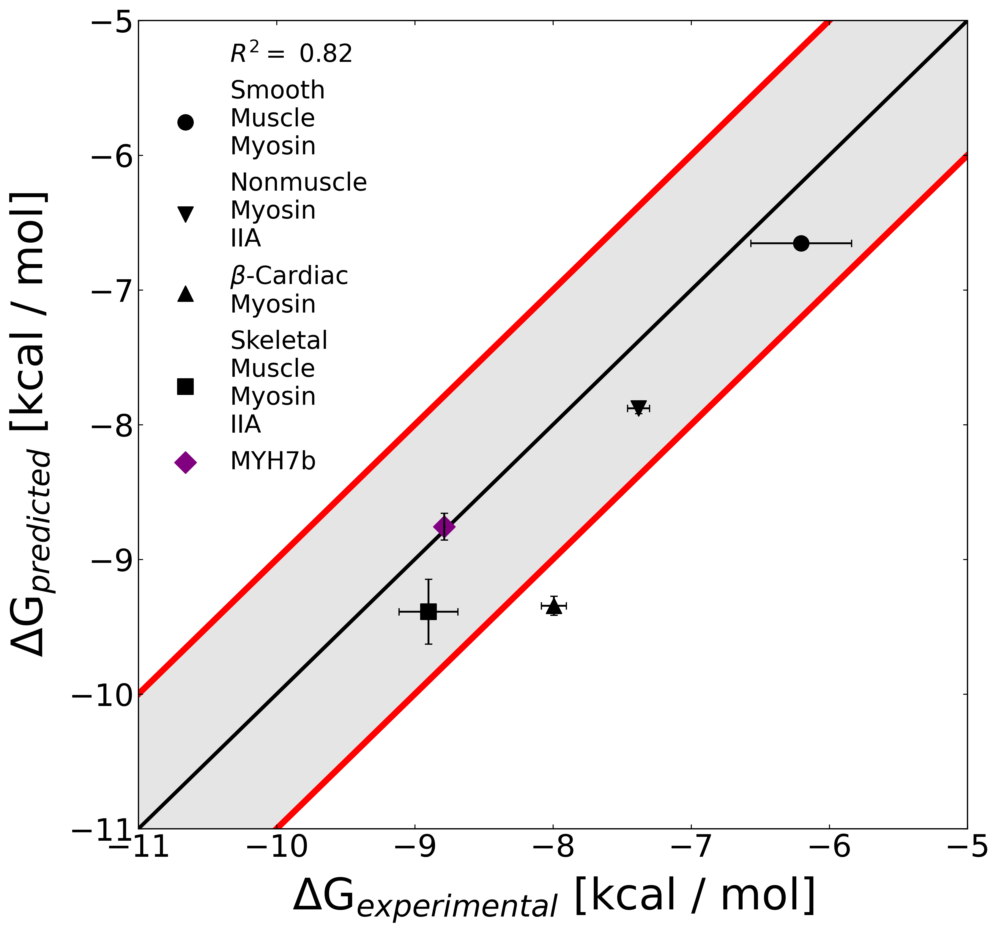

In [601]:
split_labels = {}
for p in isoforms:
    split_labels[p] = "\n".join(labels[p].split())

markers = ["o","v","^","s","D"]
colors = ['k', 'k', 'k', 'k', 'purple']

# run a regression for this isoform
reg = linregress(list(experimental_deltaGs.values()), list(predicted_deltaGs.values()))

x = np.array([max(experimental_deltaGs.values()), min(experimental_deltaGs.values())])
y = reg.slope*x + reg.intercept

fig,ax = plt.subplots(1, 1, figsize=(12,12))

# prepare +- 1kcal graphic
z = np.linspace(-11,-5,100)
ax.plot(z,z,color='black',linewidth=3,zorder=1)
ax.plot(z,z+1,c='red',linewidth=5,zorder=1)
ax.plot(z+1,z,c='red',linewidth=5,zorder=1)

ax.set_xlim(-11,-5)
ax.set_ylim(-11,-5)


ax.fill_between([-20,0], np.array([-20,0])-1, np.array([-20,0])+1, alpha=0.2,color='grey',zorder=1)

ax.plot(x, y, '--', c='gray', label=f'$R^{2}=${reg.rvalue ** 2 : .2f}', alpha=0)

for i in range(len(isoforms)):
    ax.scatter(list(experimental_deltaGs.values())[i], list(predicted_deltaGs.values())[i], 
               color=colors[i], marker=markers[i], label=list(split_labels.values())[i], s=150, zorder=2)

# Add errors
# Standard errror for experimental measurements
xerrs = [
    (
        np.std([IC50_to_deltaG(ic50) for ic50 in experimental_data.loc[experimental_data['Gene'] == g.upper(), 'IC50/Ki']]) / 
        np.sqrt(len(experimental_data.loc[experimental_data['Gene'] == g.upper(), 'IC50/Ki']))
    )
    for g in [p.split('-')[0] for p in isoforms]
]


# 95 % CI for 
# ax.errorbar(
#     list(experimental_deltaGs.values()),
#     list(predicted_deltaGs.values()),
#     xerr=xerrs,
#     yerr=np.array(yerrs).transpose(),
#     fmt='o',markersize=1,zorder=2
# )

# SEM
ax.errorbar(
    list(experimental_deltaGs.values()),
    list(predicted_deltaGs.values()),
    xerr=xerrs,
    yerr=yerrs,
    fmt='o',markersize=1,zorder=3,
    ecolor = 'k', 
    elinewidth = 1.5, capsize = 3, markeredgecolor = 'k'
)

    
ax.set_xlabel(r'$\Delta$G$_{experimental}$ [kcal / mol]', fontsize=35, labelpad=10)
ax.set_ylabel(r'$\Delta$G$_{predicted}$ [kcal / mol]', fontsize=35, labelpad=10)

ax.tick_params(axis='x', labelsize=25)
ax.tick_params(axis='y', labelsize=25)

# ax.set_ylabel(r'pIC$_{50}$',fontsize=35)

ax.legend()

plt.savefig(f'{output_figure_directory}/final-submission/'
            'predicted-vs-experimental-binding-free-energies.pdf',
            dpi=300)

plt.show()

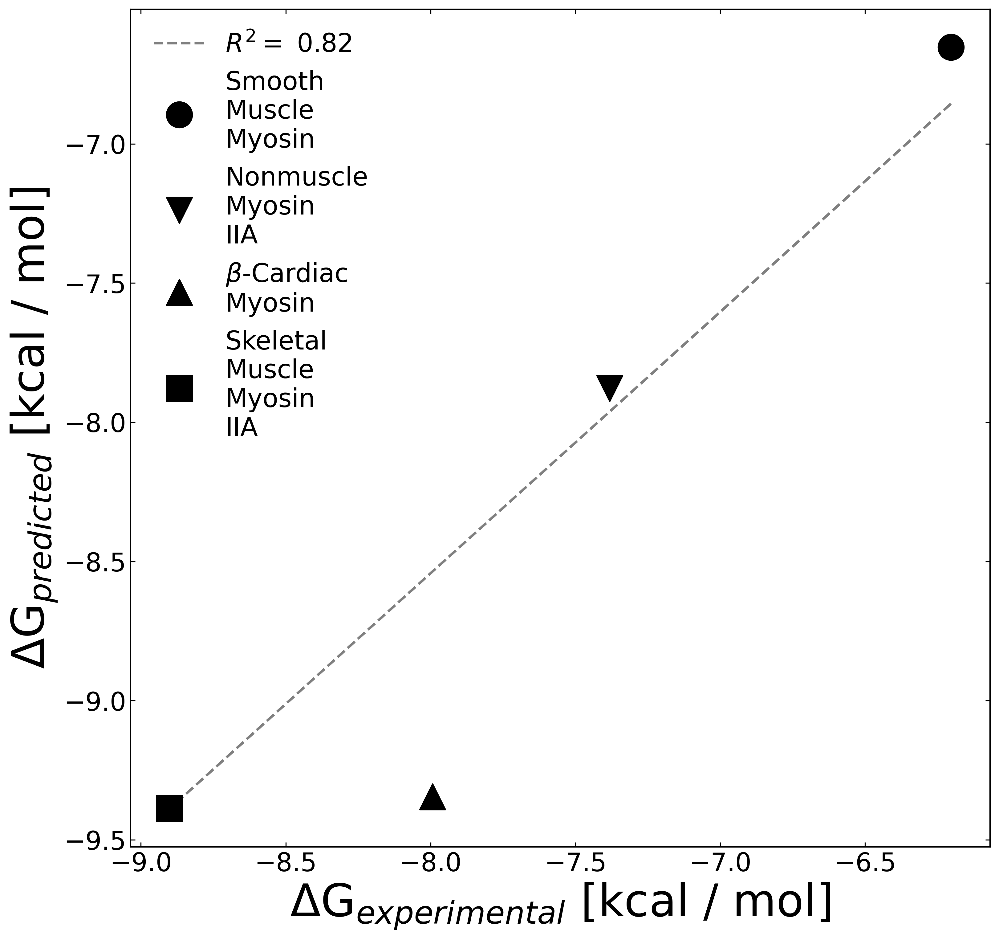

In [620]:
split_labels = {}
for p in isoforms:
    split_labels[p] = "\n".join(labels[p].split())

markers = ["o","v","^","s",">"]

# run a regression for this isoform
reg = linregress(list(experimental_deltaGs.values()), list(predicted_deltaGs.values()))

x = np.array([max(experimental_deltaGs.values()), min(experimental_deltaGs.values())])
y = reg.slope*x + reg.intercept

fig,ax = plt.subplots(1, 1, figsize=(12,12))

# ax.fill_between([-20,0], np.array([-20,0])-1, np.array([-20,0])+1, alpha=0.2,color='grey',zorder=1)

ax.plot(x, y, '--', c='gray', label=f'$R^{2}=${reg.rvalue ** 2 : .2f}', alpha=1)

for i in range(len(isoforms)):
    ax.scatter(list(experimental_deltaGs.values())[i], list(predicted_deltaGs.values())[i], 
               color="k",marker=markers[i], label=list(split_labels.values())[i], s=400, zorder=3)

# Add errors
# Standard errror for experimental measurements
xerrs = [
    (
        np.std([IC50_to_deltaG(ic50) for ic50 in experimental_data.loc[experimental_data['Gene'] == g.upper(), 'IC50/Ki']]) / 
        np.sqrt(len(experimental_data.loc[experimental_data['Gene'] == g.upper(), 'IC50/Ki']))
    )
    for g in [p.split('-')[0] for p in isoforms]
]


# 95 % CI for 
# ax.errorbar(
#     list(experimental_deltaGs.values()),
#     list(predicted_deltaGs.values()),
#     xerr=xerrs,
#     yerr=np.array(yerrs).transpose(),
#     fmt='o',markersize=1,zorder=2
# )

    
ax.set_xlabel(r'$\Delta$G$_{experimental}$ [kcal / mol]',fontsize=35)
ax.set_ylabel(r'$\Delta$G$_{predicted}$ [kcal / mol]',fontsize=35)
# ax.set_ylabel(r'pIC$_{50}$',fontsize=35)

ax.legend()
# plt.savefig(f"figures/fig3/msm_weighted_delta_G_docking_vs_deltaG_actin_activated.pdf",dpi=300)
plt.show()

In [602]:
squared_errors = [
    (exp - pred) ** 2
    for exp, pred in zip(experimental_deltaGs.values(), predicted_deltaGs.values())
]

print(squared_errors)

print(f'RMSE: {np.sqrt(np.mean(squared_errors))}')

absolute_error = [
    np.abs(exp - pred)
    for exp, pred in zip(experimental_deltaGs.values(), predicted_deltaGs.values())
]

print(f'Mean Absolute Error: {np.mean(absolute_error)}')

[0.2015789092209944, 0.24711979404955658, 1.8263309180505778, 0.23766725120804116, 0.0007784086033428555]
RMSE: 0.70900991264333
Mean Absolute Error: 0.562583244303009


## Supplement - Inspecting Poses

### Supplement - Highest scoring poses

In [665]:
for p in predicted_deltaGs:
    ti, fi = ra.where(docking_scores[p] == docking_scores[p].min())
#     print(docking_scores[p][ti[0]][fi[0]])

    # load pickle file with paths
    gene = p.split('-')[0]
    if p == 'myh7b-hs-5n6a':
        docking_paths = np.load(
            f"/{bowmore_path}/bowmore/louiss/binding/myosin/myh7b-final/myh7b-totals/"
            f"extracted_scores/{box}xsmina/blebbistatin.pickle", allow_pickle=True
        )
    else:
        docking_paths = np.load(
            f'/{bowmore_path}/bowmore/louiss/binding/myosin/{gene}-final/{gene}-{n_clusters[p]}-2000/'
            f'extracted_scores/{box}xsmina/'
            'blebbistatin.pickle', allow_pickle=True
        )

    msm_index = docking_paths[ti[0]][fi[0]].parts[-2]
    frame_filename = docking_paths[ti[0]][fi[0]].parts[-1][:-2]
    if p == 'myh7b-hs-5n6a':
        print(f'load {gene}-final/myh7b-totals/MG-receptor/{msm_index}/{frame_filename}, {gene}-prot')
    else:
        print(f'load {gene}-final/{gene}-{n_clusters[p]}-2000/'
              f'MG-receptor/{msm_index}/{frame_filename}, {gene}-prot')
    print(f'load {gene}-final/{docking_paths[ti[0]][fi[0]]}, {gene}-pose')
    print(f'create {gene}-holo, {gene}-prot or {gene}-pose')
    
    

load myh11-final/myh11-50-2000/MG-receptor/33/2455-755.pdb, myh11-prot
load myh11-final/myh11-50-2000/14xsmina/blebbistatin/33/2455-755.pdbqt, myh11-pose
create myh11-holo, myh11-prot or myh11-pose
load myh9-final/myh9-100-2000/MG-receptor/31/929-687.pdb, myh9-prot
load myh9-final/myh9-100-2000/14xsmina/blebbistatin/31/929-687.pdbqt, myh9-pose
create myh9-holo, myh9-prot or myh9-pose
load myh7-final/myh7-100-2000/MG-receptor/31/3752-53059.pdb, myh7-prot
load myh7-final/myh7-100-2000/14xsmina/blebbistatin/31/3752-53059.pdbqt, myh7-pose
create myh7-holo, myh7-prot or myh7-pose
load myh2-final/myh2-50-2000/MG-receptor/41/3754-5146.pdb, myh2-prot
load myh2-final/myh2-50-2000/14xsmina/blebbistatin/41/3754-5146.pdbqt, myh2-pose
create myh2-holo, myh2-prot or myh2-pose
load myh7b-final/myh7b-totals/MG-receptor/99/99-21882.pdb, myh7b-prot
load myh7b-final/myh7b-totals/14xsmina/blebbistatin/99/99-21882.pdbqt, myh7b-pose
create myh7b-holo, myh7b-prot or myh7b-pose


### Supplement - Low RMSD poses

In [695]:
# load ligand heavy atom RMSDs
lig_heavy_atom_RMSDs = {
    p: ra.RaggedArray(np.array(np.load("/mnt/bowmore/bowmanlab/bnovak/github/myosin_pub/louis_blebb/final/"
                                       f"{p.split('-')[0]}-BIT-RMSD.npy", allow_pickle=True),
                               dtype='object'))
    for p in predicted_deltaGs
}

# note that we must load docking scores again because these were saved in a different order
docking_scores = {
    p: ra.RaggedArray(np.array(np.load("/mnt/bowmore/bowmanlab/bnovak/github/myosin_pub/louis_blebb/final/"
                                       f"{p.split('-')[0]}-BIT-score.npy", allow_pickle=True),
                               dtype='object'))
    for p in predicted_deltaGs
}



In [753]:
# determine RMSD of best docking score
for p in lig_heavy_atom_RMSDs:
    ti, fi = ra.where(docking_scores[p] == docking_scores[p].min())
    print(f'{p} best docking score blebbistatin RMSD: {lig_heavy_atom_RMSDs[p][ti[0]][fi[0]]}')

myh11-1br2 best docking score blebbistatin RMSD: 8.15151588005919
myh9-5i4e best docking score blebbistatin RMSD: 7.948299174156994
myh7-5n6a best docking score blebbistatin RMSD: 1.5269662733669007
myh2-5n6a best docking score blebbistatin RMSD: 1.1652606493623567
myh7b-hs-5n6a best docking score blebbistatin RMSD: 0.9451030178164251


In [751]:
# determine which structures to load based on directory tree
for p in ['myh11-1br2', 'myh9-5i4e']:
    ti, fi = ra.where((docking_scores[p] < -6) & (lig_heavy_atom_RMSDs[p] < 3.5))
    
    docking_paths = np.load("/mnt/bowmore/bowmanlab/bnovak/github/myosin_pub/louis_blebb/final/"
                            f"{p.split('-')[0]}_directory_tree.npy", allow_pickle=True)
    msm_index = docking_paths[ti[0]][fi[0]].split('/')[-2]
    frame_filename = docking_paths[ti[0]][fi[0]].split('/')[-1][:-4]
    
    gene = p.split('-')[0]
    if p == 'myh7b-hs-5n6a':
        print(f'load {gene}-final/myh7b-totals/MG-receptor/{msm_index}/{frame_filename}.pdb, {gene}-prot')
    else:
        print(f'load {gene}-final/{gene}-{n_clusters[p]}-2000/'
              f'MG-receptor/{msm_index}/{frame_filename}.pdb, {gene}-prot')
    print(f'load {gene}-final/{gene}-{n_clusters[p]}-2000/14xsmina/blebbistatin/'
          f'{msm_index}/{frame_filename}.pdbqt, '
          f'{gene}-pose')
    print(f'create {gene}-holo, {gene}-prot or {gene}-pose')

load myh11-final/myh11-50-2000/MG-receptor/21/62-629.pdb, myh11-prot
load myh11-final/myh11-50-2000/14xsmina/blebbistatin/21/62-629.pdbqt, myh11-pose
create myh11-holo, myh11-prot or myh11-pose
load myh9-final/myh9-100-2000/MG-receptor/39/3756-18413.pdb, myh9-prot
load myh9-final/myh9-100-2000/14xsmina/blebbistatin/39/3756-18413.pdbqt, myh9-pose
create myh9-holo, myh9-prot or myh9-pose


In [750]:
for p in ['myh11-1br2', 'myh9-5i4e']:
    ti, fi = ra.where((docking_scores[p] < -6) & (lig_heavy_atom_RMSDs[p] < 3.5))
    print(ti, fi)
    print(docking_scores[p][ti[0]][fi[0]], lig_heavy_atom_RMSDs[p][ti[0]][fi[0]])

[14 20 41 44] [40  0 40 11]
-6.25801229 3.0244263997688963
[33 33] [ 7 15]
-6.32946634 3.1772720854157117


## Pocket Sequence Comparison

In [775]:
# Load functions in util
import sys
module_path = f"{bowmore_path}/bowmore/ameller/projects/util"
if module_path not in sys.path:
    sys.path.append(module_path)

from util import generate_msa

In [776]:
prots_for_alignment = list(topologies.values()) + [xtal_1yv3]
prot_names_for_alignment = list(topologies.keys()) + ['1YV3']

pdb2msa, msa2rind = generate_msa(prots_for_alignment, prot_names_for_alignment, version='old')

In [782]:
# find sequence differences between select isoforms
cutoff_distance = 1
p1 = 'myh7b-hs-5n6a'
p2 = 'myh7-5n6a'

contact_atoms = md.compute_neighbors(xtal_1yv3, cutoff_distance, xtal_1yv3.top.select("resname BIT"), 
                                     xtal_1yv3.top.select('protein'))[0]
contact_resis = np.unique([xtal_1yv3.top.atom(ai).residue.resSeq for ai in contact_atoms])
contact_resids = np.unique([xtal_1yv3.top.atom(ai).residue.index for ai in contact_atoms])

difference_count = 0
for ri in contact_resids:
    mapped_resid1 = msa2rind[p1][pdb2msa['1YV3'][ri]]
    mapped_resid2 = msa2rind[p2][pdb2msa['1YV3'][ri]]
    
    if topologies[p1].top.residue(mapped_resid1).code != topologies[p2].top.residue(mapped_resid2).code:
        print(topologies[p1].top.residue(mapped_resid1), topologies[p2].top.residue(mapped_resid2))
        difference_count += 1
        
print(f'fraction the same: {(len(contact_resids) - difference_count) / len(contact_resids) : .2f}')
print(f'fraction different: {difference_count / len(contact_resids) : .2f}')

ASP267 GLU264
SER268 THR265
ASP436 GLU433
ARG440 ASN437
LEU534 MET531
GLN656 ALA649
LYS659 ARG652
fraction the same:  0.91
fraction different:  0.09


In [779]:
# for visualization purposes
temp = []
for ri in contact_resids:
    mapped_resid1 = msa2rind[p1][pdb2msa['1YV3'][ri]]
    mapped_resid2 = msa2rind[p2][pdb2msa['1YV3'][ri]]
    
    if topologies[p1].top.residue(mapped_resid1).code != topologies[p2].top.residue(mapped_resid2).code:
        temp.append(topologies[p1].top.residue(mapped_resid1).resSeq)
        
print('+'.join(str(r) for r in temp))

temp = []
for ri in contact_resids:
    mapped_resid1 = msa2rind[p1][pdb2msa['1YV3'][ri]]
    mapped_resid2 = msa2rind[p2][pdb2msa['1YV3'][ri]]
    
    if topologies[p1].top.residue(mapped_resid1).code != topologies[p2].top.residue(mapped_resid2).code:
        temp.append(topologies[p2].top.residue(mapped_resid2).resSeq)
        
print('+'.join(str(r) for r in temp))

267+268+436+440+534+656+659
264+265+433+437+531+649+652


# Figure 4 - eLife Isoform Data

In [755]:
specs = {
    'myh11-gg-wt': '4.9',
#     'myh11-gg-ala': '4.9',
#     'myh11-gg-del': '5.0',
#     'myh11-gg-dicty': '5.2',
#     'myh10-myh7init': '5.3',
#     'myh10-myh7init-noinserts': '5.3',
#     'myh13': '7.4',
    'myh7': '7.34',
#     'myh7-myh6loop': '5.3',
    'myo2b': '8.0',
    'myo1b': '6.6',
    'myo5a': '7.25',
#     'myo6': '6.9',
    'myo7a': '5.5',
    'myo10': '5.0'
}
lag_times = {
    'myh13': 40,
    'myh7':  50,
    'myo2b': 150,
    'myh10-noinserts': 150,
    'myo1b': 80,
    'myo1b-myh7init-nterm': 80,
    'myo5a': 40,
    'myo6':  90,
    'myo7a': 40,
    'myo10': 40,
    'myh11-gg-wt': 150,
    'myh11-gg-ala': 150,
    'myh11-gg-del': 150,
    'myh11-gg-dicty': 150,
    'myh11-gg-rat-beta': 150,
#     'myh10-myh7init': 50,
#     'myh10-myh7init-noinserts': 50,
    'myh7-myh6loop': 50,
}

In [756]:
os.chdir(f'/{bowmore_path}/bowmanlab/jrporter/projects/myosin')
eq_probs = {}
for protein, cluster_radius in specs.items():
    lag_time = lag_times[protein]
    eq_probs[protein] = np.loadtxt(f'data/{protein}/models/'
        f'{protein}-2.80A-sub1-sidechains-khybrid-{cluster_radius}-euclidean-kmedoids5-01prior-{lag_time}lt-msm/'
        f'eq-probs.dat')

    print(f"eq_probs.shape for {protein} (num centers): ",eq_probs[protein].shape[0])
os.chdir(f'/{bowmore_path}/bowmore/ameller/projects/notebooks')

eq_probs.shape for myh11-gg-wt (num centers):  11952
eq_probs.shape for myh7 (num centers):  5128
eq_probs.shape for myo2b (num centers):  10276
eq_probs.shape for myo1b (num centers):  6458
eq_probs.shape for myo5a (num centers):  4728
eq_probs.shape for myo7a (num centers):  4882
eq_probs.shape for myo10 (num centers):  9889


In [757]:
fah_pocket_vol_files = {
    "myh11-gg-wt" : "myh11-gg-wt-2.80A-sub1-sidechains-khybrid-4.9-euclidean-kmedoids5-structure_1YV3_min_rank_6__grid_spacing_0.07_probe_radius_0.14min_cluster_size_3max_dist_from_ligand_0.25_pocket_grid_points.npz",
    "myh7" :"myh7-2.80A-sub1-sidechains-khybrid-7.34-euclidean-kmedoids5-structure_1YV3_min_rank_6__grid_spacing_0.07_probe_radius_0.14min_cluster_size_3max_dist_from_ligand_0.25_pocket_grid_points.npz",
    "myo10" : "myo10-2.80A-sub1-sidechains-khybrid-5.0-euclidean-kmedoids5-structure_1YV3_min_rank_6__grid_spacing_0.07_probe_radius_0.14min_cluster_size_3max_dist_from_ligand_0.25_pocket_grid_points.npz",
    "myo1b" : "myo1b-2.80A-sub1-sidechains-khybrid-6.6-euclidean-kmedoids5-structure_1YV3_min_rank_6__grid_spacing_0.07_probe_radius_0.14min_cluster_size_3max_dist_from_ligand_0.25_pocket_grid_points.npz",
    "myo2b" : "myo2b-2.80A-sub1-sidechains-khybrid-8.0-euclidean-kmedoids5-structure_1YV3_min_rank_6__grid_spacing_0.07_probe_radius_0.14min_cluster_size_3max_dist_from_ligand_0.25_pocket_grid_points.npz",
    "myo5a" : "myo5a-2.80A-sub1-sidechains-khybrid-7.25-euclidean-kmedoids5-structure_1YV3_min_rank_6__grid_spacing_0.07_probe_radius_0.14min_cluster_size_3max_dist_from_ligand_0.25_pocket_grid_points.npz",}

fah_pocket_vol = {}
grid_spacing = 0.7
path = f"/{bowmore_path}/bowmore/ameller/projects/allostery/pockets"
for i, p in enumerate(fah_pocket_vol_files):
#     print(os.path.join(path,fah_pocket_vol_files[i]))
    pocket_grid_points = np.load(os.path.join(path,fah_pocket_vol_files[p]),allow_pickle=True)['pocket_grid_points']
    pocket_size = np.array([gp.shape[0] for gp in pocket_grid_points]) * grid_spacing ** 3
    fah_pocket_vol[p] = pocket_size
# fah_isoforms = ["myh7","myo10","myo1b","myo2b","myo5a","]#,"myo7a"]

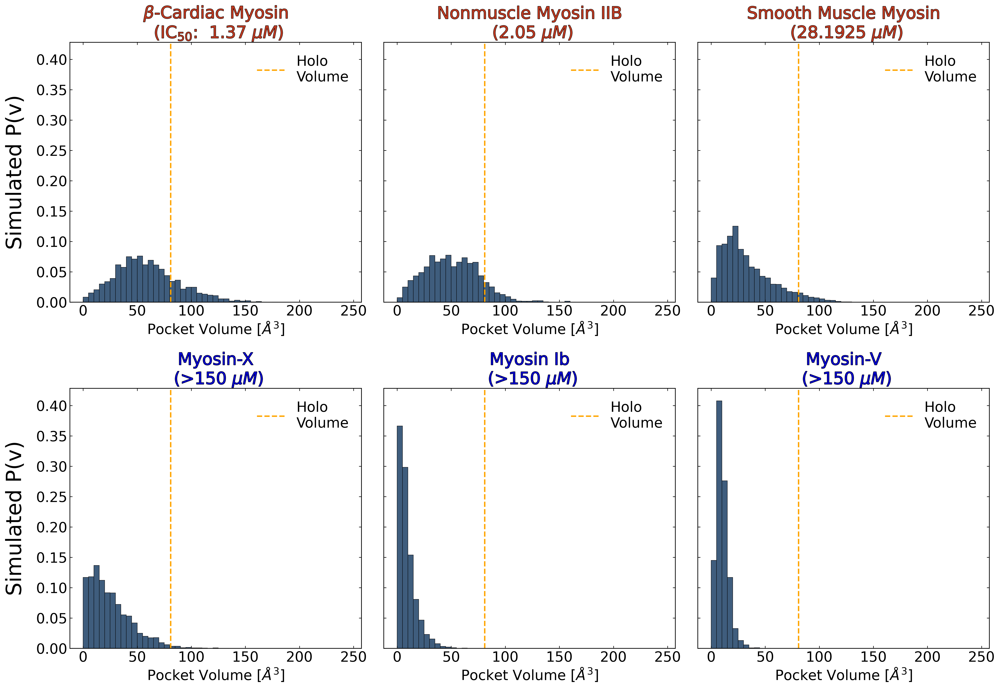

In [762]:
figure_names = {
    'myo5a': 'Myosin-V',
    'myo1b': 'Myosin Ib', 
    'myo10': 'Myosin-X',
    'myh11-gg-wt': 'Smooth Muscle Myosin',
    'myo2b': 'Nonmuscle Myosin IIB',
    'myh7': r'$\beta$-Cardiac Myosin'
}

isoforms_ordered_by_IC50 = ['myo5a', 'myo1b', 'myo10', 'myh11-gg-wt', 'myo2b', 'myh7']
isoforms_ordered_by_IC50 = list(reversed(isoforms_ordered_by_IC50))

# print(labels_dict.k)
# labels = [
#         figure_names[p] + '\n (IC$_{50}$: %s $\mu M$)' %IC50s[p] if IC50s[p] < 150 and i==5 else
#         figure_names[p] + '\n (%s $\mu M$)' %IC50s[p] if IC50s[p] < 150 else
#         figure_names[p] + '\n (>%s $\mu M$)' %IC50s[p] for i, p in enumerate(isoforms_ordered_by_IC50)
# ]
# labels_dict = {p: labels[i] for i,p in enumerate(isoforms_ordered_by_IC50)}

labels_dict = {
    p: (
        figure_names[p] + "\n (IC$_{50}$: " + f"{IC50s[p.split('-')[0]] : .2f} $\mu M$)" if i==0 else
        figure_names[p] + f"\n ({IC50s[p.split('-')[0]]} $\mu M$)" if IC50s[p.split('-')[0]] < 150 else
        figure_names[p] + f"\n (>{IC50s[p.split('-')[0]]} $\mu M$)"
        
    )
    for i, p in enumerate(isoforms_ordered_by_IC50)
}

fig, axes = plt.subplots(2, 3, figsize=(20,14), sharex=True, sharey=True)

bins = np.arange(0,250,5)
for i in range(2):
    for j in range(3):
        p = isoforms_ordered_by_IC50[i*3 + j]
        axes[i, j].hist(fah_pocket_vol[p], weights=eq_probs[p],
                        bins=bins, color="#3F5D7D", edgecolor="black", linewidth=0.5)
        axes[i, j].axvline(holo_pocket_vol*gp_volume, color='orange', linestyle='--', label='Holo\nVolume')
        
        # make x tick labels visible in all the subplots
        axes[i, j].tick_params(axis='x', labelsize=20, labelbottom=True)
        axes[i, j].set_xticks(np.arange(0,300,50))
        
        axes[i, j].set_xlabel(r"Pocket Volume [$\AA^{3}$]")
        # only show x axis label in leftmost subplot
        if j == 0:
            axes[i, j].set_ylabel("Simulated P(v)", fontsize=30, labelpad=15)

        # code for manual setting of xtick labels
#         axes[i, j].set_yticks(np.arange(0,0.1,0.025))
#         axes[i, j].set_yticklabels([str(round(float(val),3)) for val in np.arange(0,0.1,0.025)])
        if p in ["myo5a","myo1b","myo10"]:
            color="mediumblue" 
            axes[i, j].set_title(labels_dict[p],color=color,fontsize=24).set_path_effects([PathEffects.withStroke(linewidth=1, foreground='k')])
        else:
            color='#c23b22'
            axes[i, j].set_title(labels_dict[p],color=color,fontsize=24).set_path_effects([PathEffects.withStroke(linewidth=1, foreground='k')])
        
        axes[i,j].legend()

plt.tight_layout()
plt.savefig(f"{bowmore_path}/bowmore/ameller/projects/figures/specificity/final-submission/"
            "elife-pocket-volume-distributions.pdf", dpi=300)

plt.show()

## P Compatible

In [763]:
isoforms_ordered_by_IC50 = list(reversed(isoforms_ordered_by_IC50))

myo5a standard error:  0.0
myo1b standard error:  0.0
myo10 standard error:  0.0031298057411592926
myh11-gg-wt standard error:  0.013689375540533311
myo2b standard error:  0.009492669716673377
myh7 standard error:  0.011070945605573982


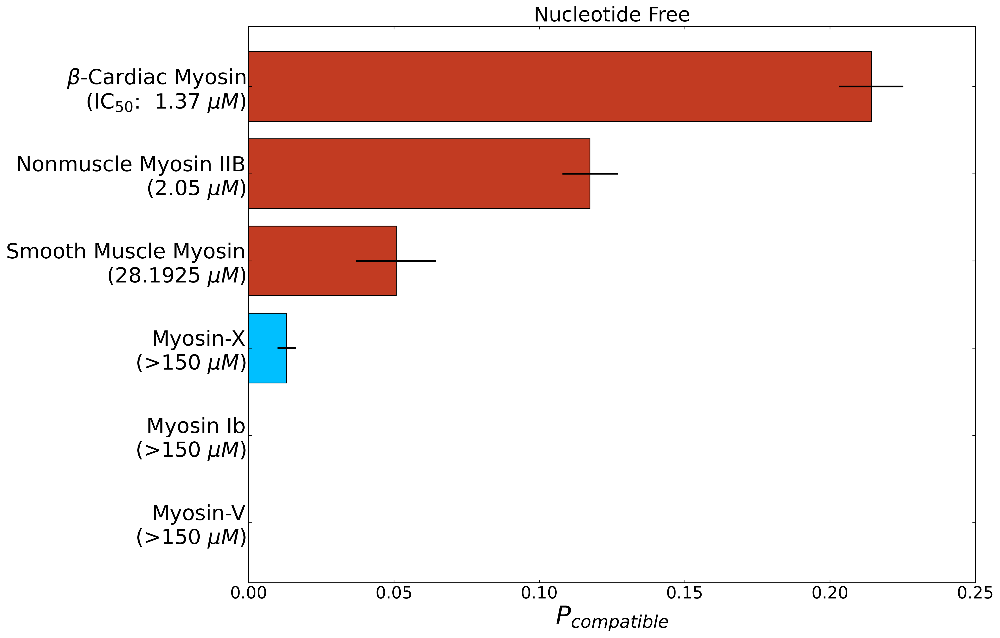

In [764]:
colors = ['deepskyblue', 'deepskyblue', 'deepskyblue', '#c23b22', '#c23b22', '#c23b22' ]

# need absolute path
with open(f"{bowmore_path}/bowmanlab/j.lotthammer/notebooks/"
          "elife_pocket_vols_n_trials250.pickle","rb") as f:
    p_comps = pickle.load(f)

n_trials = 250
fig,ax = plt.subplots(1,1,figsize=(17,11))
for i, p in enumerate(isoforms_ordered_by_IC50):
    prob_compatible = np.mean(p_comps[p])
    xerr = np.std(np.array(p_comps[p]).squeeze()) 
    print(f"{p} standard error: ",xerr)
    plt.barh(i, prob_compatible, xerr=xerr, color=colors[i], edgecolor='black')

plt.yticks(range(len(isoforms_ordered_by_IC50)), [labels_dict[p] for p in isoforms_ordered_by_IC50], fontsize=25)
plt.xlabel('$P_{compatible}$', fontsize=30)
plt.xticks(np.arange(0, 0.3, 0.05), fontsize=20)
plt.title("Nucleotide Free")
plt.tight_layout()

plt.savefig(f"{bowmore_path}/bowmore/ameller/projects/figures/specificity/supplement/"
            "elife-p-comp.pdf", dpi=300)
plt.show()